In [1]:
import os
from tqdm import tqdm
import random 

import time

inf=float("inf")
import numpy as np
np.random.seed(42)
import pandas as pd
import scipy as sp
import math

import matplotlib.pyplot as plt
plt.style.use('ggplot')

import stablerank.srank as sr
import fMRIanalysis.data as data

from scipy.cluster import hierarchy
from scipy.stats import skewnorm
from scipy.stats import norm
from scipy.special import erf
from scipy.special import owens_t

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.cluster import DBSCAN
import umap

import scipy.spatial as spatial

plt.rcParams['figure.figsize'] = (7, 7)
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['font.size'] = 22
plt.rcParams['font.size'] = 22
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['text.usetex'] = True

fig_path = os.path.abspath(os.path.join(os.getcwd(), os.pardir)) + "\\ThesisReport\\Images\\Python\\"
fig_path

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



'C:\\Users\\naomi\\OneDrive\\Documenten\\COSSE\\Courses\\MSc year 2\\Thesis\\ThesisReport\\Images\\Python\\'

In [2]:
testing = False
save = False
show = False

m = 200 #number of brain regions
N = 205 #length of time series

In [119]:
prePHparam = dict()
prePHparam['methods'] = ['delayedPearson\\C200_delay'+str(i) for i in range(1, 8)]*6 + ['dtw']
prePHparam['symmetrizations'] = ['maximum']*7 + ['symmetric_part']*7 + ['antisymmetric_part']*7 + ['transpose_multiplication']*7 + ['pdist_rows']*7 + ['pdist_columns']*7 + [None]
prePHparam['neg_vals_methods'] = ['abs'] * 42 + [None]
prePHparam['cor_to_dist_funcs'] = ['linear'] * 42 + [None]
prePHparam = pd.DataFrame.from_dict(prePHparam)

homologies = ["H0_single", "H0_average", "H0_complete", "H1"]

In [120]:
prePHparam

,methods,symmetrizations,neg_vals_methods,cor_to_dist_funcs
0,delayedPearson\C200_delay1,maximum,abs,linear
1,delayedPearson\C200_delay2,maximum,abs,linear
2,delayedPearson\C200_delay3,maximum,abs,linear
3,delayedPearson\C200_delay4,maximum,abs,linear
4,delayedPearson\C200_delay5,maximum,abs,linear
5,delayedPearson\C200_delay6,maximum,abs,linear
6,delayedPearson\C200_delay7,maximum,abs,linear
7,delayedPearson\C200_delay1,symmetric_part,abs,linear
8,delayedPearson\C200_delay2,symmetric_part,abs,linear
9,delayedPearson\C200_delay3,symmetric_part,abs,linear


In [5]:
#prePHparam = prePHparam.loc[[0, 7, 14, 21, 28, 35, 42], :]
#prePHparam = prePHparam.loc[[21, 42], :]

In [121]:
dist_mats = {}
for comb_id in tqdm(prePHparam.index):
    dist_mats[comb_id] = dict()
    for subject in data.train_subjects:
        dist_mats[comb_id][subject] = data.DistanceMatrix(subject,
                                                             cohort="PD",
                                                             method=prePHparam.loc[comb_id,'methods'],
                                                             symmetrization=prePHparam.loc[comb_id,'symmetrizations'],
                                                             neg_vals_method=prePHparam.loc[comb_id,'neg_vals_methods'], 
                                                             cor_to_dist_func=prePHparam.loc[comb_id,'cor_to_dist_funcs'], 
                                                             connectivity_density=1).dist_mat

100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [01:14<00:00,  1.73s/it]


# Choose suitable sample size and number of instances

In [2301]:
n = 20
sample_sizes = [20, 50, 80]
numbers_instances = [20, 50, 100, 200, 400]

## H0

In [51]:
if testing:
    n = 5
    sample_sizes = [20, 50] #[4, 8]
    numbers_instances = [20, 50] #[2, 5, 10]

sample_sizes = [80]
numbers_instances = [200]

stds = dict()
for comb_id in tqdm(prePHparam.index):
    d = sr.Distance(dist_mats[comb_id][list(dist_mats[comb_id].keys())[0]])
    stds[comb_id] = dict()
    
    for j in range(len(numbers_instances)):
        number_instances = numbers_instances[j]

        #fig, ax = plt.subplots(2, len(sample_sizes), figsize=(20, 2*7))
        #plt.subplots_adjust(hspace=0.3)
        
        stds[comb_id][number_instances] = dict()
        
        for k in range(len(sample_sizes)):
            sample_size = sample_sizes[k]

            hsrs_H0_subject1 = dict()
            hsrs_H0_subjects = dict()

            for subject in data.train_subjects[0:n]:
                d = sr.Distance(dist_mats[comb_id][subject])
                sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
                hsrs_H0_subjects[subject] = d.get_h0sr(sample=sample, clustering_method="single")
                #hsrs_H0_subjects[subject].plot(ax = ax[0, k], color = 'k')
                
            start = time.time()
            for i in range(n):
                sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
                hsrs_H0_subject1[i] = d.get_h0sr(sample=sample, clustering_method="single")
                #hsrs_H0_subject1[i].plot(ax = ax[0, k])
            end = time.time()

            integral_dists_subject1 = sr.SrObject([hsr for _, hsr in hsrs_H0_subject1.items()]).get_distance()
            integral_dists_subjects = sr.SrObject([hsr for _, hsr in hsrs_H0_subjects.items()]).get_distance()

            std_1 = np.median(np.array(integral_dists_subject1))
            std_all = np.median(np.array(integral_dists_subjects))

            stds[comb_id][number_instances][sample_size] = std_1/std_all
            
            #ax[0, k].set_title(str(number_instances)+" inst., "+str(round(sample_size, 0))+" samples")
            #ax[0, k].set_xlabel('$t$')
            
            #ax[1, k].hist(integral_dists_subjects, color = 'k', bins = 10)
            #ax[1, k].hist(integral_dists_subject1, color = 'r', bins = 10)
            #ax[1, k].set_title(str(round(end-start, 4))+"s, std ratio: "+str(round(std_1/std_all,6)))
            #ax[1, k].set_xlabel("pairwise integral distances")
        
        #ax[1, 0].set_ylabel("counts")
        #ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
        
        #if testing:
        #    addOn = "test_"
        #else:
        #    addOn = ""
        #if save:
        #    plt.savefig(fig_path+addOn+"SampleSize_H0_comb"+str(comb_id)+"_instances"+str(number_instances)+".jpg", bbox_inches="tight")
        #if show:
        #    plt.show()
        #plt.close()

100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [01:47<00:00, 53.53s/it]


## H1

In [2325]:
if testing:
    n = 5
    sample_sizes = [20, 50] #[4, 8]
    numbers_instances = [20, 50] #[2, 5, 10]

stds_H1 = dict()
time_H1 = dict()
for comb_id in tqdm(prePHparam.index):
    d = sr.Distance(dist_mats[comb_id][list(dist_mats[comb_id].keys())[0]])
    stds_H1[comb_id] = dict()
    time_H1[comb_id] = dict()
    
    for j in range(len(numbers_instances)):
        number_instances = numbers_instances[j]

        fig, ax = plt.subplots(2, len(sample_sizes), figsize=(20, 2*7))
        plt.subplots_adjust(hspace=0.3)
        
        stds_H1[comb_id][number_instances] = dict()
        time_H1[comb_id][number_instances] = dict()
        
        for k in range(len(sample_sizes)):
            sample_size = sample_sizes[k]

            hsrs_H1_subject1 = dict()
            hsrs_H1_subjects = dict()

            for subject in data.train_subjects[0:n]:
                d = sr.Distance(dist_mats[comb_id][subject])
                sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
                barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
                hsrs_H1_subjects[subject] = sr.bc_to_sr(barcode, degree = "H1")
                hsrs_H1_subjects[subject].plot(ax = ax[0, k], color = 'k')
                
            start = time.time()
            for i in range(n):
                sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
                barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
                hsrs_H1_subject1[i] = sr.bc_to_sr(barcode, degree = "H1")
                hsrs_H1_subject1[i].plot(ax = ax[0, k])
            end = time.time()

            integral_dists_subject1 = sr.SrObject([hsr for _, hsr in hsrs_H1_subject1.items()]).get_distance()
            integral_dists_subjects = sr.SrObject([hsr for _, hsr in hsrs_H1_subjects.items()]).get_distance()

            std_1 = np.median(np.array(integral_dists_subject1))
            std_all = np.median(np.array(integral_dists_subjects))

            stds_H1[comb_id][number_instances][sample_size] = std_1/std_all
            time_H1[comb_id][number_instances][sample_size] = end - start
            
            ax[0, k].set_title(str(number_instances)+" inst., "+str(round(sample_size, 0))+" samples")
            ax[0, k].set_xlabel('$t$')
            
            ax[1, k].hist(integral_dists_subjects, color = 'k', bins = 10)
            ax[1, k].hist(integral_dists_subject1, color = 'r', bins = 10)
            ax[1, k].set_title(str(round(end-start, 4))+"s, std ratio: "+str(round(std_1/std_all,6)))
            ax[1, k].set_xlabel("pairwise integral distances")
        
        ax[1, 0].set_ylabel("counts")
        ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
        
        
        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"SampleSize_H1_comb"+str(comb_id)+"_instances"+str(number_instances)+".jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()

100%|███████████████████████████████████████████████████████████████████████████████| 43/43 [5:35:55<00:00, 468.73s/it]


## Plot error overview

In [2358]:
start = time.time()
for i in range(n):
    sample = sr.get_sample(number_instances=400, sample_size=50, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H1_subject1[i] = sr.bc_to_sr(barcode, degree = "H1")
    hsrs_H1_subject1[i].plot(ax = ax[0, k])
end = time.time()
print(end-start)

13.828287839889526


In [2359]:
start = time.time()
for i in range(n):
    sample = sr.get_sample(number_instances=200, sample_size=80, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H1_subject1[i] = sr.bc_to_sr(barcode, degree = "H1")
    hsrs_H1_subject1[i].plot(ax = ax[0, k])
end = time.time()
print(end-start)

14.84792447090149


In [2366]:
print(np.std([stds_H1[comb_id][400][50]for comb_id in range(43)]))
print(np.std([stds_H1[comb_id][200][80]for comb_id in range(43)]))

0.06000884237040302
0.061751751342770715


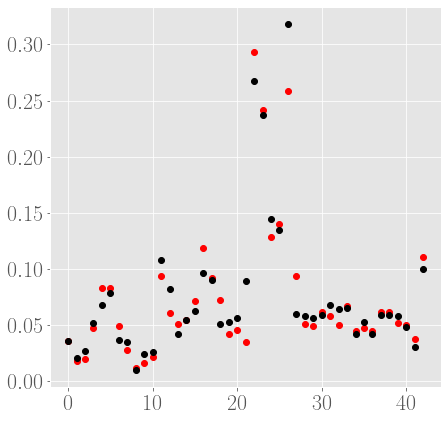

In [2362]:
for comb_id in range(43):
    plt.plot(comb_id, stds_H1[comb_id][400][50], 'or')
    plt.plot(comb_id, stds_H1[comb_id][200][80], 'ok')

In [633]:
def flatten_dict(dd, separator = '_', prefix = ''):
    return { prefix + separator + str(k) if prefix else str(k) : v
             for kk, vv in dd.items()
             for k, v in flatten_dict(vv, separator, str(kk)).items()
             } if isinstance(dd, dict) else { prefix : dd }

In [2023]:
save = False
show = True

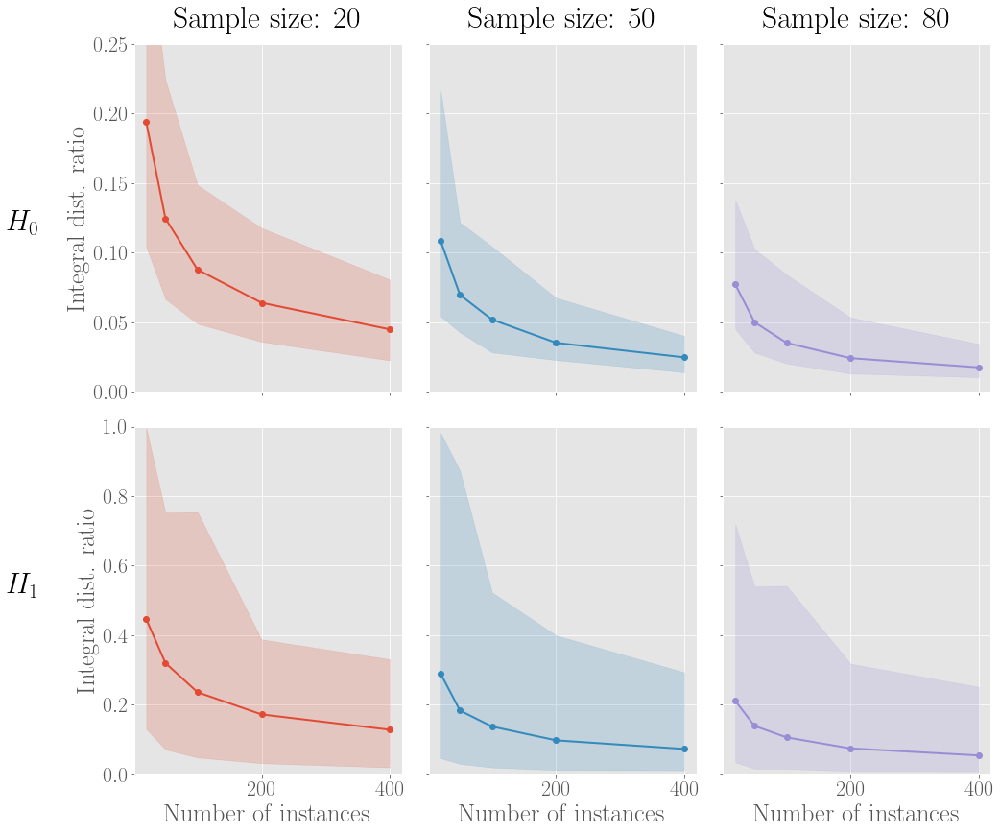

In [2383]:
min_stds = dict()
max_stds = dict()
mean_stds = dict()

for number_instances in numbers_instances:
    min_stds[number_instances] = dict()
    max_stds[number_instances] = dict()
    mean_stds[number_instances] = dict()
    
    for sample_size in sample_sizes:
        temp_std_list = []
        for comb_id in prePHparam.index:
            temp_std_list.append(stds[comb_id][number_instances][sample_size])
        min_stds[number_instances][sample_size] = min(temp_std_list)    
        max_stds[number_instances][sample_size] = max(temp_std_list)
        mean_stds[number_instances][sample_size] = np.mean(temp_std_list)
        
fig, ax = plt.subplots(2, 3, figsize=(16, 14))
plt.subplots_adjust(hspace=0.1)
plt.subplots_adjust(wspace=0.1)
plt.text(0.01, 1.25/4, '$H_1$', fontsize=30, transform=plt.gcf().transFigure)
plt.text(0.01, 2.75/4, '$H_0$', fontsize=30, transform=plt.gcf().transFigure)

i = 0
means = dict()

for sample_size in sample_sizes:
    label = 'Sample size: ' + str(sample_size)
    temp_min_list = np.array([min_stds[number_instances][sample_size] for number_instances in numbers_instances])
    temp_max_list = np.array([max_stds[number_instances][sample_size] for number_instances in numbers_instances])
    temp_mean_list = np.array([mean_stds[number_instances][sample_size] for number_instances in numbers_instances])
    ax[0, i].fill_between(numbers_instances, temp_min_list, temp_max_list, color = 'C'+str(i), alpha = 0.2)
    ax[0, i].plot(numbers_instances, temp_mean_list, 'o-', color = 'C'+str(i), label = label)
    means[sample_size] = temp_mean_list
    ax[0, i].set_ylim(0, 0.25)
    ax[0, i].set_xticklabels([])
    ax[0, i].set_title(label, y = 1.03)
    
    i += 1
    
ax[0, 0].set_ylabel('Integral dist. ratio')

#H1
min_stds = dict()
max_stds = dict()
mean_stds = dict()

for number_instances in numbers_instances:
    min_stds[number_instances] = dict()
    max_stds[number_instances] = dict()
    mean_stds[number_instances] = dict()
    
    for sample_size in sample_sizes:
        temp_std_list = []
        for comb_id in prePHparam.index:
            temp_std_list.append(stds_H1[comb_id][number_instances][sample_size])
        min_stds[number_instances][sample_size] = min(temp_std_list)    
        max_stds[number_instances][sample_size] = max(temp_std_list)
        mean_stds[number_instances][sample_size] = np.mean(temp_std_list)
        
#fig, ax = plt.subplots(1, 3, figsize=(20, 7))

i = 0
means = dict()

for sample_size in sample_sizes:
    label = 'Sample size: ' + str(sample_size)
    temp_min_list = np.array([min_stds[number_instances][sample_size] for number_instances in numbers_instances])
    temp_max_list = np.array([max_stds[number_instances][sample_size] for number_instances in numbers_instances])
    temp_mean_list = np.array([mean_stds[number_instances][sample_size] for number_instances in numbers_instances])
    ax[1, i].fill_between(numbers_instances, temp_min_list, temp_max_list, color = 'C'+str(i), alpha = 0.2)
    ax[1, i].plot(numbers_instances, temp_mean_list, 'o-', color = 'C'+str(i), label = label)
    means[sample_size] = temp_mean_list
    ax[1, i].set_ylim(0, 1)
    ax[1, i].set_xlabel('Number of instances')
    
    i += 1
    
for i in range(2):
    for j in range(1, 3):
        ax[i, j].set_yticklabels([])
        
ax[1, 0].set_ylabel('Integral dist. ratio')
if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"SampleSize_overview.jpg", bbox_inches="tight")
plt.show()
plt.close()

### Plot worst and best case H0

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:21<00:00,  1.10s/it]


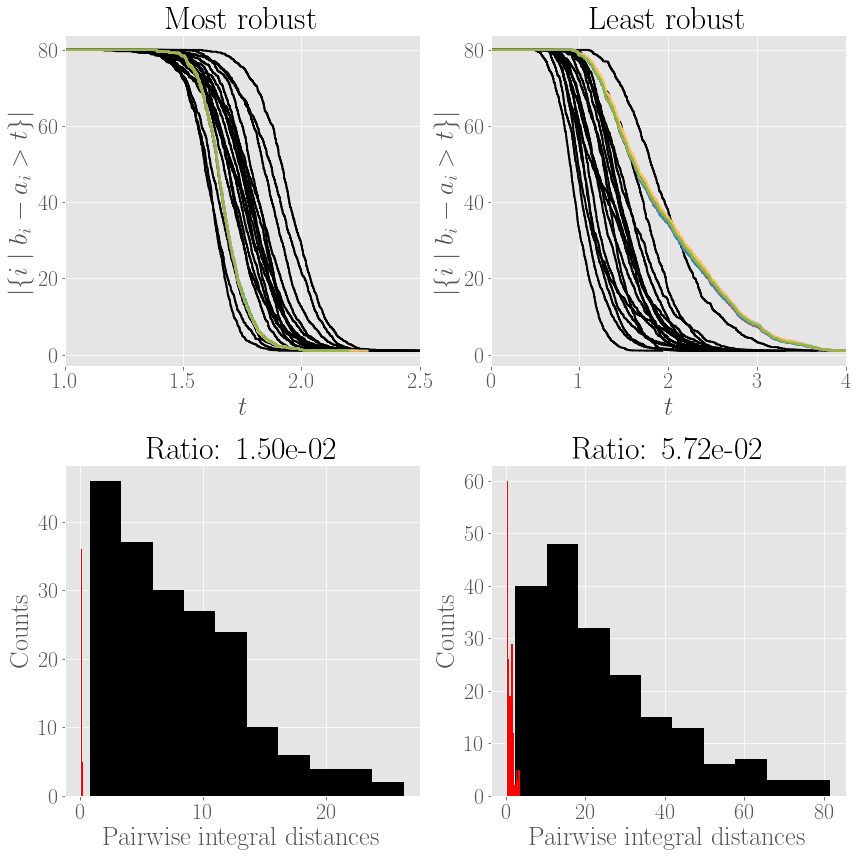

In [54]:
n = 20
sample_size = 80
number_instances = 200

fig, ax = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3)

#H0 best
comb_id = 41

d = sr.Distance(dist_mats[comb_id][list(dist_mats[comb_id].keys())[0]])

hsrs_H0_subject1 = dict()
hsrs_H0_subjects = dict()

for subject in tqdm(data.train_subjects[0:n]):
    d = sr.Distance(dist_mats[comb_id][subject])
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subjects[subject] = d.get_h0sr(sample=sample, clustering_method="single")
    hsrs_H0_subjects[subject].plot(ax = ax[0, 0], color = 'k')

for i in tqdm(range(n)):
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subject1[i] = d.get_h0sr(sample=sample, clustering_method="single")
    hsrs_H0_subject1[i].plot(ax = ax[0, 0])

integral_dists_subject1_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subject1.items()]).get_distance()
integral_dists_subjects_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subjects.items()]).get_distance()

std_1_H0 = np.median(np.array(integral_dists_subject1_H0))
std_all_H0 = np.median(np.array(integral_dists_subjects_H0))

ax[1, 0].hist(integral_dists_subjects_H0, color = 'k', bins = 10)
ax[1, 0].hist(integral_dists_subject1_H0, color = 'r', bins = 10)
ax[1, 0].set_title("Ratio: " + str("{:.2e}".format(std_1_H0/std_all_H0)))
ax[1, 0].set_xlabel("Pairwise integral distances")

#H0 worst
comb_id = 23

d = sr.Distance(dist_mats[comb_id][list(dist_mats[comb_id].keys())[0]])

hsrs_H0_subject1 = dict()
hsrs_H0_subjects = dict()

for subject in tqdm(data.train_subjects[0:n]):
    d = sr.Distance(dist_mats[comb_id][subject])
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subjects[subject] = d.get_h0sr(sample=sample, clustering_method="single")
    hsrs_H0_subjects[subject].plot(ax = ax[0, 1], color = 'k')

for i in tqdm(range(n)):
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subject1[i] = d.get_h0sr(sample=sample, clustering_method="single")
    hsrs_H0_subject1[i].plot(ax = ax[0, 1])

integral_dists_subject1_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subject1.items()]).get_distance()
integral_dists_subjects_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subjects.items()]).get_distance()

std_1_H0 = np.median(np.array(integral_dists_subject1_H0))
std_all_H0 = np.median(np.array(integral_dists_subjects_H0))

ax[1, 1].hist(integral_dists_subjects_H0, color = 'k', bins = 10)
ax[1, 1].hist(integral_dists_subject1_H0, color = 'r', bins = 10)
ax[1, 1].set_title("Ratio: " + str("{:.2e}".format(std_1_H0/std_all_H0)))
ax[1, 1].set_xlabel("Pairwise integral distances")

ax[0, 0].set_title("Most robust")
ax[0, 1].set_title("Least robust")
ax[0, 0].set_xlabel('$t$')
ax[0, 1].set_xlabel('$t$')
ax[0, 0].set_xlim(1, 2.5)
ax[0, 1].set_xlim(0, 4)

ax[1, 0].set_ylabel("Counts")
ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
ax[1, 1].set_ylabel("Counts")
ax[0, 1].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"SampleSize_H0_bestWorst.jpg", bbox_inches="tight")
plt.show()
plt.close()


### Plot best and worst case H1

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:10<00:00,  1.86it/s]


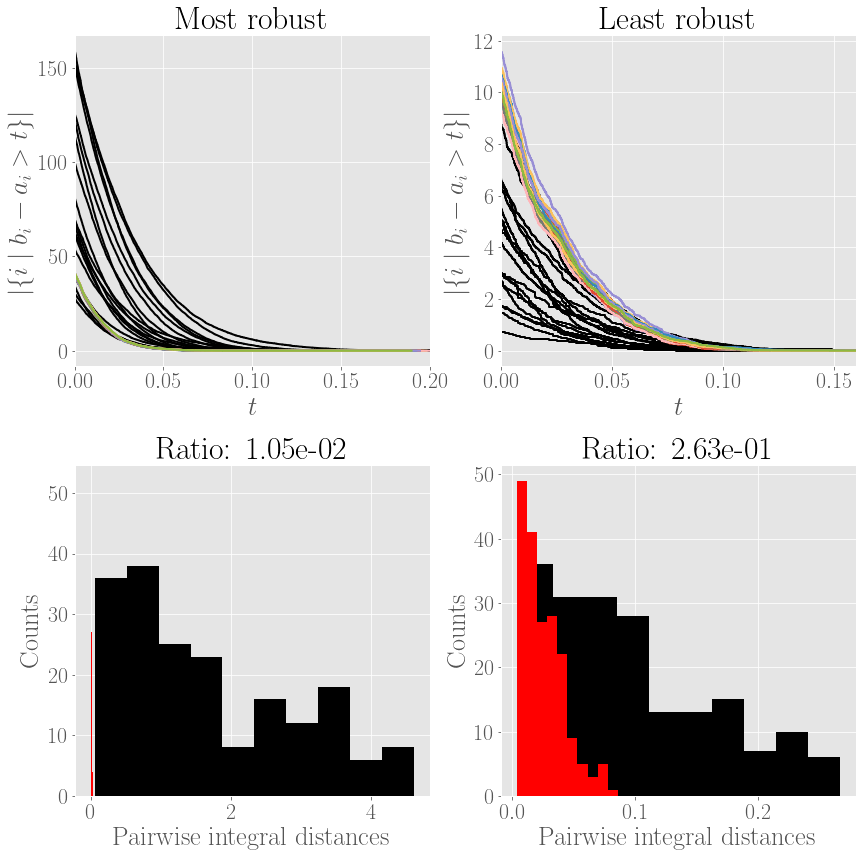

In [2849]:
n = 20
sample_size = 80
number_instances = 200

fig, ax = plt.subplots(2, 2, figsize=(14, 14))
plt.subplots_adjust(hspace=0.3)

#H0 best
comb_id = 8

d = sr.Distance(dist_mats[comb_id][list(dist_mats[comb_id].keys())[0]])

hsrs_H0_subject1 = dict()
hsrs_H0_subjects = dict()

for subject in tqdm(data.train_subjects[0:n]):
    d = sr.Distance(dist_mats[comb_id][subject])
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subjects[subject] = sr.bc_to_sr(barcode, degree = "H1")
    hsrs_H0_subjects[subject].plot(ax = ax[0, 0], color = 'k')

for i in tqdm(range(n)):
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subject1[i] = sr.bc_to_sr(barcode, degree = "H1")
    hsrs_H0_subject1[i].plot(ax = ax[0, 0])

integral_dists_subject1_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subject1.items()]).get_distance()
integral_dists_subjects_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subjects.items()]).get_distance()

std_1_H0 = np.median(np.array(integral_dists_subject1_H0))
std_all_H0 = np.median(np.array(integral_dists_subjects_H0))

ax[1, 0].hist(integral_dists_subjects_H0, color = 'k', bins = 10)
ax[1, 0].hist(integral_dists_subject1_H0, color = 'r', bins = 10)
ax[1, 0].set_title("Ratio: " + str("{:.2e}".format(std_1_H0/std_all_H0)))
ax[1, 0].set_xlabel("Pairwise integral distances")

#H0 worst
comb_id = 26

d = sr.Distance(dist_mats[comb_id][list(dist_mats[comb_id].keys())[0]])

hsrs_H0_subject1 = dict()
hsrs_H0_subjects = dict()

for subject in tqdm(data.train_subjects[0:n]):
    d = sr.Distance(dist_mats[comb_id][subject])
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subjects[subject] = sr.bc_to_sr(barcode, degree = "H1")
    hsrs_H0_subjects[subject].plot(ax = ax[0, 1], color = 'k')

for i in tqdm(range(n)):
    sample = sr.get_sample(number_instances=number_instances, sample_size=sample_size, probabilities=m)
    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
    hsrs_H0_subject1[i] = sr.bc_to_sr(barcode, degree = "H1")
    hsrs_H0_subject1[i].plot(ax = ax[0, 1])

integral_dists_subject1_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subject1.items()]).get_distance()
integral_dists_subjects_H0 = sr.SrObject([hsr for _, hsr in hsrs_H0_subjects.items()]).get_distance()

std_1_H0 = np.median(np.array(integral_dists_subject1_H0))
std_all_H0 = np.median(np.array(integral_dists_subjects_H0))

ax[1, 1].hist(integral_dists_subjects_H0, color = 'k', bins = 10)
ax[1, 1].hist(integral_dists_subject1_H0, color = 'r', bins = 10)
ax[1, 1].set_title("Ratio: " + str("{:.2e}".format(std_1_H0/std_all_H0)))
ax[1, 1].set_xlabel("Pairwise integral distances")

ax[0, 0].set_title("Most robust")
ax[0, 1].set_title("Least robust")
ax[0, 0].set_xlabel('$t$')
ax[0, 1].set_xlabel('$t$')
ax[0, 0].set_xlim(0, 0.2)
ax[0, 1].set_xlim(0, 0.16)

ax[1, 0].set_ylabel("Counts")
ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
ax[1, 1].set_ylabel("Counts")
ax[0, 1].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"SampleSize_H1_bestWorst.jpg", bbox_inches="tight")
#if show:
plt.show()
plt.close()


## Run time

In [19]:
matrix = dist_mats[0][86]
d = sr.Distance(matrix)
temp_repeats = 10
sizes = [5*i for i in range(1,40)]

In [20]:
times_H0 = []
for size in tqdm(sizes):
    sample = sr.get_sample(number_instances = 100, sample_size = size, probabilities = 200)
    start = time.time()
    for i in range(temp_repeats):
        d.get_h0sr(sample=sample, clustering_method="single")
    end = time.time()
    times_H0.append((end-start)/temp_repeats)

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [03:31<00:00,  5.43s/it]


In [21]:
times_H1 = []
for size in tqdm(sizes):
    sample = sr.get_sample(number_instances = 100, sample_size = size, probabilities = 200)
    start = time.time()
    for i in range(temp_repeats):
        barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
        sr.bc_to_sr(barcode, degree = "H1")
    end = time.time()
    times_H1.append((end-start))

100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [05:32<00:00,  8.53s/it]


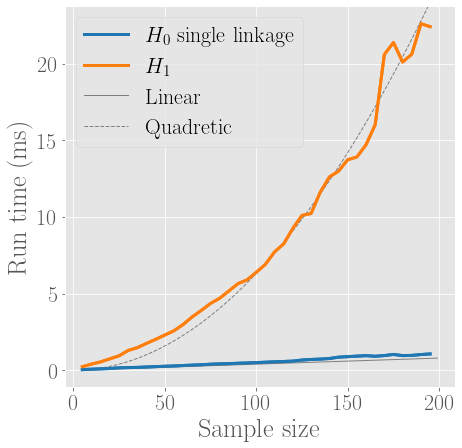

In [45]:
x = [i for i in range(5,200)]

plt.figure()
plt.plot(sizes, np.array(times_H0), 'tab:blue', linewidth = 3)
plt.plot(sizes, np.array(times_H1), 'tab:orange', linewidth = 3)
ylim = plt.gca().get_ylim()
#plt.plot(sizes, np.array(times_H0))
#plt.plot(sizes, np.array(times_H1))
plt.plot(x, 10**-2.4 * np.array(x), color = 'tab:grey', linewidth = 1)
plt.plot(x, 10**-3.2 * np.array(x)**2, '--', color = 'tab:grey', linewidth = 1)
plt.ylim(ylim)
plt.plot(sizes, np.array(times_H0), 'tab:blue', linewidth = 3)
plt.plot(sizes, np.array(times_H1), 'tab:orange', linewidth = 3)
#plt.loglog(sizes, (times_H0[0]/5) * np.array(sizes), color = 'tab:grey', linewidth = 1)
#plt.loglog(sizes, (times_H1[0]/5) * np.array(sizes), color = 'tab:grey', linewidth = 1)
#plt.loglog(sizes, (times_H1[0]/25) * np.array(sizes)**2, '--', color = 'tab:grey', linewidth = 1)
plt.xlabel('Sample size')
plt.ylabel('Run time (ms)')
plt.legend(['$H_0$ single linkage', '$H_1$', 'Linear', 'Quadretic'])
if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"SampleSize_runtime.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [2372]:
print(times_H1[9]*400)
print(times_H1[15]*200)

917.6018714904785
938.8060092926025


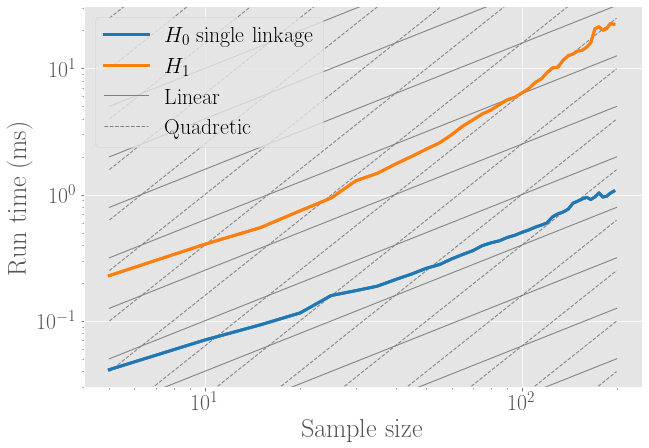

In [1527]:
x = [i for i in range(5,200)]

plt.figure(figsize=(10, 7))
plt.loglog(sizes, np.array(times_H0), '-', color = 'tab:blue', linewidth = 3)
plt.loglog(sizes, np.array(times_H1), '-', color = 'tab:orange', linewidth = 3)
ylim = plt.gca().get_ylim()
#plt.plot(sizes, np.array(times_H0))
#plt.plot(sizes, np.array(times_H1))
for i in np.arange(0, 10, 0.4):
    plt.loglog(x, 10**-i * np.array(x), color = 'tab:grey', linewidth = 1)
    plt.loglog(x, 10**-i * np.array(x)**2, '--', color = 'tab:grey', linewidth = 1)
plt.ylim(ylim)
plt.loglog(sizes, np.array(times_H0), '-', color = 'tab:blue', linewidth = 3)
plt.loglog(sizes, np.array(times_H1), '-', color = 'tab:orange', linewidth = 3)
#plt.loglog(sizes, (times_H0[0]/5) * np.array(sizes), color = 'tab:grey', linewidth = 1)
#plt.loglog(sizes, (times_H1[0]/5) * np.array(sizes), color = 'tab:grey', linewidth = 1)
#plt.loglog(sizes, (times_H1[0]/25) * np.array(sizes)**2, '--', color = 'tab:grey', linewidth = 1)
plt.xlabel('Sample size')
plt.ylabel('Run time (ms)')
plt.legend(['$H_0$ single linkage', '$H_1$', 'Linear', 'Quadretic'])
if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"SampleSize_runtime.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

# Global 

Change default sample size and number instances in data file

In [122]:
hsrs = dict()
for comb_id in tqdm(prePHparam.index):
    hsrs[comb_id] = dict()
    for homology in homologies:
        hsrs[comb_id][homology] = data.f_global(dist_mats[comb_id], homology = homology)

100%|███████████████████████████████████████████████████████████████████████████████| 43/43 [3:21:29<00:00, 281.16s/it]


In [211]:
for comb_id in prePHparam.index:
    i = 0
    fig, ax = plt.subplots(1, len(homologies), figsize=(20, 7))
    for homology in homologies:
        for subject, hsr in hsrs[comb_id][homology].items():
            hsr.plot(ax = ax[i], color = data.colors[subject])
        i += 1

    for i in range(len(homologies)):
        ax[i].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
    
    ax[0].set_title('$H_0$ single')
    ax[1].set_title('$H_0$ average')
    ax[2].set_title('$H_0$ complete')
    ax[3].set_title('$H_1$')
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Global_comb"+str(comb_id)+".jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

In [2036]:
for subject in data.train_subjects:
    #print(hsrs[21]["H1"][subject].content[1][1])
    if hsrs[28]["H1"][subject].content[1][1] > 60:
        print(subject)

58


In [165]:
show = False

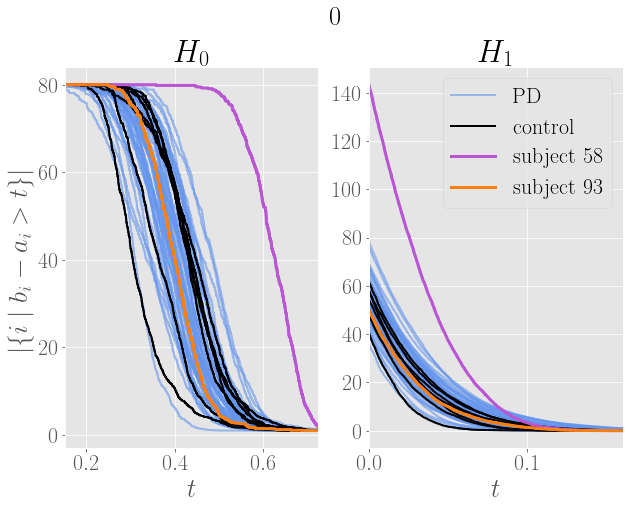

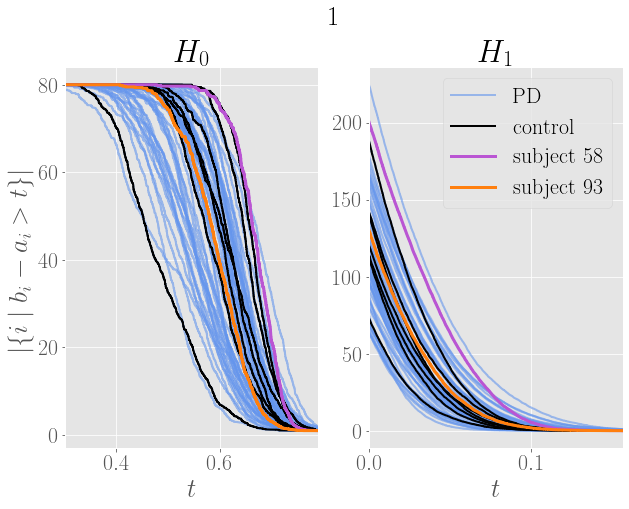

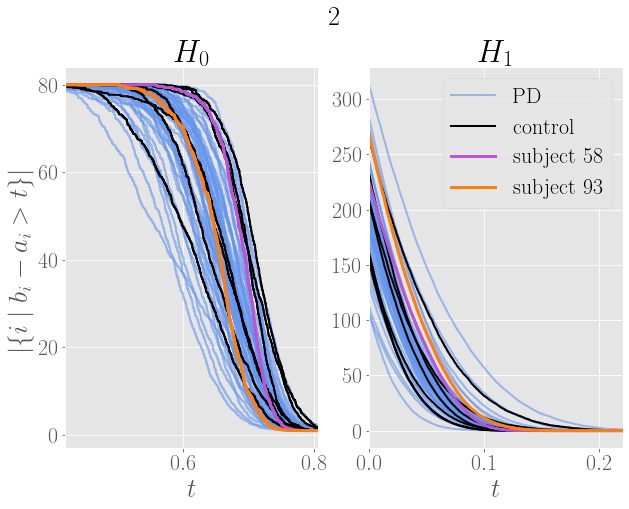

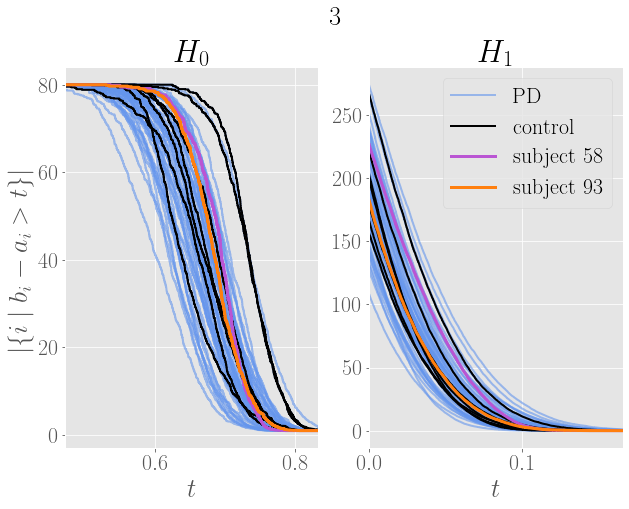

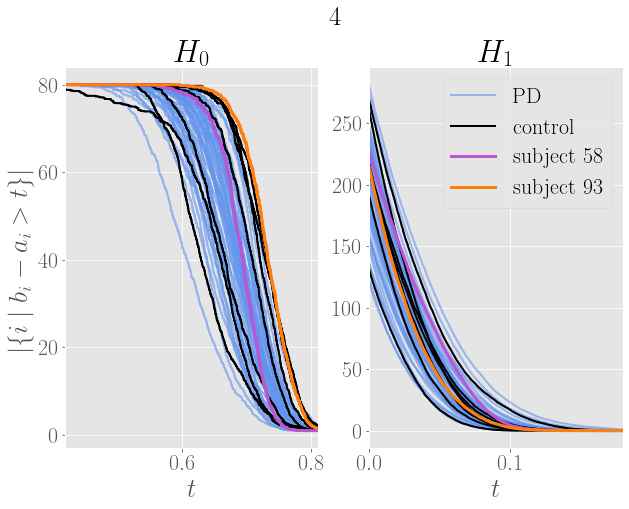

...

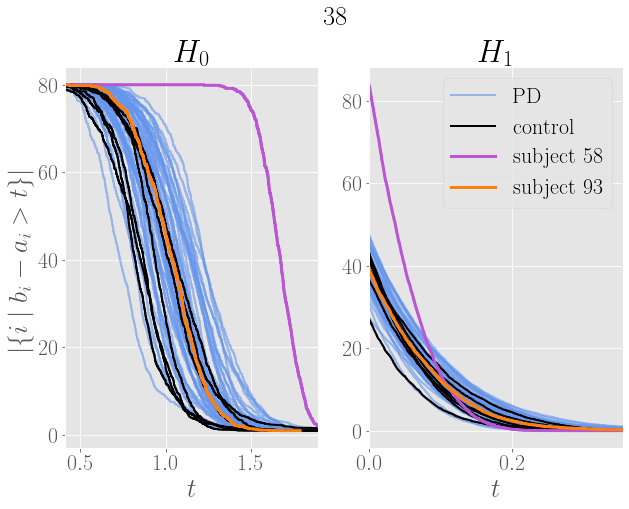

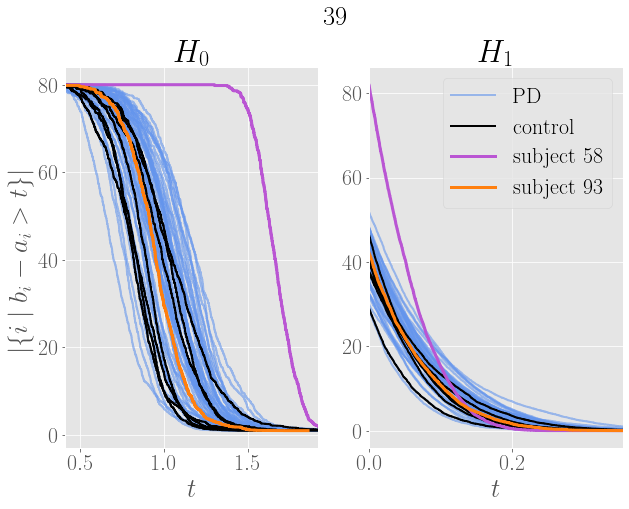

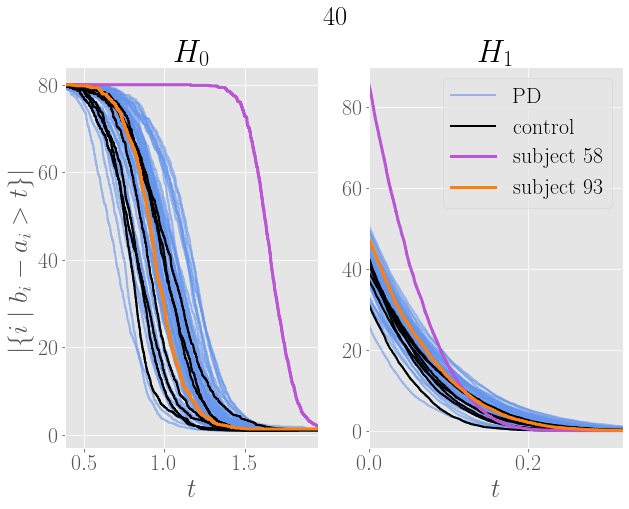

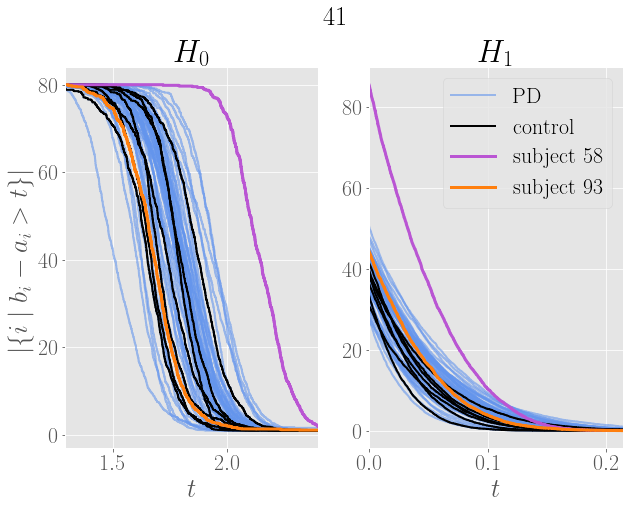

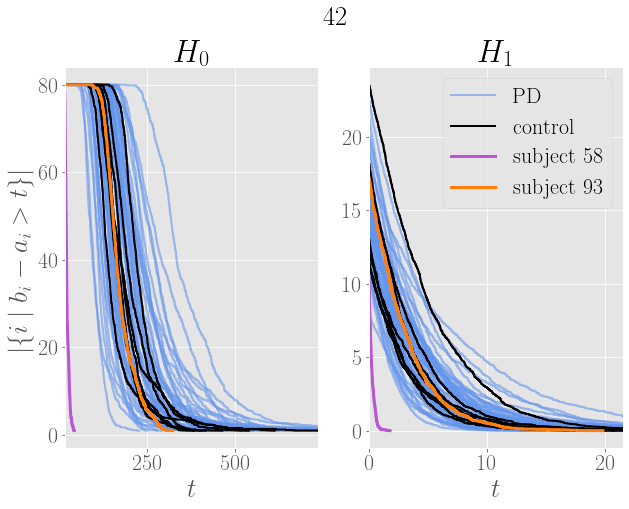

In [170]:
labels = ["Antisymmetric part", "Transpose multiplication", "$p$-Distance rows", "DTW"]

j = 0
for comb_id in prePHparam.index:
    fig, ax = plt.subplots(1, 2, figsize=(10, 7))

    plt.suptitle(comb_id, y = 1)#, fontsize = 34) #, 
    plt.subplots_adjust(wspace=0.2)
    i = 0
    
    
    for homology in ['H0_single', 'H1']:
        redLabel = True
        blackLabel = True
        for subject, hsr in hsrs[comb_id][homology].items():
            if redLabel:
                hsr.plot(ax = ax[i], color = 'cornflowerblue', alpha = 0.6, label = 'PD')
                redLabel = False
            else:
                hsr.plot(ax = ax[i], color = 'cornflowerblue', alpha = 0.6)
        for subject in data.train_i_ctr:
            if blackLabel:
                hsrs[comb_id][homology][subject].plot(ax = ax[i], color = 'k', label = 'control')
                blackLabel = False
            else:
                hsrs[comb_id][homology][subject].plot(ax = ax[i], color = 'k')
        hsrs[comb_id][homology][58].plot(ax = ax[i], color = 'mediumorchid', label = 'subject 58', linewidth = 3)
        #hsrs[comb_id][homology][86].plot(ax = ax[i], color = 'tab:green', label = 'subject 86', linewidth = 3)
        hsrs[comb_id][homology][93].plot(ax = ax[i], color = 'tab:orange', label = 'subject 93', linewidth = 3)
        #hsrs[comb_id][homology][58].plot(ax = ax[i], color = 'tab:red', label = 'subject 58', linewidth = 3)
        
        ax[i].set_xlabel('$t$')
        if "H1" in homology:
            ax[i].legend()
        i += 1
        
    tMin_H0 = 1000
    tMax_H0 = 0
    tMax_H1 = 0

    for subject, hsr in hsrs[comb_id]['H0_single'].items():
        temp_inds = np.where(hsr.content[1] < 79)
        temp_tval = hsr.content[0][temp_inds[0][1]]
        if temp_tval < tMin_H0:
            tMin_H0 = temp_tval
            
        temp_inds = np.where(hsr.content[1] < 2)
        temp_tval = hsr.content[0][temp_inds[0][1]]
        if temp_tval > tMax_H0:
            tMax_H0 = temp_tval
            
    for subject, hsr in hsrs[comb_id]['H1'].items():
        temp_inds = np.where(hsr.content[1] < 1)
        temp_tval = hsr.content[0][temp_inds[0][1]]
        if temp_tval > tMax_H1:
            tMax_H1 = temp_tval
        
    ax[0].set_xlim(tMin_H0, tMax_H0)
    ax[1].set_xlim(0, tMax_H1)
        
    #ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    #ax[1].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0].set_title('$H_0$')
    ax[1].set_title('$H_1$')

    #if j == 0:
    #    ax[0].set_xlim(0.6, 1)
    #    ax[1].set_xlim(0, 0.12)
    #if j == 0:
    #    ax[0].set_xlim(0, 25)
    #    ax[1].set_xlim(0, 3)
    #    y1, y2 = ax[1].get_ylim()
    #    y4 = 100
    #    ax[1].set_ylim(y4*y1/y2, y4)
    #elif j == 2:
    #    ax[0].set_xlim(0, 4)
    #    ax[1].set_xlim(0, 0.75)
    #elif j == 1:
    #    ax[0].set_xlim(0, 750)
    #    ax[1].set_xlim(0, 30)

    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        #plt.savefig(fig_path+addOn+"Global_comb"+str(comb_id)+"_H0singleH1only.jpg", bbox_inches="tight")
        plt.savefig(fig_path+addOn+"Presentation_combId_"+str(comb_id)+"_global4", bbox_inches="tight")
    plt.show()
    plt.close()

    j += 1


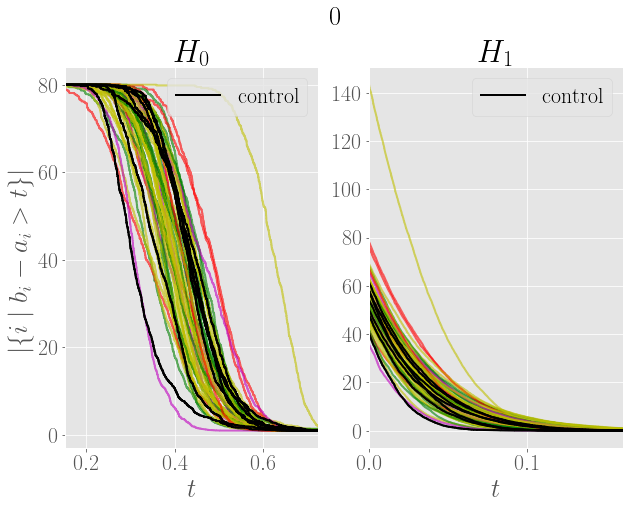

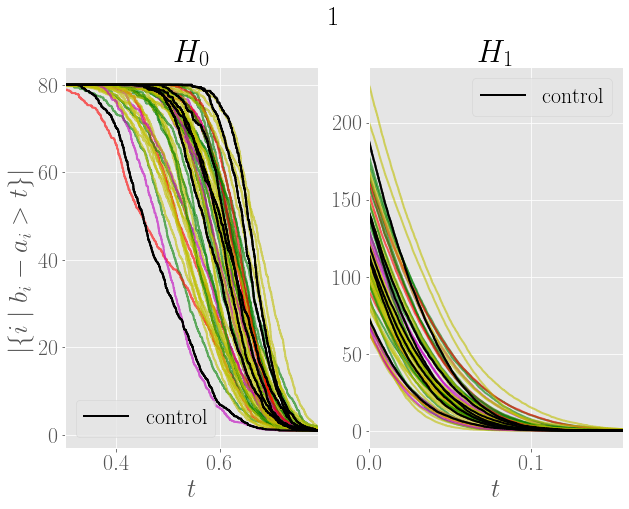

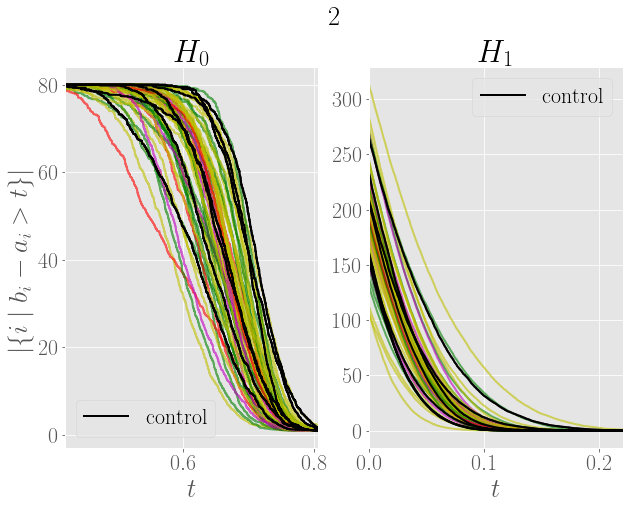

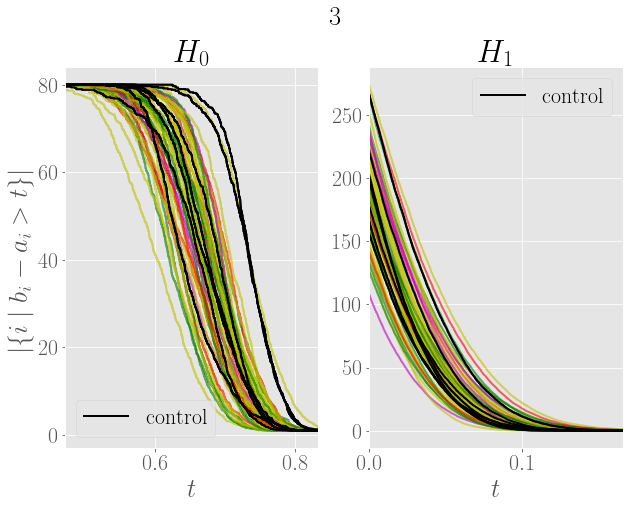

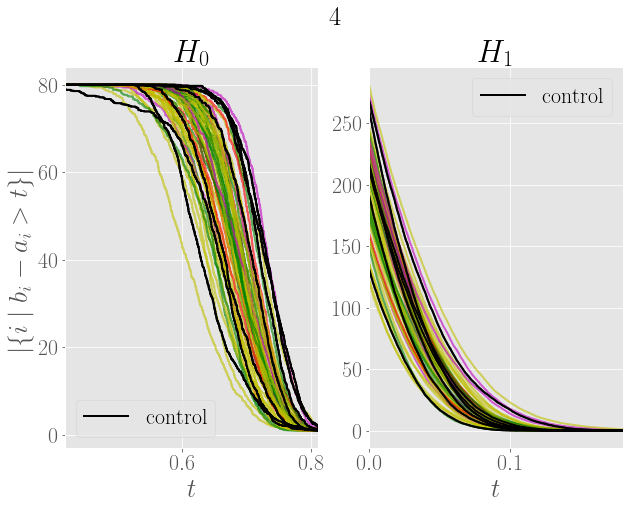

...

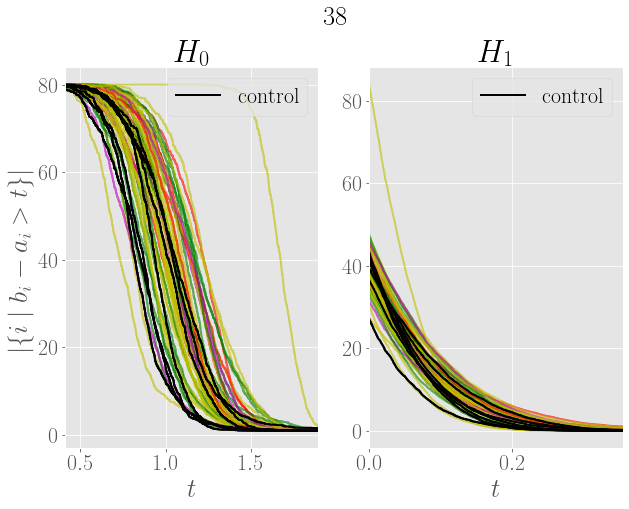

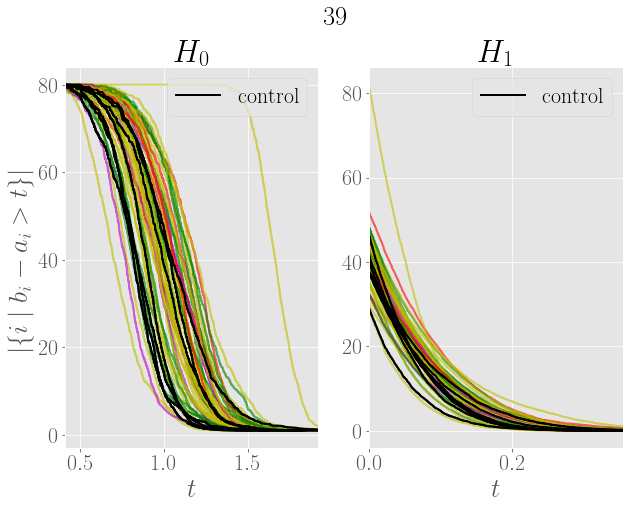

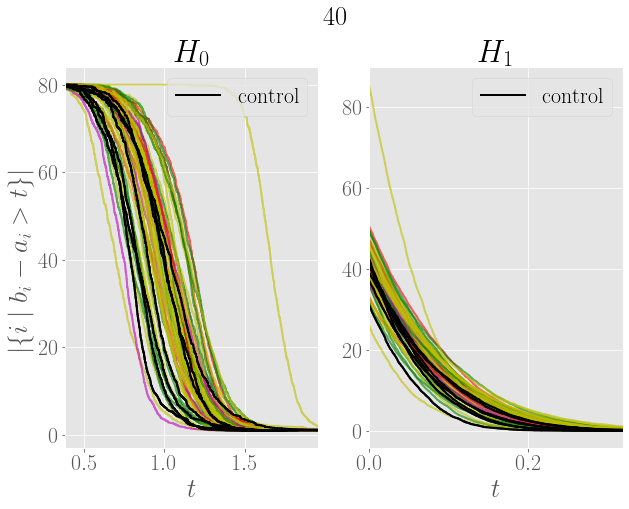

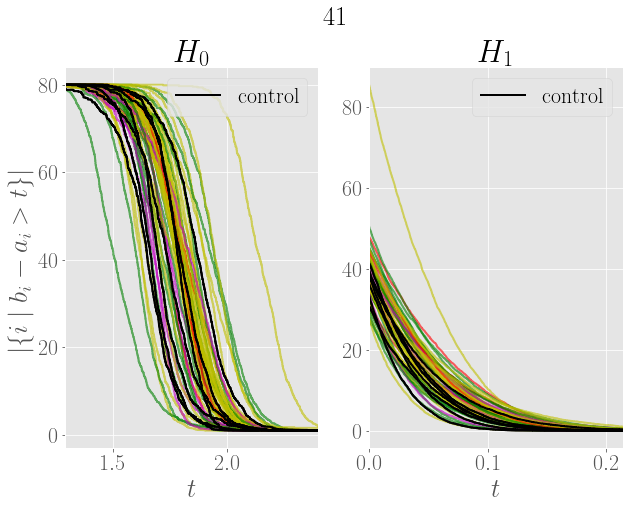

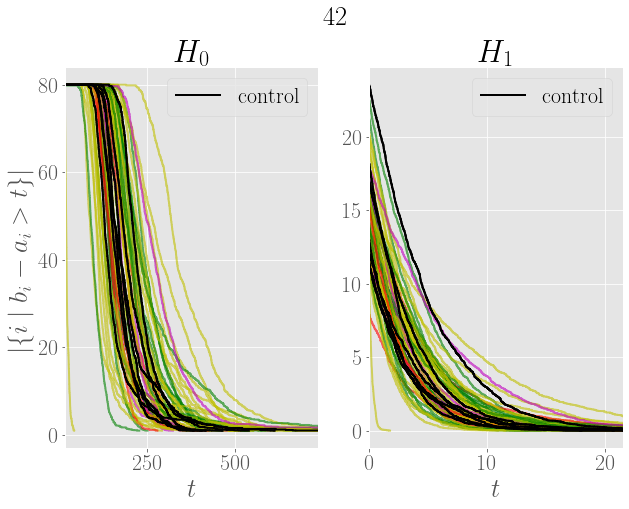

In [168]:
labels = ["Antisymmetric part", "Transpose multiplication", "$p$-Distance rows", "DTW"]

j = 0
for comb_id in prePHparam.index:
    fig, ax = plt.subplots(1, 2, figsize=(10, 7))

    plt.suptitle(comb_id, y = 1)#, fontsize = 34) #, 
    plt.subplots_adjust(wspace=0.2)
    i = 0
    
    
    for homology in ['H0_single', 'H1']:
        redLabel = True
        blackLabel = True
        for subject, hsr in hsrs[comb_id][homology].items():
            color = data.colors[subject]
            #color = 'cornflowerblue'
            if redLabel:
                hsr.plot(ax = ax[i], color = color, alpha = 0.6)#, label = 'PD')
                redLabel = False
            else:
                hsr.plot(ax = ax[i], color = color, alpha = 0.6)
        for subject in data.train_i_ctr:
            color = 'k'
            if blackLabel:
                hsrs[comb_id][homology][subject].plot(ax = ax[i], color = color, label = 'control')
                blackLabel = False
            else:
                hsrs[comb_id][homology][subject].plot(ax = ax[i], color = color)
        #hsrs[comb_id][homology][58].plot(ax = ax[i], color = 'mediumorchid', label = 'subject 58', linewidth = 3)
        #hsrs[comb_id][homology][86].plot(ax = ax[i], color = 'tab:green', label = 'subject 86', linewidth = 3)
        #hsrs[comb_id][homology][93].plot(ax = ax[i], color = 'tab:orange', label = 'subject 93', linewidth = 3)
        #hsrs[comb_id][homology][58].plot(ax = ax[i], color = 'tab:red', label = 'subject 58', linewidth = 3)
        
        ax[i].set_xlabel('$t$')
        ax[i].legend()
        i += 1
        
    tMin_H0 = 1000
    tMax_H0 = 0
    tMax_H1 = 0

    for subject, hsr in hsrs[comb_id]['H0_single'].items():
        temp_inds = np.where(hsr.content[1] < 79)
        temp_tval = hsr.content[0][temp_inds[0][1]]
        if temp_tval < tMin_H0:
            tMin_H0 = temp_tval
            
        temp_inds = np.where(hsr.content[1] < 2)
        temp_tval = hsr.content[0][temp_inds[0][1]]
        if temp_tval > tMax_H0:
            tMax_H0 = temp_tval
            
    for subject, hsr in hsrs[comb_id]['H1'].items():
        temp_inds = np.where(hsr.content[1] < 1)
        temp_tval = hsr.content[0][temp_inds[0][1]]
        if temp_tval > tMax_H1:
            tMax_H1 = temp_tval
        
    ax[0].set_xlim(tMin_H0, tMax_H0)
    ax[1].set_xlim(0, tMax_H1)
        
    #ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    #ax[1].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0].set_title('$H_0$')
    ax[1].set_title('$H_1$')

    #if j == 0:
    #    ax[0].set_xlim(0.6, 1)
    #    ax[1].set_xlim(0, 0.12)
    #if j == 0:
    #    ax[0].set_xlim(0, 25)
    #    ax[1].set_xlim(0, 3)
    #    y1, y2 = ax[1].get_ylim()
    #    y4 = 100
    #    ax[1].set_ylim(y4*y1/y2, y4)
    #elif j == 2:
    #    ax[0].set_xlim(0, 4)
    #    ax[1].set_xlim(0, 0.75)
    #elif j == 1:
    #    ax[0].set_xlim(0, 750)
    #    ax[1].set_xlim(0, 30)

    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        #plt.savefig(fig_path+addOn+"Global_comb"+str(comb_id)+"_H0singleH1only.jpg", bbox_inches="tight")
        plt.savefig(fig_path+addOn+"Presentation_combId_"+str(comb_id)+"_global5", bbox_inches="tight")
    plt.show()
    plt.close()

    j += 1


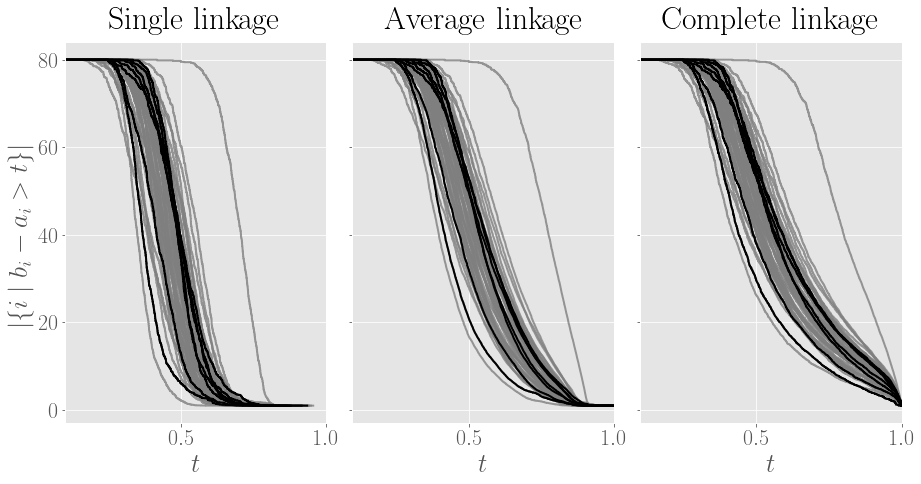

In [2057]:
comb_id = 7
fig, ax = plt.subplots(1, 3, figsize=(15, 7))
plt.subplots_adjust(wspace=0.1)

i = 0
for homology in ['H0_single', 'H0_average', 'H0_complete']:
    for subject, hsr in hsrs[comb_id][homology].items():
        hsr.plot(ax = ax[i], color = 'tab:grey', alpha = 0.8)
    for subject in data.train_i_ctr:
        hsrs[comb_id][homology][subject].plot(ax = ax[i], color = 'k')
    ax[i].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    i += 1

ax[0].set_title('Single linkage', y = 1.02)
ax[1].set_title('Average linkage', y = 1.02)
ax[2].set_title('Complete linkage', y = 1.02)

ax[0].set_xlim(0.1, 1.0)
ax[1].set_xlim(0.1, 1.0)
ax[2].set_xlim(0.1, 1.0)

ax[1].set_yticklabels([])
ax[2].set_yticklabels([])
    
if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Global_comb"+str(comb_id)+"_H0s.jpg", bbox_inches="tight")
plt.show()
plt.close()

j += 1


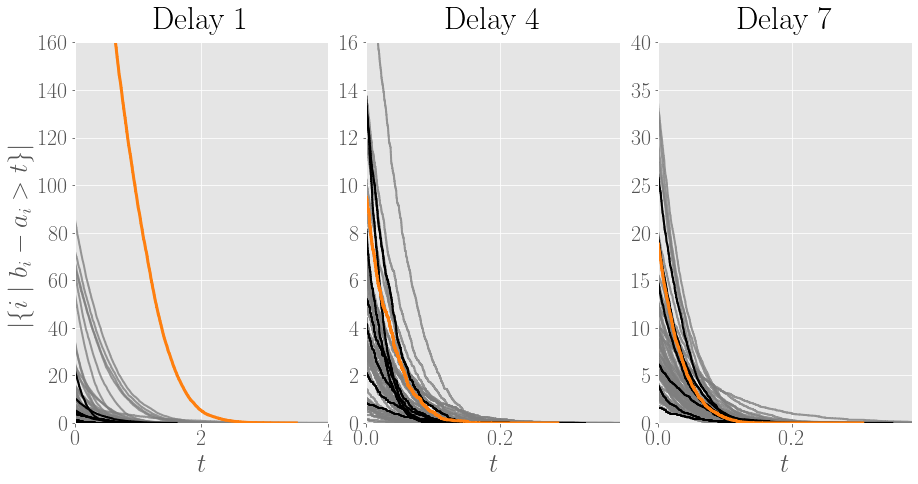

In [2058]:
fig, ax = plt.subplots(1, 3, figsize=(15, 7))
plt.subplots_adjust(wspace=0.15)

i = 0
homology = "H1"
for comb_id in [21, 24, 27]:
    for subject, hsr in hsrs[comb_id][homology].items():
        hsr.plot(ax = ax[i], color = 'tab:grey', alpha = 0.8)
    for subject in data.train_i_ctr:
        hsrs[comb_id][homology][subject].plot(ax = ax[i], color = 'k')
    ax[i].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    
    hsrs[comb_id][homology][93].plot(ax = ax[i], color = 'tab:orange', label = 'subject 93', linewidth = 3)
    
    i += 1
    
ax[0].set_title('Delay 1', y = 1.02)
ax[1].set_title('Delay 4', y = 1.02)
ax[2].set_title('Delay 7', y = 1.02)

ax[0].set_xlim(0, 4)
ax[1].set_xlim(0, 0.38)
ax[2].set_xlim(0, 0.38)
ax[0].set_ylim(0, 160)
ax[1].set_ylim(0, 16)
ax[2].set_ylim(0, 40)
    
if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Global_comb_H1s.jpg", bbox_inches="tight")
plt.show()
plt.close()

j += 1

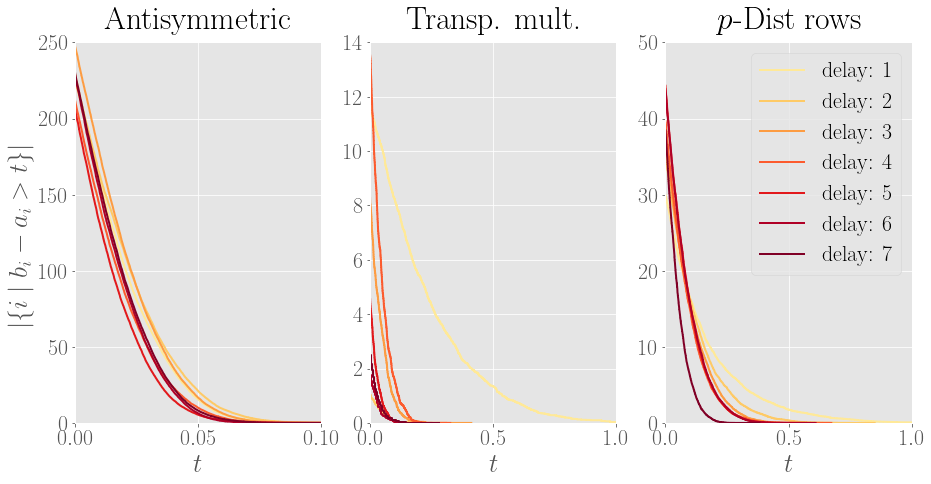

In [2393]:
fig, ax = plt.subplots(1, 3, figsize=(15, 7))
plt.subplots_adjust(wspace=0.2)

cm = plt.get_cmap('YlOrRd') 

subject = 23

i = 0
homology = "H1"
for comb_id in [14, 21, 28]:
    for delay in range(1, 8):
        hsrs[comb_id+delay-1][homology][subject].plot(ax = ax[i], color = cm(delay*0.15), label = "delay: " + str(delay))
    ax[i].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    
    
    i += 1
    
ax[0].set_title('Antisymmetric', y = 1.02)
ax[1].set_title('Transp. mult.', y = 1.02)
ax[2].set_title('$p$-Dist rows', y = 1.02)

ax[0].set_xlim(0, 0.1)
ax[1].set_xlim(0, 1)
ax[2].set_xlim(0, 1)
ax[0].set_ylim(0, 250)
ax[1].set_ylim(0, 14)
ax[2].set_ylim(0, 50)
    
ax[2].legend()

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Global_delays_oneSubject_H1.jpg", bbox_inches="tight")
plt.show()
plt.close()

j += 1

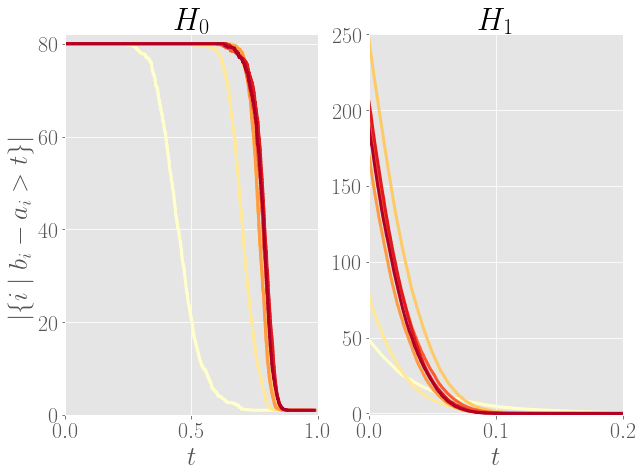

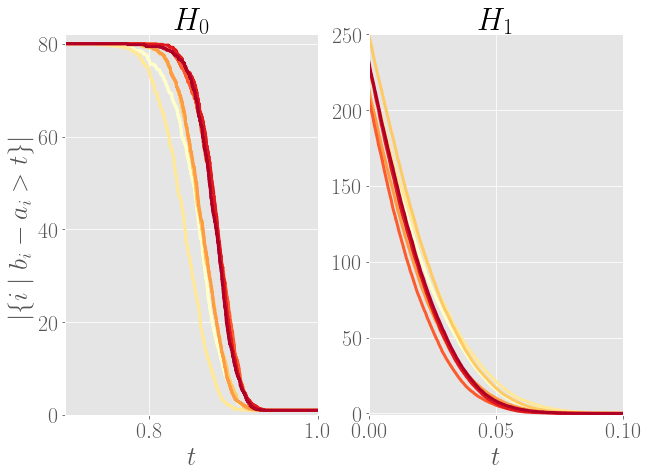

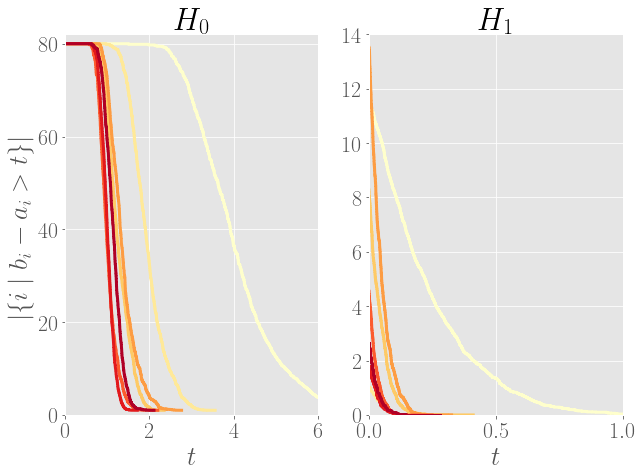

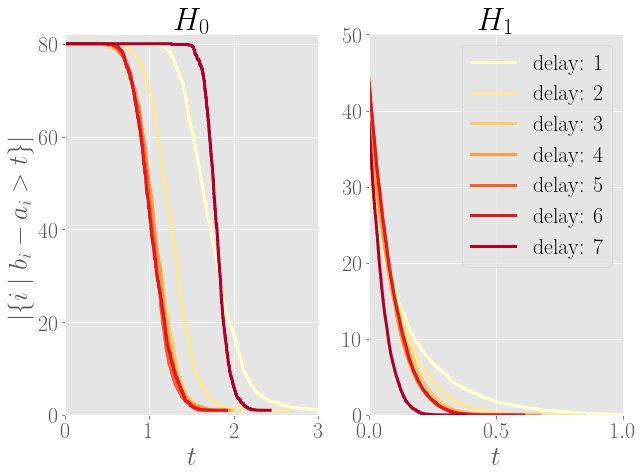

In [2394]:
labels = ["Symmetric part", "Antisymmetric part", "Transpose multiplication", "$p$-Distance rows"]

j = 0
for comb_id in [7, 14, 21, 28]:
    fig, ax = plt.subplots(1, 2, figsize=(10, 7))
    
    plt.subplots_adjust(wspace=0.2)

    for delay in range(7):
        hsrs[comb_id+delay]["H0_single"][subject].plot(ax = ax[0], color = cm(delay*0.15), label = "delay: " + str(delay+1), linewidth = 3)
        hsrs[comb_id+delay]["H1"][subject].plot(ax = ax[1], color = cm(delay*0.15), label = "delay: " + str(delay+1), linewidth = 3)
    
    ax[0].set_xlabel('$t$')
    ax[1].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0].set_title('$H_0$')
    ax[1].set_title('$H_1$')

    if j == 0:
        ax[0].set_xlim(0, 1)
        ax[1].set_xlim(0, 0.2)
        ax[0].set_ylim(0, 82)
        ax[1].set_ylim(-1, 250)
    elif j == 1:
        ax[0].set_xlim(0.7, 1)
        ax[1].set_xlim(0, 0.1)
        ax[0].set_ylim(0, 82)
        ax[1].set_ylim(-1, 250)
    elif j == 2:
        ax[0].set_xlim(0, 6)
        ax[1].set_xlim(0, 1)
        ax[0].set_ylim(0, 82)
        ax[1].set_ylim(0, 14)
    elif j == 3:
        ax[0].set_xlim(0, 3)
        ax[1].set_xlim(0, 1)
        ax[0].set_ylim(0, 82)
        ax[1].set_ylim(0, 50)

        ax[1].legend()
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Global_combId"+str(comb_id)+"delays_oneSubject.jpg", bbox_inches="tight")
    plt.show()
    plt.close()
    
    j += 1


# Relative

In [61]:
comb_id = 42
comb = prePHparam.loc[comb_id]
comb

methods               dtw
symmetrizations      None
neg_vals_methods     None
cor_to_dist_funcs    None
Name: 42, dtype: object

In [62]:
time_series_total = pd.DataFrame(np.zeros((N, m)))
for subject in data.train_i_ctr:
    time_series_total = time_series_total + data.TimeSeries(subject = subject).data_df
ref_obj = time_series_total / len(data.train_i_ctr)

In [63]:
dist_df = data._compute_dist_df_dtw_(ref_obj, normalized=False)

In [64]:
d = sr.Distance(dist_df)

In [65]:
data.train_subjects_noctr[4]

24

In [67]:
amplifications = [20, 40, 60]
ks = [10, 30, 50]

hsrs_relative = dict()
distributions_dict = dict()

for amplification in amplifications:
    hsrs_relative[amplification] = dict()
    distributions_dict[amplification] = dict()
    
    for k in tqdm(ks):
        marge = (data.default_sample_size / m) * amplification
        
        hsrs_relative[amplification][k] = dict()
        distributions_dict[amplification][k] = dict()
        
        for subject in data.train_subjects_noctr:
            points = data.TimeSeries(subject = subject).data_mat.T
            filt = np.zeros(m)
            for i in range(m):
                filt[i] = spatial.distance.cdist([points[i]], [ref_obj[i]], metric = "euclidean")[0,0]

            std = np.percentile(filt, k + marge) - np.percentile(filt, k)
            mean = np.percentile(filt, k)

            content = dict()
            content["name"] = "normal"
            content["m"] = mean
            content["sd"] = std

            dist = sr.Distribution(content = content)
            probabilities = dist.evaluate(filt)
            sample = sr.get_sample(number_instances = data.default_number_instances, sample_size = data.default_sample_size, probabilities = probabilities)
            distributions_dict[amplification][k][subject] = dist
            
            hsrs_relative[amplification][k][subject] = dict()
            for homology in homologies:
                if "H0" in homology:
                    clustering_method = homology.split("_")[1]
                    hsrs_relative[amplification][k][subject][homology] = d.get_h0sr(sample=sample, clustering_method=clustering_method)
                else:
                    barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
                    hsrs_relative[amplification][k][subject][homology] = sr.bc_to_sr(barcode, degree = "H1")

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [09:25<00:00, 188.48s/it]


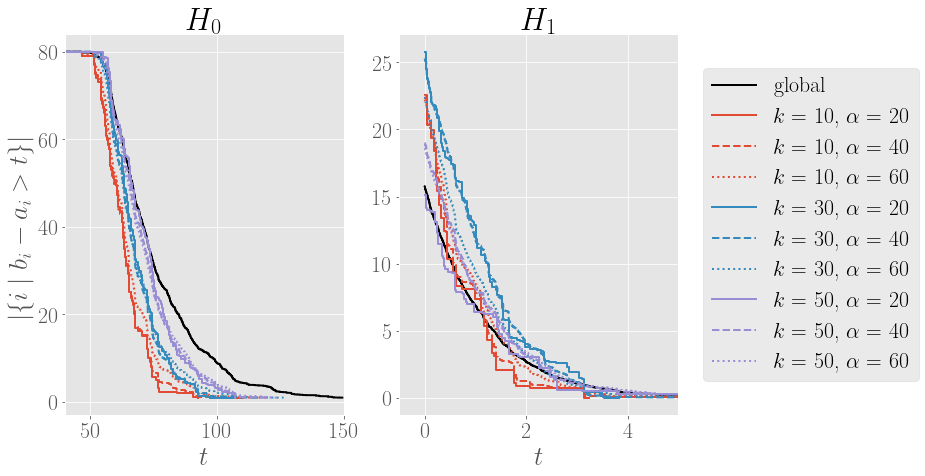

In [2411]:
show = True

subject = data.train_subjects_noctr[4]
fig, ax = plt.subplots(1, 2, figsize=(11, 7))
plt.subplots_adjust(wspace=0.2)

sample = sr.get_sample(number_instances = data.default_number_instances, sample_size = data.default_sample_size, probabilities = 200)
clustering_method = "single"
d.get_h0sr(sample=sample, clustering_method=clustering_method).plot(ax = ax[0], color = 'k', alpha = 1, label = 'global')
barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
sr.bc_to_sr(barcode, degree = "H1").plot(ax = ax[1], color = 'k', alpha = 1, label = 'global')

#hsrs[comb_id]["H0_single"][subject].plot()
#hsrs[comb_id]["H1"][subject].plot()

linestyles = ['-', '--', ':', '-.']

r = 0
for k in ks:
    j = 0
    for amplification in amplifications:
        i = 0
        for homology in ["H0_single", "H1"]:
            hsrs_relative[amplification][k][subject][homology].plot(ax = ax[i], alpha = 1, color = 'C'+str(r), linestyle = linestyles[j], 
                                                                    label = '$k$ = '+str(k)+r', $\alpha$ = '+str(amplification))
            i += 1
        j += 1
    r += 1

ax[0].set_xlim(40, 150)
ax[1].set_xlim(-0.5, 5)
ax[1].legend(loc = 'center right', bbox_to_anchor=(1.9, 0.5))
for i in range(2):
    ax[i].set_xlabel('$t$')
ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
#ax[1].set_ylabel('$|\{i \mid C(a_i, t) < b_i \}|$')

ax[0].set_title('$H_0$')
ax[1].set_title('$H_1$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Relative_comb"+str(comb_id)+"_oneSubject.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [72]:
save = True

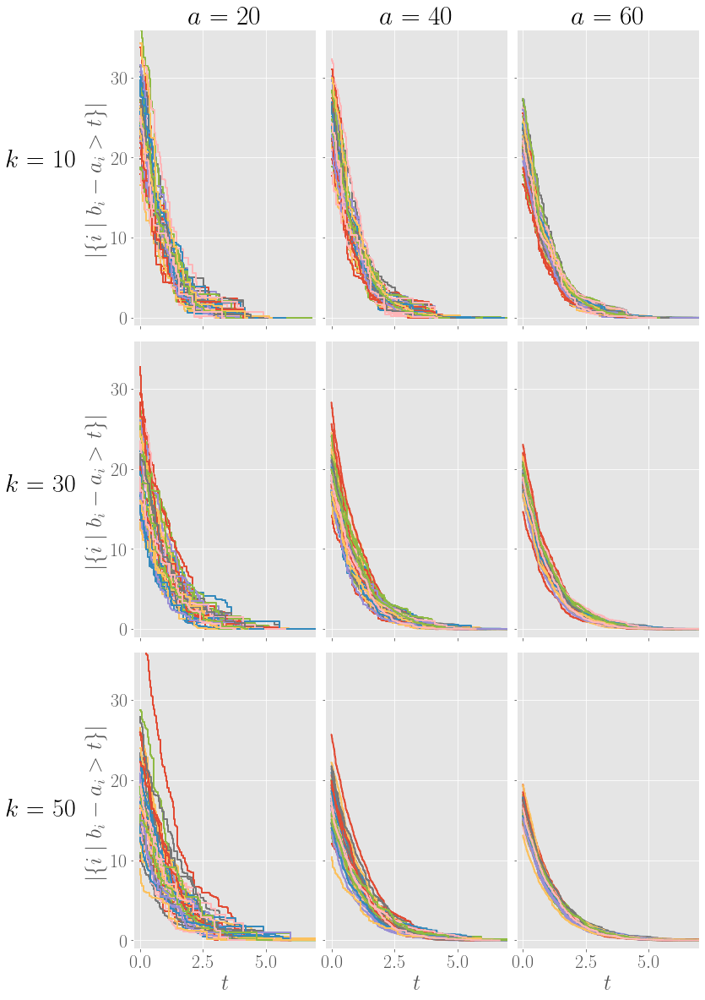

In [73]:
import matplotlib as mpl
amplifications = [20, 40, 60]

fig, ax = plt.subplots(3, 3, figsize=(12, 20))
plt.subplots_adjust(wspace=0.05)
plt.subplots_adjust(hspace=0.05)
#plt.suptitle('$k$ = '+str(k)+', $a$ ='+str(amplification), fontsize = 30, y = 0.95)

i = 0
for k in ks:
    j = 0
    for amplification in amplifications:
        for subject in data.train_subjects_noctr:
            hsrs_relative[amplification][k][subject]["H1"].plot(ax = ax[i,j]) #, color = color) #data.colors[subject])
        ax[0, j].set_title('$a$ = '+str(amplification))
        ax[2 ,j].set_xlabel('$t$')
        ax[i, j].set_xlim(-0.25, 7)
        ax[i, j].set_ylim(-1, 36)
        if (j != 0):
            ax[i, j].set_yticklabels([])
        if (i != 2):
            ax[i, j].set_xticklabels([])
        j += 1
    ax[i, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    i += 1

plt.text(-0.05, 1.4/6, '$k$ = '+str(ks[2]), fontsize=30, transform=plt.gcf().transFigure)
plt.text(-0.05, 3/6, '$k$ = '+str(ks[1]), fontsize=30, transform=plt.gcf().transFigure)
plt.text(-0.05, 4.6/6, '$k$ = '+str(ks[0]), fontsize=30, transform=plt.gcf().transFigure)

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Relative_comb"+str(comb_id)+"_all.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

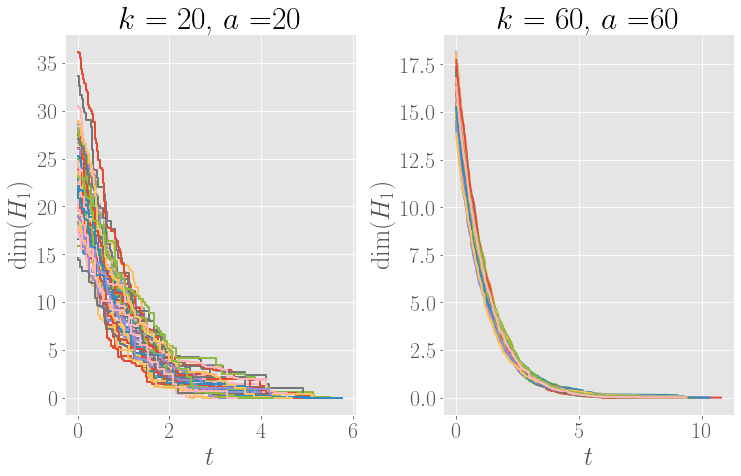

In [1631]:
fig, ax = plt.subplots(1, 2, figsize=(12, 7))
plt.subplots_adjust(wspace=0.3)
#plt.suptitle('$k$ = '+str(k)+', $a$ ='+str(amplification), fontsize = 30, y = 0.95)

for i in range(2):
    ax[i].set_xlabel('$t$')
    ax[i].set_ylabel('dim$(H_1)$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')

k = 20
amplification = 20
for subject in data.train_subjects_noctr:
    hsrs_relative[amplification][k][subject][homology].plot(ax = ax[0]) #, color = color) #data.colors[subject])
ax[0].set_title('$k$ = '+str(k)+', $a$ ='+str(amplification))

k = 60
amplification = 60
for subject in data.train_subjects_noctr:
    hsrs_relative[amplification][k][subject][homology].plot(ax = ax[1]) #, color = color) #data.colors[subject])
ax[1].set_title('$k$ = '+str(k)+', $a$ ='+str(amplification))

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Relative_comb"+str(comb_id)+"_tooSmallTooBig.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [1760]:
amplifications = [20, 40, 60, 100]
show = False

for amplification in amplifications:
    for k in ks:
        fig, ax = plt.subplots(1, 2, figsize=(12, 7))
        plt.subplots_adjust(wspace=0.3)
        plt.suptitle('$k$ = '+str(k)+', $a$ ='+str(amplification), fontsize = 30, y = 0.95)
        
        i = 0
        for homology in ["H0_single", "H1"]:
            for subject in data.train_subjects_noctr:
                hsrs_relative[amplification][k][subject][homology].plot(ax = ax[i]) #, color = color) #data.colors[subject])
            i += 1

        for i in range(2):
            ax[i].set_xlabel('$t$')
        ax[0].set_ylabel('dim$(H_0)$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')
        ax[1].set_ylabel('dim$(H_1)$')  #('$|\{i \mid C(a_i, t) < b_i \}|$')

        #ax[0].set_title('$H_0$ single')
        #ax[1].set_title('$H_0$ average')
        #ax[2].set_title('$H_0$ complete')
        #ax[1].set_title('$H_1$')

        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"Relative_comb"+str(comb_id)+"_k"+str(k)+"_ampl"+str(amplification)+".jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()

# Contours

In [23]:
maxVals_H0 = dict()
for comb_id in hsrs.keys():
    maxVals_H0[comb_id] = 0
    for subject in data.train_subjects:
        temp = hsrs[comb_id]['H0_single'][subject].content[0][-1]
        if temp > maxVals_H0[comb_id]:
            maxVals_H0[comb_id] = temp
    print(maxVals_H0[comb_id])
    
print("--------------")
maxVals_H1 = dict()
for comb_id in hsrs.keys():
    maxVals_H1[comb_id] = 0
    for subject in data.train_subjects:
        temp = hsrs[comb_id]['H1'][subject].content[0][-1]
        if temp > maxVals_H1[comb_id]:
            maxVals_H1[comb_id] = temp
    print(maxVals_H1[comb_id])

977.5172302881833
0.81273
--------------
110.6246337890625
0.26229000091552734


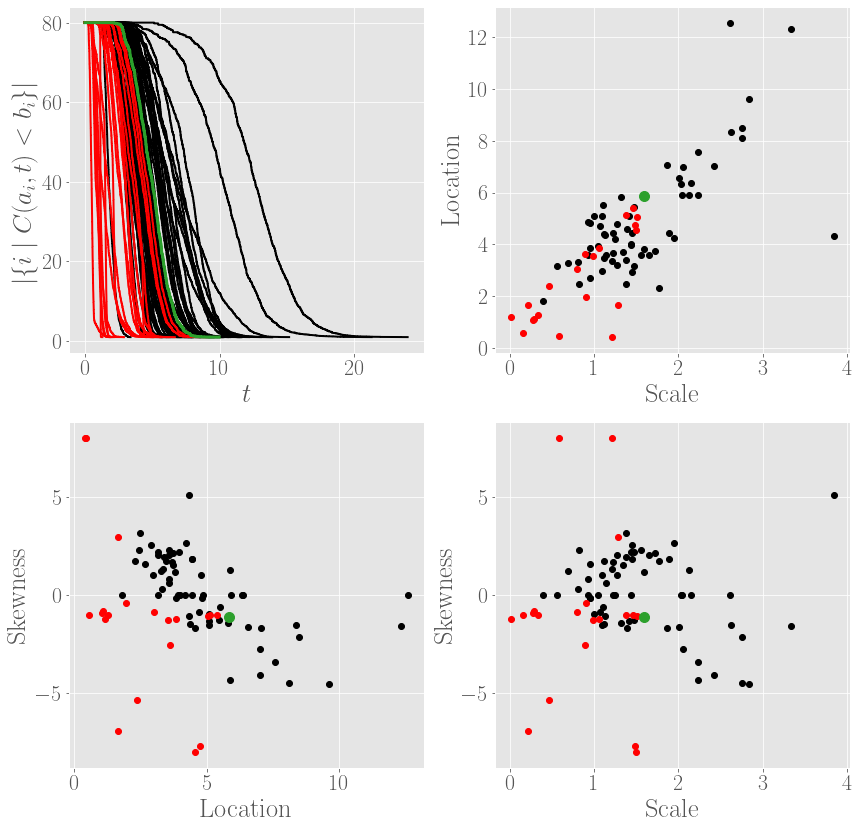

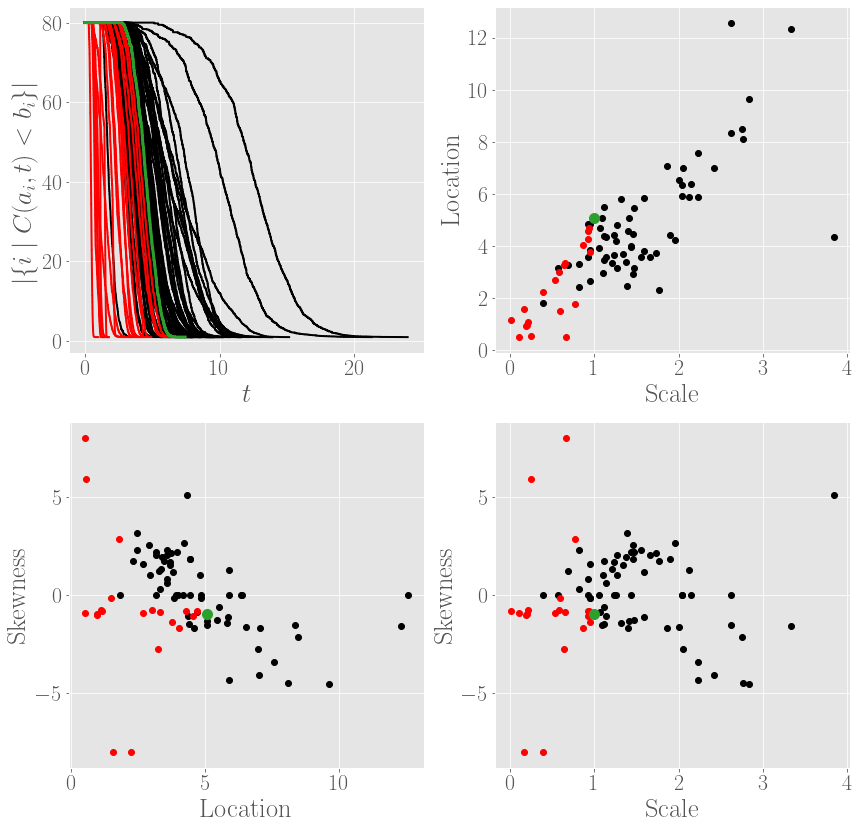

In [1884]:
show = True
labels = ['Skewness', 'Location', 'Scale'] 

temp = 0
for special_subject in data.train_subjects_noctr[3, 5, 9]:
    for comb_id in [21]: #hsrs.keys():
        fig, ax = plt.subplots(2, 2, figsize = (14, 14))
        plt.subplots_adjust(wspace=0.2)
        plt.subplots_adjust(hspace=0.2)

        ax[0, 0].set_xlabel('$t$')
        ax[0, 0].set_ylabel('$|\{i \mid C(a_i, t) < b_i \}|$')
        ax[1, 0].set_xlabel(labels[1])
        ax[1, 0].set_ylabel(labels[0])
        ax[0, 1].set_xlabel(labels[2])
        ax[0, 1].set_ylabel(labels[1])
        ax[1, 1].set_xlabel(labels[2])
        ax[1, 1].set_ylabel(labels[0])

        for subject in data.train_subjects:
            params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs[comb_id]["H0_single"])   
            s = 6

            x = params[0]
            y = params[1]
            z = params[2]

            hsrs[comb_id]["H0_single"][subject].plot(ax = ax[0, 0], color = 'k')
            ax[0, 1].plot(z, y, 'o', ms = s, color = 'k')
            ax[1, 0].plot(y, x, 'o', ms = s, color = 'k')
            ax[1, 1].plot(z, x, 'o', ms = s, color = 'k')

        for cp_id in range(20):
            params, x, y, xFit, yFit, error, std = fit_1skew_H0(special_subject, bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs_H0_contour[cp_id])
            s = 6

            x = params[0]
            y = params[1]
            z = params[2]

            hsrs_H0_contour[cp_id][special_subject].plot(ax = ax[0, 0], label = cp_id, color = 'r')
            ax[0, 1].plot(z, y, 'o', ms = s, color = 'r')
            ax[1, 0].plot(y, x, 'o', ms = s, color = 'r')
            ax[1, 1].plot(z, x, 'o', ms = s, color = 'r')

        params, x, y, xFit, yFit, error, std = fit_1skew_H0(special_subject, bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs[comb_id]["H0_single"])   
        s = 10

        x = params[0]
        y = params[1]
        z = params[2]

        hsrs[comb_id]["H0_single"][special_subject].plot(ax = ax[0, 0], color = 'tab:green', linewidth = 3)
        ax[0, 1].plot(z, y, 'o', ms = s, color = 'tab:green')
        ax[1, 0].plot(y, x, 'o', ms = s, color = 'tab:green')
        ax[1, 1].plot(z, x, 'o', ms = s, color = 'tab:green')

        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"Contours_comb"+str(comb_id)+"_oneSubject"+str(special_subject)+"_H0_scatterPlot.jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()
        
    temp += 1
    if temp > 1:
        break

In [1993]:
maxVals_H0

{42: 1013.3308249201649,
 0: 0.81715,
 7: 0.86546,
 14: 0.9437275,
 21: 23.864247081295005,
 28: 4.481986568551841,
 35: 4.96053902233631}

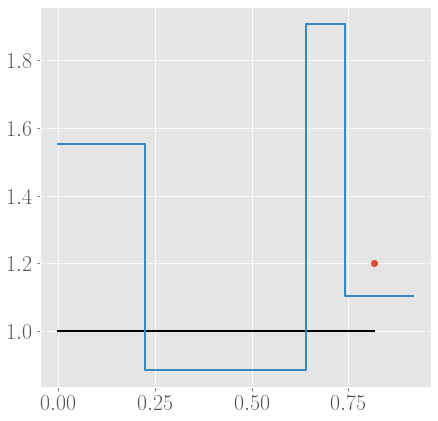

In [2014]:
comb_id = 0
cp = cp_dict[cp_id]
f_H0 = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H0[comb_id], np.array([cp[3], cp[4], cp[5], cp[6]])*2])

plt.plot([0, maxVals_H0[comb_id]], [1, 1], 'k', linewidth = 2)
plt.plot(maxVals_H0[comb_id], 1.2, 'o')
f_H0.content = f_H0._extend([maxVals_H0[comb_id]])
f_H0.plot()

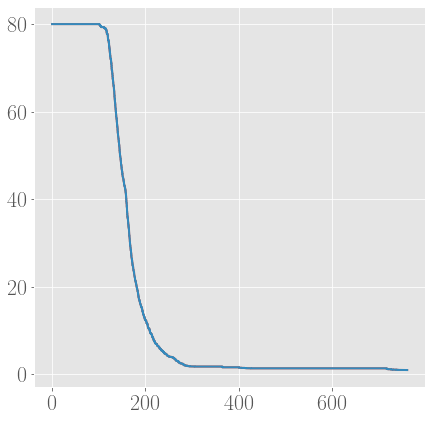

In [2129]:
comb_id = 42
comb = prePHparam.loc[comb_id]

subject = 23
sample = sr.get_sample(number_instances = data.default_number_instances, sample_size = data.default_sample_size, probabilities = 200)
dist_mat = data.DistanceMatrix(subject = subject, 
                                           method = comb['methods'], 
                                           neg_vals_method = comb['neg_vals_methods'], 
                                           symmetrization = comb['symmetrizations'], 
                                           cor_to_dist_func = 'linear').dist_mat

d = sr.Distance(dist_mat)

homology = "H0_single"
clustering_method = homology.split("_")[1]
temp_H0 = d.get_h0sr(sample=sample, clustering_method=clustering_method)
barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
temp_H0_2 = sr.bc_to_sr(barcode, degree = "H0")
            
temp_H0.plot()
temp_H0_2.plot()

In [37]:
save = False
comb_id = 42

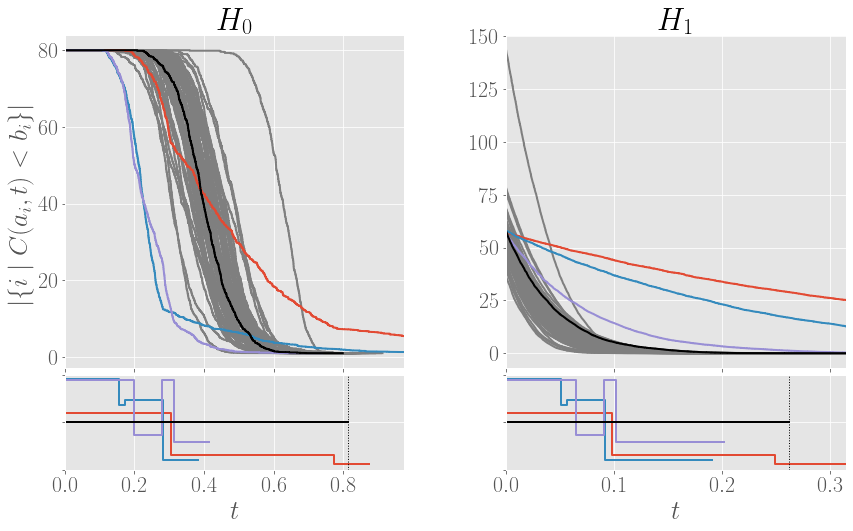

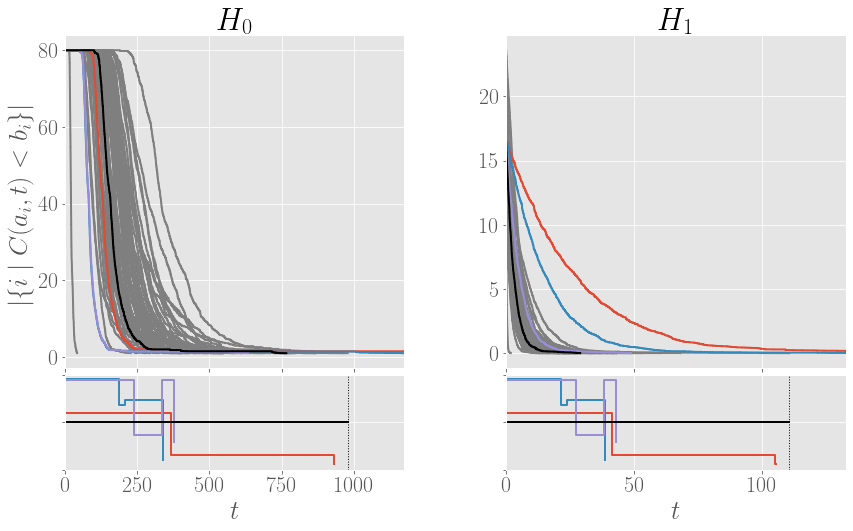

In [36]:
show = True
labels = ['Skewness', 'Location', 'Scale'] 

temp = 0
for special_subject in [23]: #, 30]:
    for comb_id in [0, 42]: #, 7, 14, 21, 28, 35, 42]: #hsrs.keys():
        fig, ax = plt.subplots(2, 2, figsize = (14, 8), gridspec_kw={'height_ratios': [7, 2]})
        plt.subplots_adjust(wspace=0.3)
        plt.subplots_adjust(hspace=0.03)

        ax[0, 0].set_ylabel('$|\{i \mid C(a_i, t) < b_i \}|$')
        ax[1, 0].set_xlabel('$t$')
        #ax[1, 0].set_ylabel('density')
        ax[1, 1].set_xlabel('$t$')

        for subject in data.train_subjects:
            hsrs[comb_id]["H0_single"][subject].plot(ax = ax[0, 0], color = 'tab:grey')
            hsrs[comb_id]["H1"][subject].plot(ax = ax[0, 1], color = 'tab:grey')
            
        k = 0
        for cp_id in [1, 6, 25]:
            #new_hsrs_H0_contour[cp_id][comb_id][special_subject].plot(ax = ax[0, 0], label = cp_id, color = 'C'+str(k), linestyle = '--')
            new_hsrs_H1_contour[cp_id][comb_id][special_subject].plot(ax = ax[0, 1], label = cp_id, color = 'C'+str(k))
            new_hsrs_H0_contour_2[cp_id][comb_id][special_subject].plot(ax = ax[0, 0], label = cp_id, color = 'C'+str(k))
            
            cp = new_cp_dict[cp_id]
            f_H0 = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H0[comb_id], np.array([cp[3], cp[4], cp[5], cp[6]])*2])
            #f_H0.content = f_H0.restrict(0, maxVals_H0[comb_id])
            f_H0.plot(ax = ax[1, 0], color = 'C'+str(k))
            f_H1 = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H1[comb_id], np.array([cp[3], cp[4], cp[5], cp[6]])*2])
            #f_H1.content = f_H1.restrict(0, maxVals_H1[comb_id])
            f_H1.plot(ax = ax[1, 1], color = 'C'+str(k))
            
            k += 1

        ax[1, 0].plot([0, maxVals_H0[comb_id]], [1, 1], 'k', linewidth = 2)
        ax[1, 1].plot([0, maxVals_H1[comb_id]], [1, 1], 'k', linewidth = 2)
        ax[1, 0].plot([maxVals_H0[comb_id], maxVals_H0[comb_id]], [0, 2], 'k:', linewidth = 1)
        ax[1, 1].plot([maxVals_H1[comb_id], maxVals_H1[comb_id]], [0, 2], 'k:', linewidth = 1)
    
    
        hsrs[comb_id]["H0_single"][special_subject].plot(ax = ax[0, 0], color = 'k', linewidth = 2)
        hsrs[comb_id]["H1"][special_subject].plot(ax = ax[0, 1], color = 'k', linewidth = 2)        
        
        ax[0, 0].set_xlim(0, 1.2*maxVals_H0[comb_id])
        ax[1, 0].set_xlim(0, 1.2*maxVals_H0[comb_id])
        ax[0, 1].set_xlim(0, 1.2*maxVals_H1[comb_id])
        ax[1, 1].set_xlim(0, 1.2*maxVals_H1[comb_id])
        
        #if comb_id == 0:
        #    ax[0, 0].set_xlim(0, 1.3)
        #    ax[1, 0].set_xlim(0, 1.3)
        #    ax[0, 1].set_xlim(0, 0.4)
        #    ax[1, 1].set_xlim(0, 0.4)
        #if comb_id == 42:
        #    ax[0, 0].set_xlim(0, 1200)
        #    ax[1, 0].set_xlim(0, 1200)
        #    ax[0, 1].set_xlim(0, 150)
        #    ax[1, 1].set_xlim(0, 150)
            
        ax[0, 0].set_xticklabels([])
        ax[0, 1].set_xticklabels([])
        ax[1, 0].set_yticklabels([])
        ax[1, 1].set_yticklabels([])
        
        ax[1, 0].set_ylim(0, 2)
        ax[1, 1].set_ylim(0, 2)
        
        ax[0, 0].set_title('$H_0$')
        ax[0, 1].set_title('$H_1$')
        
        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"Contours_comb"+str(comb_id)+"_oneSubject"+str(special_subject)+"_"+ct+".jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()

In [35]:
show = False
np.random.seed(42)

new_cp_dict = dict()
new_hsrs_H0_contour = dict()
new_hsrs_H1_contour = dict()
new_hsrs_H0_contour_2 = dict()

for cp_id in tqdm([1, 6, 25]):
    cp = np.random.rand(7)
    new_cp_dict[cp_id] = cp
    ct = "area"

    new_hsrs_H0_contour[cp_id] = dict()
    new_hsrs_H1_contour[cp_id] = dict()
    new_hsrs_H0_contour_2[cp_id] = dict()
    
    for comb_id in [0, 42]: #, 7, 14, 21, 28, 35, 42]:
        comb = prePHparam.loc[comb_id]
        
        new_hsrs_H0_contour[cp_id][comb_id] = dict()
        new_hsrs_H1_contour[cp_id][comb_id] = dict()
        new_hsrs_H0_contour_2[cp_id][comb_id] = dict()

        for subject in [23]: #, 30]:
            sample = sr.get_sample(number_instances = data.default_number_instances, sample_size = data.default_sample_size, probabilities = 200)
            dist_mat = data.DistanceMatrix(subject = subject, 
                                           method = comb['methods'], 
                                           neg_vals_method = comb['neg_vals_methods'], 
                                           symmetrization = comb['symmetrizations'], 
                                           cor_to_dist_func = 'linear').dist_mat

            d = sr.Distance(dist_mat)
            
            homology = "H0_single"
            f = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H0[comb_id], np.array([cp[3], cp[4], cp[5], cp[6]])*2])
            contour = sr.Contour(f, ct, inf)
            clustering_method = homology.split("_")[1]
            new_hsrs_H0_contour[cp_id][comb_id][subject] = d.get_h0sr(sample=sample, contour=contour, clustering_method=clustering_method)
            barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
            new_hsrs_H0_contour_2[cp_id][comb_id][subject] = sr.bc_to_sr(barcode, contour=contour, degree = "H0")
            
            f = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H1[comb_id], np.array([cp[3], cp[4], cp[5], cp[6]])*2])
            contour = sr.Contour(f, ct, inf)
            barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
            new_hsrs_H1_contour[cp_id][comb_id][subject] = sr.bc_to_sr(barcode, contour=contour, degree = "H1")

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:21<00:00,  7.22s/it]


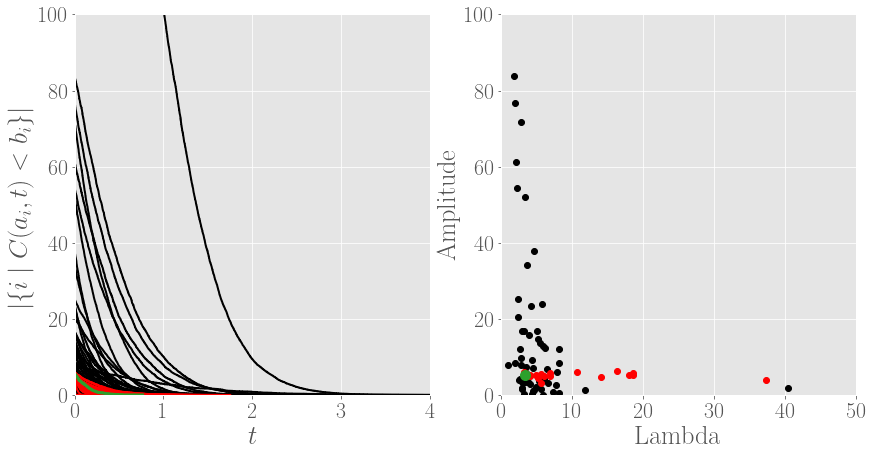

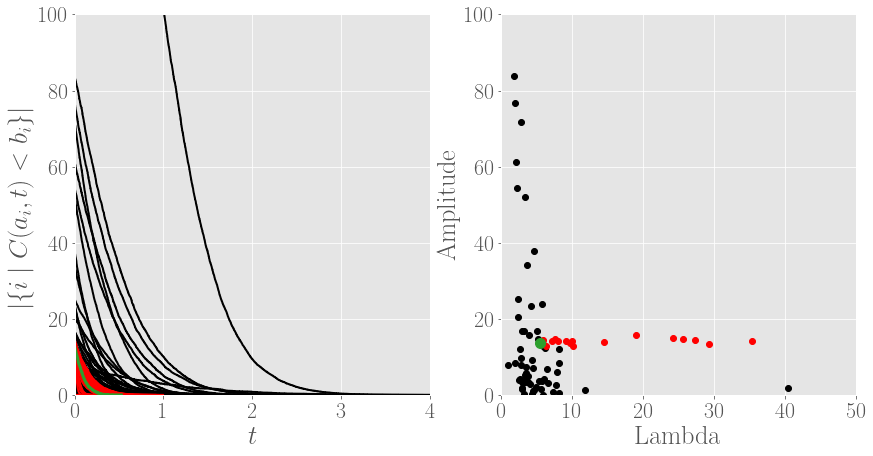

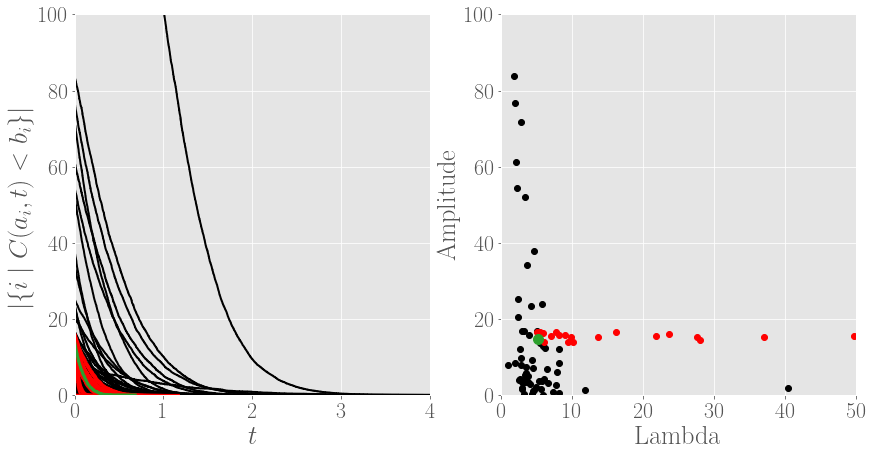

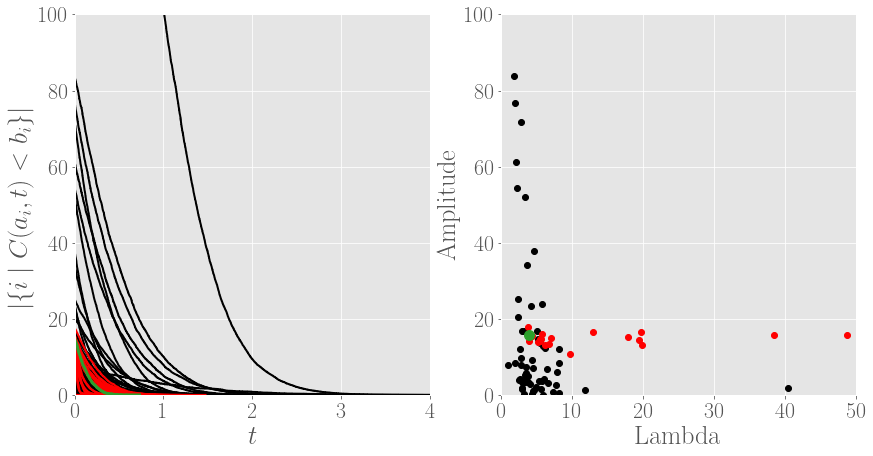

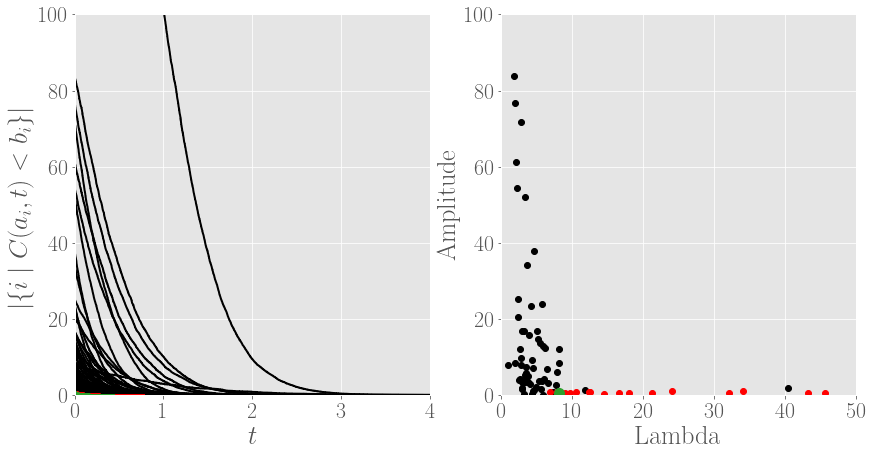

...

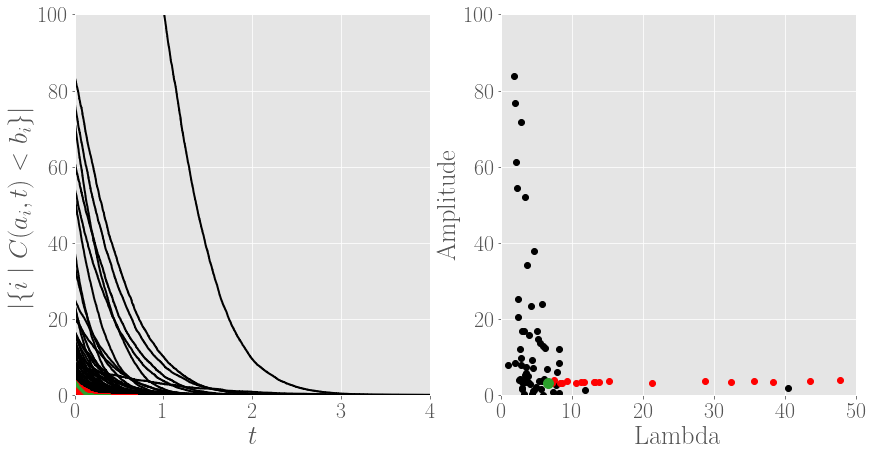

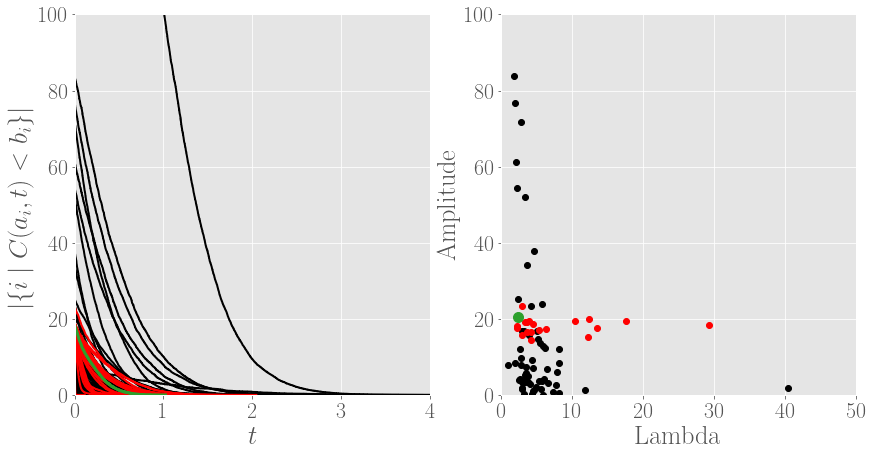

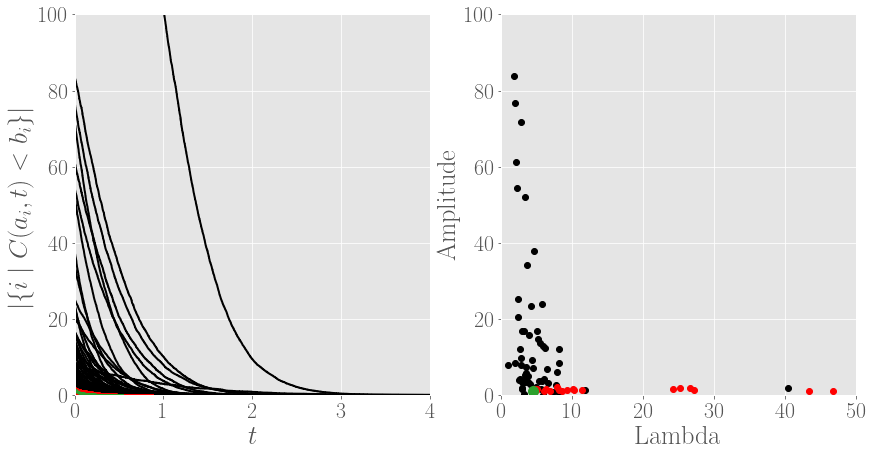

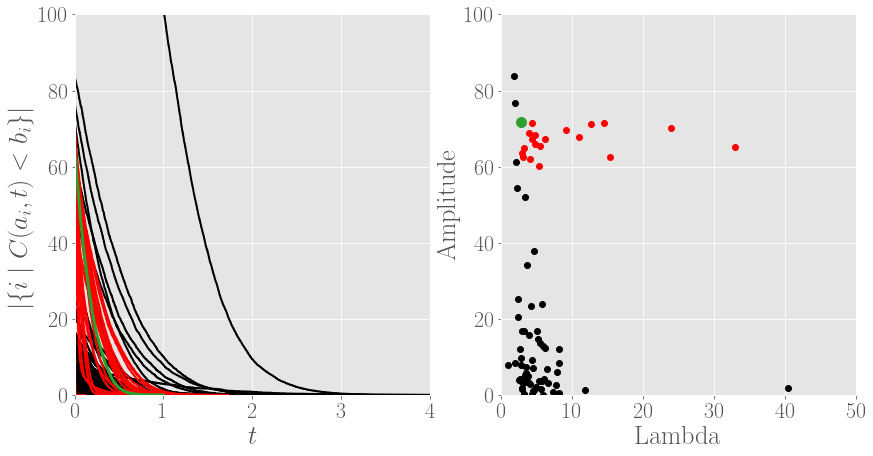

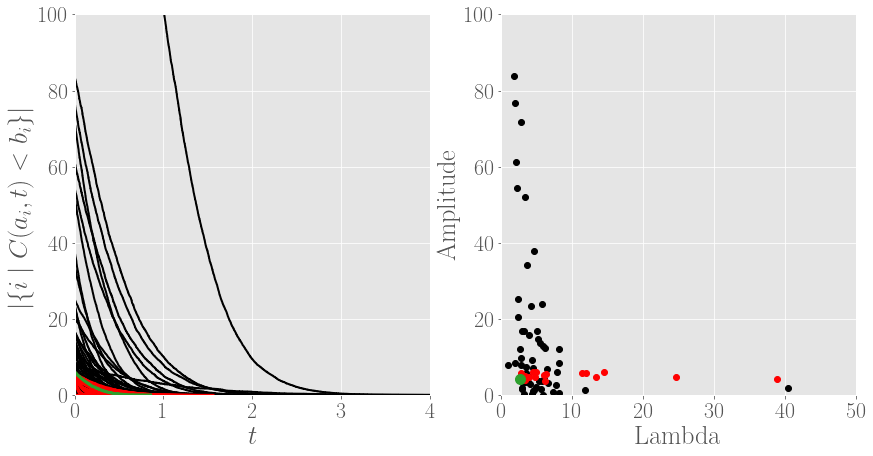

In [1875]:
show = True
labels = ['Lambda', 'Amplitude'] 

temp = 0
for special_subject in data.train_subjects_noctr[3, 5, 9]:
    for comb_id in [0, 7, 14, 21, 28, 35, 42]: #hsrs.keys():
        fig, ax = plt.subplots(1, 2, figsize = (14, 7))
        plt.subplots_adjust(wspace=0.2)
        plt.subplots_adjust(hspace=0.2)

        ax[0].set_xlabel('$t$')
        ax[0].set_ylabel('$|\{i \mid C(a_i, t) < b_i \}|$')
        ax[1].set_xlabel(labels[0])
        ax[1].set_ylabel(labels[1])

        for subject in data.train_subjects:
            params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs[comb_id]["H1"])   
            s = 6

            x = params[0]
            y = params[1]

            hsrs[comb_id]["H1"][subject].plot(ax = ax[0], color = 'k')
            ax[1].plot(x, y, 'o', ms = s, color = 'k')

        for cp_id in range(20):
            params, x, y, xFit, yFit, error, std = fit_exponential_H1(special_subject, bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs_H1_contour[cp_id])
            s = 6

            x = params[0]
            y = params[1]

            hsrs_H1_contour[cp_id][special_subject].plot(ax = ax[0], label = cp_id, color = 'r')
            ax[1].plot(x, y, 'o', ms = s, color = 'r')

        params, x, y, xFit, yFit, error, std = fit_exponential_H1(special_subject, bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs[comb_id]["H1"])   
        s = 10

        x = params[0]
        y = params[1]

        hsrs_H1_contour[cp_id][special_subject].plot(ax = ax[0], color = 'tab:green', linewidth = 3)
        ax[1].plot(x, y, 'o', ms = s, color = 'tab:green')

        ax[0].set_ylim(0, 100)
        ax[0].set_xlim(0, 4)
        ax[1].set_ylim(0, 100)
        ax[1].set_xlim(0, 50)

        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"Contours_comb"+str(comb_id)+"_oneSubject"+str(special_subject)+"_H1_scatterPlot.jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()
        
    temp += 1
    if temp > 3:
        break

In [1841]:
comb_id = 21
comb = prePHparam.loc[comb_id]
comb

methods              delayedPearson\C200_delay1
symmetrizations        transpose_multiplication
neg_vals_methods                            abs
cor_to_dist_funcs                        linear
Name: 21, dtype: object

In [1886]:
show = False
np.random.seed(42)

cp_dict = dict()
hsrs_H0_contour = dict()
hsrs_H1_contour = dict()

for cp_id in tqdm(range(30)):
    cp = np.random.rand(7)
    cp_dict[cp_id] = cp
    ct = "dist"

    hsrs_H0_contour[cp_id] = dict()
    hsrs_H1_contour[cp_id] = dict()
    
    for comb_id in prePHparam.index:
        comb = prePHparam.loc[comb_id]
        
        hsrs_H0_contour[cp_id][comb_id] = dict()
        hsrs_H1_contour[cp_id][comb_id] = dict()

        for subject in data.train_subjects:
            sample = sr.get_sample(number_instances = data.default_number_instances, sample_size = data.default_sample_size, probabilities = 200)
            dist_mat = data.DistanceMatrix(subject = subject, 
                                           method = comb['methods'], 
                                           neg_vals_method = comb['neg_vals_methods'], 
                                           symmetrization = comb['symmetrizations'], 
                                           cor_to_dist_func = 'linear').dist_mat

            d = sr.Distance(dist_mat)
            
            f = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H0[comb_id], [cp[3], cp[4], cp[5], cp[6]]])
            contour = sr.Contour(f, ct, inf)
            clustering_method = homology.split("_")[1]
            hsrs_H0_contour[cp_id][comb_id][subject] = d.get_h0sr(sample=sample, contour=contour, clustering_method=clustering_method)
            
            f = sr.Density([np.sort([0, cp[0], cp[1], cp[2]])*maxVals_H1[comb_id], [cp[3], cp[4], cp[5], cp[6]]])
            contour = sr.Contour(f, ct, inf)
            barcode = d.get_bc(sample=sample, maxdim=1, thresh=inf, coeff=2)
            hsrs_H1_contour[cp_id][comb_id][subject] = sr.bc_to_sr(barcode, contour=contour, degree = "H1")
    

100%|███████████████████████████████████████████████████████████████████████████████| 30/30 [7:41:36<00:00, 923.21s/it]


In [1933]:
show = False
params_H0_1skew_contour = dict()
params_H1_exponential_contour = dict()

for comb_id in hsrs_H0_contour[0].keys():
    params_H0_1skew_contour[comb_id] = dict()
    params_H1_exponential_contour[comb_id] = dict()
        
    for cp_id in tqdm(range(30)):
        params_H0_1skew_contour[comb_id][cp_id] = dict()
        params_H1_exponential_contour[comb_id][cp_id] = dict()

        for subject in data.train_subjects:
            params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs_H0_contour[cp_id][comb_id])   
            params_H0_1skew_contour[comb_id][cp_id][subject] = params
            params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs_H1_contour[cp_id][comb_id])   
            params_H1_exponential_contour[comb_id][cp_id][subject] = params

        labels = ['Skewness', 'Location', 'Scale'] 

        fig, ax = plt.subplots(2, 2, figsize = (14, 14))
        plt.subplots_adjust(wspace=0.2)
        plt.subplots_adjust(hspace=0.2)

        ax[0, 0].set_xlabel('$t$')
        ax[0, 0].set_ylabel('$|\{i \mid C(a_i, t) < b_i \}|$')
        ax[1, 0].set_xlabel(labels[1])
        ax[1, 0].set_ylabel(labels[0])
        ax[0, 1].set_xlabel(labels[2])
        ax[0, 1].set_ylabel(labels[1])
        ax[1, 1].set_xlabel(labels[2])
        ax[1, 1].set_ylabel(labels[0])

        s = 6
        i = 0
        for subject in data.train_subjects:
            if subject in data.train_i_ctr:
                c = 'k'
            else:
                c = 'r'

            x = params_H0_1skew_contour[comb_id][cp_id][subject][0]
            y = params_H0_1skew_contour[comb_id][cp_id][subject][1]
            z = params_H0_1skew_contour[comb_id][cp_id][subject][2]

            hsrs_H0_contour[cp_id][comb_id][subject].plot(ax = ax[0, 0], color = c)
            ax[0, 1].plot(z, y, 'o', color = c, ms = s)
            ax[1, 0].plot(y, x, 'o', color = c, ms = s)
            ax[1, 1].plot(z, x, 'o', color = c, ms = s)
            i += 1

        for subject in data.train_i_ctr:
            hsrs_H0_contour[cp_id][comb_id][subject].plot(ax = ax[0, 0], color = 'k')

        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"Contours_comb"+str(comb_id)+"_cp"+str(cp_id)+"_H0.jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()

        labels = ["Lambda", "Amplitude"]

        fig, ax = plt.subplots(1, 2, figsize = (14, 7))
        plt.subplots_adjust(wspace=0.2)
        plt.subplots_adjust(hspace=0.2)

        ax[0].set_xlabel('$t$')
        ax[0].set_ylabel('$|\{i \mid C(a_i, t) < b_i \}|$')
        ax[1].set_xlabel(labels[0])
        ax[1].set_ylabel(labels[1])

        s = 6
        i = 0
        for subject in data.train_subjects:
            if subject in data.train_i_ctr:
                c = 'k'
            else:
                c = 'r'

            x = params_H1_exponential_contour[comb_id][cp_id][subject][0]
            y = params_H1_exponential_contour[comb_id][cp_id][subject][1]

            hsrs_H1_contour[cp_id][comb_id][subject].plot(ax = ax[0], color = c)
            ax[1].plot(x, y, 'o', color = c, ms = s)
            i += 1

        for subject in data.train_i_ctr:
            hsrs_H1_contour[cp_id][comb_id][subject].plot(ax = ax[0], color = 'k')

        if testing:
            addOn = "test_"
        else:
            addOn = ""
        if save:
            plt.savefig(fig_path+addOn+"Contours_comb"+str(comb_id)+"_cp"+str(cp_id)+"_H1.jpg", bbox_inches="tight")
        if show:
            plt.show()
        plt.close()

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [06:11<00:00, 12.37s/it]


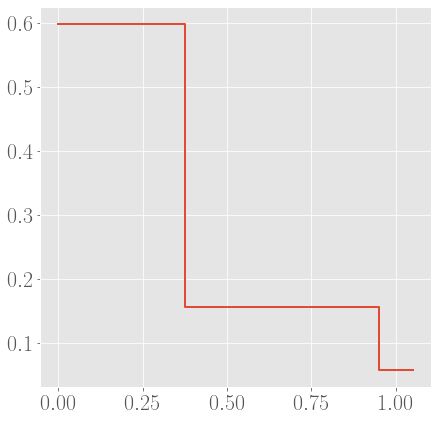

In [1792]:
cp = cp_dict[0]
f = sr.Density([np.sort([0, cp[0], cp[1], cp[2]]), [cp[3], cp[4], cp[5], cp[6]]])
f.plot()

# Mspace analysis

In [55]:
comb_id = 42
comb = prePHparam.loc[comb_id]
comb

methods               dtw
symmetrizations      None
neg_vals_methods     None
cor_to_dist_funcs    None
Name: 42, dtype: object

In [56]:
hsrs_H0 = hsrs[comb_id]["H0_single"]
hsrs_H1 = hsrs[comb_id]["H1"]

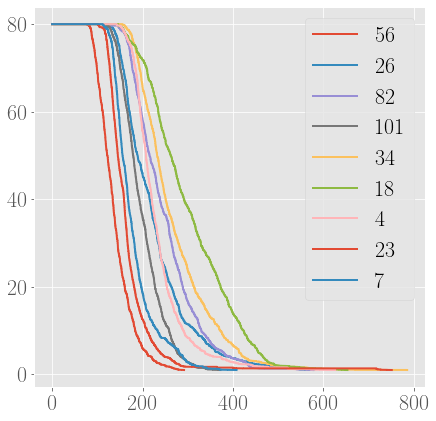

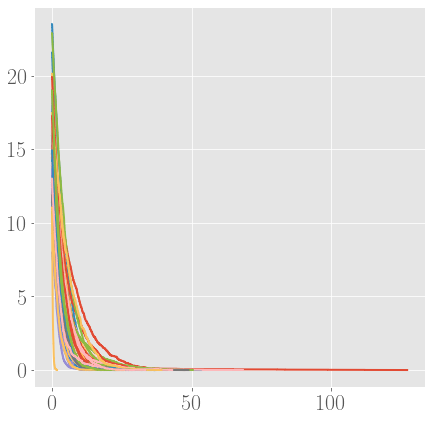

In [57]:
plt.figure()
j = 0
for subject in data.train_subjects:
    if j % 7 == 5:
    #if subject in [86, 71]:
        hsrs_H0[subject].plot(label = subject)
    j += 1
plt.legend()
plt.show()

plt.figure()
for subject in data.train_subjects:
    hsrs_H1[subject].plot()
plt.show()

In [2416]:
maxVal_H0 = 750
maxVal_H1 = 20

## Location evaluation

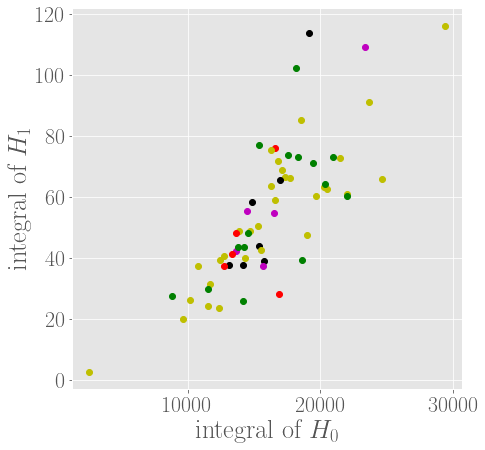

<Figure size 504x504 with 0 Axes>

In [775]:
plt.figure()
for subject in data.train_subjects:
    xx = hsrs_H0[subject].integrate(start = 0, end = maxVal_H0)
    yy = hsrs_H1[subject].integrate(start = 0, end = maxVal_H1)
    plt.plot(xx, yy, "o", color = data.colors[subject])
plt.xlabel('integral of $H_0$')
plt.ylabel('integral of $H_1$')
plt.show()

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_locEval_integrateH0H1.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

## Sorting

In [776]:
size = 500
cmap = 'Spectral' #'PiYG' #'Purples' #'gist_stern'

In [777]:
df_H0 = data.generate_df(hsrs = hsrs_H0, maxVal = maxVal_H0, size = size)
df_H1 = data.generate_df(hsrs = hsrs_H1, maxVal = maxVal_H1, size = size)

In [778]:
def sort_by_value(df, val):
    df_sorted = df.copy()
    index_dict = {}
    for subject in df.index.values:
        for column in df.columns.values:
            if df_sorted.loc[subject, column] <= val:
                index_dict[subject] = column
                break
    df_sorted['toSortOn'] = pd.Series(index_dict)
    df_sorted = df_sorted.sort_values(by=['toSortOn'])
    df_sorted = df_sorted.drop(['toSortOn'], axis = 1)
    return df_sorted, index_dict

In [779]:
def plot_sorted(df, maxVal, fn, testing, save, show, nr_ticks = 4):
    plt.figure(figsize = (12, 8))
    plt.grid(False)
    plt.imshow(df, aspect='auto', interpolation='none', cmap = cmap)
    plt.colorbar()
    
    #add ticks and tick labels
    xticks = np.arange(0, size+1, size/nr_ticks)
    xlabels = [str(x) for x in np.arange(0, maxVal+1, maxVal/nr_ticks)]
    yticks = np.arange(0, df.shape[0], 1)
    ylabels = df.index
    plt.xticks(xticks, labels = xlabels)
    plt.yticks(yticks, labels = ylabels, fontsize = 8)
    
    #color tick labels 
    labels_num = [data.labels_num[subject] for subject in df.index.values]
    labels_color = []
    for i in range(len(labels_num)):
        if labels_num[i] == 0:
            labels_color.append('k')
        else:
            labels_color.append('r')
    for ticklabel, tickcolor in zip(plt.gca().get_yticklabels(), labels_color):
        ticklabel.set_color(tickcolor)
    
    plt.ylabel('Subjects')
    plt.xlabel('$t$')
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+fn+".jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

In [780]:
j = 0
df_H0_sortedIntegral = data.sort_by_integral(df_H0, hsrs_H0, maxVal = maxVal_H0)
df_H1_sortedIntegral = data.sort_by_integral(df_H1, hsrs_H1, maxVal = maxVal_H1)
df_H1_sortedIndex = data.sort_by_index(df_H1, j = j)

#plot_sorted(df = df_H0_sortedIntegral, maxVal = maxVal_H0, fn = "Mspace_comb"+str(comb_id)"_sorting_H0integral", testing = testing, save = save, show = show)
#plot_sorted(df = df_H1_sortedIntegral, maxVal = maxVal_H1, fn = "Mspace_comb"+str(comb_id)+"_sorting_H1integral", testing = testing, save = save, show = show)
#plot_sorted(df = df_H1_sortedIndex, maxVal = maxVal_H1, fn = "Mspace_comb"+str(comb_id)+"_sorting_H1index"+str(j), testing = testing, save = save, show = show)

In [781]:
val = 25
df_H0_sortedValue, index_dict = sort_by_value(df = df_H0, val = val) 
#plot_sorted(df = df_H0_sortedValue, maxVal = maxVal_H0, fn = "Mspace_comb"+str(comb_id)+"_sorting_H0value"+str(val), testing = testing, save = save, show = show)

In [783]:
#for val in range(1, 11, 1):
#    df_H1_sortedValue, index_dict = sort_by_value(df = df_H1, val = val)  
#    for subject in data.train_subjects:
#        ind = index_dict[subject]
#        df_H1_sortedValue.loc[subject, [ind-2, ind-1, ind, ind+1, ind+2]] = [np.nan] * 5
#    plot_sorted(df = df_H1_sortedValue, maxVal = maxVal_H1, fn = "Mspace_comb"+str(comb_id)+"_sorting_H1value"+str(val), testing = testing, save = save, show = show)

# Fit distributions

### Math helper functions

In [58]:
def phi(x):
    return 1/math.sqrt(2*math.pi) * np.exp(-x**2 / 2)

def Phi(x):
    return 0.5 * (1 + erf(x / math.sqrt(2)))

Phi0 = Phi(0)

def normal_pdf(x, mu, sigma):
    return (1 / (sigma * math.sqrt(2*math.pi))) * np.exp(-0.5*((x-mu)/sigma)**2)

def skew_cdf(x, a, loc, scale):
    return Phi((x - loc)/scale) - 2 * owens_t((x-loc)/scale, a)
    
def dPsi_da(x, a, loc, scale):
    return -(1/(math.pi * (1 + a**2))) * np.exp(-0.5 * ((x-loc)/scale)**2 * (1 + a**2)) 

def dPsi_dloc(x, a, loc, scale):
    temp1 = - 1/scale * phi((x-loc)/scale)
    temp2 = - 2*(x-loc)/(scale**2) * phi((x-loc)/scale) * (Phi((x-loc)*a/scale) - Phi0)
    return temp1 + temp2

def dPsi_dscale(x, a, loc, scale):
    temp1 = - (x-loc)/(scale**2) * phi((x-loc)/scale)
    temp2 = - (2*(x-loc)**2) / (scale**3) * phi((x-loc)/scale) * (Phi((x-loc)*a/scale) - Phi0)
    return temp1 + temp2

def Frechet(x, a, s):
    y = np.zeros(len(x))
    for i in range(len(x)):
        if x[i] == 0:
            y[i] = 0
        elif (s / x[i])**a > 700:
            y[i] = 0
        else:
            y[i] = 1 / np.exp((s / x[i])**a)
    return y

def exponential(x, lamb):
    return 1 - np.exp(-lamb * x)

### Functions to fit

In [59]:
def f0_1skew(x, a, loc, scale):
    return 79 * (1 - skew_cdf(x = x, a = a, loc = loc, scale = scale)) + 1

def f0_frechet(x, a, s):
    return 79 * (1 - Frechet(x, a, s)) + 1

def f1_exponential(x, lamb, amplitude):
    return amplitude * (1 - exponential(x, lamb))

##

def get_xy(subject, hom, temp_hsrs_H0 = hsrs_H0, temp_hsrs_H1 = hsrs_H1):
    if hom == "H0":
        [x, y] = temp_hsrs_H0[subject].content.copy()        
    else:
        [x, y] = temp_hsrs_H1[subject].content.copy()
    
    last = x[-1]
    x = x[1:]
    y = y[1:]
        
    return (x, y)

def fit_1skew_H0(subject, bounds, temp_hsrs_H0 = hsrs_H0, analytic_jac = False):
    (x, y) = get_xy(subject, hom = "H0", temp_hsrs_H0 = temp_hsrs_H0)
    
    if subject == 58:
        step = (200 - x[-1])/5
        addX = np.arange(x[-1]+step, 200+step, step)
        addY = np.ones(addX.shape)
        x = np.concatenate([x, addX]) 
        y = np.concatenate([y, addY]) 
        
    if analytic_jac:
        params = sp.optimize.curve_fit(f0_1skew, x, y, bounds = bounds, jac = jac_f0_1skew)
    else:
        params = sp.optimize.curve_fit(f0_1skew, x, y, bounds = bounds)
    std = np.sqrt(np.diag(params[1]))
    
    end = x[-1]
    steps = 1000
    
    xFit = np.arange(0, end, end/steps)
    yFit = f0_1skew(x = xFit, a = params[0][0], loc = params[0][1], scale = params[0][2])
    yTrue = temp_hsrs_H0[subject].evaluate(xFit)
    error = sum(yFit - yTrue) / steps
    
    return params[0], x, y, xFit, yFit, error, std

def fit_frechet_H0(subject, bounds):
    (x, y) = get_xy(subject, hom = "H0")
    
    if x[-1] < 350:
        step = (500 - x[-1])/5
        addX = np.arange(x[-1]+step, 500+step, step)
        addY = np.ones(addX.shape)
        x = np.concatenate([x, addX]) 
        y = np.concatenate([y, addY])
    
    params = sp.optimize.curve_fit(f0_frechet, x, y, bounds = bounds, maxfev = 10000)   
    std = np.sqrt(np.diag(params[1]))
    
    end = x[-1]
    steps = 1000
    
    xFit = np.arange(0, end, end/steps)
    yFit = f0_frechet(x = xFit, a = params[0][0], s = params[0][1])
    yTrue = hsrs_H0[subject].evaluate(xFit)
    error = sum(yFit - yTrue) / steps
    
    return params[0], x, y, xFit, yFit, error, std

def fit_exponential_H1(subject, bounds, temp_hsrs_H1 = hsrs_H1):
    (x, y) = get_xy(subject, hom = "H1", temp_hsrs_H1 = temp_hsrs_H1)
    
    if subject == 58:
        step = (20 - x[-1])/5
        addX = np.arange(x[-1]+step, 20+step, step)
        addY = np.zeros(addX.shape)
        x = np.concatenate([x, addX]) 
        y = np.concatenate([y, addY]) 
    
    amplitude = y[0]
    bounds = (bounds[0] + [amplitude-0.1], bounds[1] + [amplitude+0.1])
    
    params = sp.optimize.curve_fit(f1_exponential, x, y, bounds = bounds, maxfev = 10000)     
    std = np.sqrt(np.diag(params[1]))
    
    end = x[-1]
    steps = 1000
    
    xFit = np.arange(0, end, end/steps)
    yFit = f1_exponential(x = xFit, lamb = params[0][0], amplitude = params[0][1])
    yTrue = temp_hsrs_H1[subject].evaluate(xFit)
    error = sum(yFit - yTrue) / steps
    
    return params[0], x, y, xFit, yFit, error, std

### Bounds

In [60]:
bounds_1skew_H0 = dict()
bounds_1skew_xTransform_H0 = dict()
bounds_frechet_H0 = dict()
bounds_1skew_H1 = dict()
bounds_frechet_H1 = dict()
bounds_exponential_H1 = dict()
end_H0 = dict()
end_H1 = dict()

bounds_1skew_H0[42] = ([1, 1, 1], [100, 300, 300])
bounds_frechet_H0[42] = ([0, 0], [10, 1000])
bounds_exponential_H1[42] = ([0], [4])
end_H0[42] = 1100
end_H1[42] = 50

for comb_id in range(0, 21):
    bounds_1skew_H0[comb_id] = ([-3, 0, 0], [3, 10, 20])
    bounds_exponential_H1[comb_id] = ([0], [50])
    end_H0[comb_id] = 1
    end_H1[comb_id] = 0.2
for comb_id in range(21, 28):
    bounds_1skew_H0[comb_id] = ([-3, 0, 0], [3, 15, 15])
    bounds_exponential_H1[comb_id] = ([0], [50])
    end_H0[comb_id] = 25  
    end_H1[comb_id] = 0.4
for comb_id in range(28, 42):
    bounds_1skew_H0[comb_id] = ([-3, 0, 0], [3, 10, 20])
    bounds_exponential_H1[comb_id] = ([0], [150])
    end_H0[comb_id] = 5
    end_H1[comb_id] = 1
    
comb_id = 42
comb = prePHparam.loc[comb_id]

In [61]:
#for comb_id in prePHparam.index:
#    test = []
#    for subject in data.train_subjects_noctr:
#        test.append(hsrs[comb_id]['H1'][subject].content[0,-1])
#    print(comb_id)
#    print(max(test))

### Clustering based on original srs

In [62]:
def get_features(hsrs, mode):
    subjects = data.train_subjects_noctr
    
    temp1 = []
    temp2 = []
    for subject in subjects:
        temp1.append(hsrs[subject].content[1,1])
        temp2.append(hsrs[subject].content[1,-1])
    maxVal = min(temp1)
    minVal = max(temp2)
        
    if mode == "values":
        nr_of_features = 50 #desired number of features
        features = dict()
        countRange = np.arange(maxVal, minVal-maxVal/nr_of_features, -maxVal/nr_of_features)

        for subject in subjects:
            t = hsrs[subject].content[0]
            count = hsrs[subject].content[1]
            interp = sp.interpolate.interp1d(count, t)
            features[subject] = np.zeros(len(countRange))
            for i in range(len(countRange)):
                features[subject][i] = interp(countRange[i])

        feature_matrix = pd.DataFrame.from_dict(features).T
        feature_matrix.columns = countRange
        
    elif mode == "distances": 
        hsr_list = [hsrs[subject] for subject in subjects]
        distance_matrix = sr.Distance(sr.SrObject(hsr_list).get_distance()).square_form()
        feature_matrix = pd.DataFrame(distance_matrix)
        feature_matrix.columns = [subject for subject in subjects]
        feature_matrix.index = [subject for subject in subjects]
    
    else: 
        print("Invalid mode, chose 'values' or 'distances' ")

    return feature_matrix

In [63]:
def hierarchical_clustering(subjects, feature_matrix, fn, cluster_mode, color_threshold, t): 
    fig, ax = plt.subplots(1, 1, figsize=(14, 7))
    
    clusters = hierarchy.linkage(feature_matrix, method = cluster_mode)
    R = hierarchy.dendrogram(clusters, ax=ax, orientation="top", leaf_font_size=14, leaf_rotation=90, color_threshold = color_threshold, labels = subjects)
    cluster_labels = hierarchy.fcluster(clusters, t = t, criterion="maxclust")
    ax.set_ylabel('$t$')
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_dendogram.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()
    
    j = 0
    colors_subjects = {}
    for subject in R['ivl']:
        colors_subjects[subject] = R['leaves_color_list'][j]
        j += 1
        
    clusters_subjectIDs = dict()
    for label in list(set(cluster_labels)):
        temp = []
        for j in [i for i, val in enumerate(cluster_labels == label) if val]:
            temp.append(data.train_subjects_noctr[j])
        clusters_subjectIDs[label] = temp

    return clusters_subjectIDs, colors_subjects

In [102]:
def hierarchical_clustering_plotAll_2by2(subjects, hsrs, feature_matrix, params_df, labels, fn, cluster_mode, 
                                    color_threshold, t, controls, control_params, sizeFactor = [5, 5, 5], sizeEncoding = 'error', plotControls = True): 
    fig, ax = plt.subplots(1, 1, figsize=(14, 7))
    
    clusters = hierarchy.linkage(feature_matrix, method = cluster_mode)
    R = hierarchy.dendrogram(clusters, ax=ax, orientation="top", leaf_font_size=14, leaf_rotation=90, color_threshold = color_threshold, labels = subjects)
    cluster_labels = hierarchy.fcluster(clusters, t = t, criterion="maxclust")
    ax.set_ylabel('$t$')
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_dendogram.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()
    
    fig, ax = plt.subplots(2, 2, figsize = (14, 14))
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.2)
    
    j = 0
    colors_subjects = {}
    for subject in R['ivl']:
        hsr = hsrs[subject]
        colors_subjects[subject] = R['leaves_color_list'][j]
        hsr.plot(ax = ax[0, 0], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        j += 1

    ax[1, 0].set_xlabel('$t$')
    ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0,0].set_xlabel('$t$')
    
    for subject in params_df.index.values:
        x = params_df[1][subject]
        y = params_df[0][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[0] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[2][subject] * 10) * sizeFactor[0] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[1, 0].plot(x, y, 'o', color = c, ms = s)
    ax[1, 0].set_xlabel(labels[1])
    ax[1, 0].set_ylabel(labels[0])

    for subject in params_df.index.values:
        x = params_df[2][subject]
        y = params_df[1][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[1] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[0][subject] * 10) * sizeFactor[1] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[0, 1].plot(x, y, 'o', color = c, ms = s)
    ax[0, 1].set_xlabel(labels[2])
    ax[0, 1].set_ylabel(labels[1])

    for subject in params_df.index.values:
        x = params_df[2][subject]
        y = params_df[0][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[1][subject] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[1, 1].plot(x, y, 'o', color = c, ms = s)

    ax[1, 1].set_xlabel(labels[2])
    ax[1, 1].set_ylabel(labels[0])

    ax[1, 0].set_xlim(-0.05, 1.05)
    ax[1, 0].set_ylim(-0.05, 1.05)
    ax[0, 1].set_xlim(-0.05, 1.05)
    ax[0, 1].set_ylim(-0.05, 1.05)    
    ax[1, 1].set_xlim(-0.05, 1.05)
    ax[1, 1].set_ylim(-0.05, 1.05) 
    
    for control in controls:
        hsrs[control].plot(ax = ax[0, 0], color = 'k')
        
        x = control_params[1][control]
        y = control_params[0][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[2][control] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        ax[1, 0].plot(x, y, 'o', color = 'k', ms = s)
        
        x = control_params[2][control]
        y = control_params[1][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[0][control] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        ax[0, 1].plot(x, y, 'o', color = 'k', ms = s)
        
        x = control_params[2][control]
        y = control_params[0][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[0][control] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        ax[1, 1].plot(x, y, 'o', color = 'k', ms = s)
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_scatterAndHSRs.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

    clusters_subjectIDs = dict()
    for label in list(set(cluster_labels)):
        temp = []
        for j in [i for i, val in enumerate(cluster_labels == label) if val]:
            temp.append(data.train_subjects_noctr[j])
        clusters_subjectIDs[label] = temp

    return clusters_subjectIDs, colors_subjects

    
def hierarchical_clustering_plotAll_1by1(subjects, hsrs, feature_matrix, params_df, labels, fn, cluster_mode, 
                                    color_threshold, t, controls, control_params, sizeFactor = [5, 5, 5], sizeEncoding = 'error'): 
    fig, ax = plt.subplots(1, 1, figsize=(14, 7))
    
    clusters = hierarchy.linkage(feature_matrix, method = cluster_mode)
    R = hierarchy.dendrogram(clusters, ax=ax, orientation="top", leaf_font_size=14, leaf_rotation=90, color_threshold = color_threshold, labels = subjects)
    cluster_labels = hierarchy.fcluster(clusters, t = t, criterion="maxclust")
    ax.set_ylabel('$t$')
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_dendogram.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()
    
    fig, ax = plt.subplots(1, 2, figsize = (14, 7))
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.2)
    
    j = 0
    colors_subjects = {}
    for subject in R['ivl']:
        hsr = hsrs[subject]
        colors_subjects[subject] = R['leaves_color_list'][j]
        hsr.plot(ax = ax[0], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        j += 1

    ax[0].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0].set_xlabel('$t$')
    ax[0].set_xlim(0, 50)
    
    for subject in params_df.index.values:
        x = params_df[0][subject]
        y = params_df[1][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[0] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[2][subject] * 10) * sizeFactor[0] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[1].plot(x, y, 'o', color = c, ms = s)
    ax[1].set_xlabel(labels[0])
    ax[1].set_ylabel(labels[1])

    ax[1].set_xlim(-0.05, 1.05)
    ax[1].set_ylim(-0.05, 1.05)

    for control in controls:
        hsrs[control].plot(ax = ax[0], color = 'k')
        
        x = control_params[0][control]
        y = control_params[1][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[0] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[2][control] * 10) * sizeFactor[0] + 1
        else:
            s = 6
        ax[1].plot(x, y, 'o', color = 'k', ms = s)
        
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_scatterAndHSRs.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

    clusters_subjectIDs = dict()
    for label in list(set(cluster_labels)):
        temp = []
        for j in [i for i, val in enumerate(cluster_labels == label) if val]:
            temp.append(data.train_subjects_noctr[j])
        clusters_subjectIDs[label] = temp

    return clusters_subjectIDs, colors_subjects

In [2431]:
remove_outliers = False

subjects = data.train_subjects_noctr.copy()
if remove_outliers:
    subjects.remove(58)
    subjects.remove(86)
    
clusters_subjectIDs = dict()
colors_subjects = dict()

## H0 1skew

In [65]:
comb_id = 42

In [66]:
params_H0_1skew = dict()

j = 0
for subject in tqdm(data.train_subjects_noctr):
    params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs_H0)   
    error = error / y[0]
    params_H0_1skew[subject] = (params, x, y, xFit, yFit, error, std)
        
    j += 1

100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [00:01<00:00, 29.99it/s]


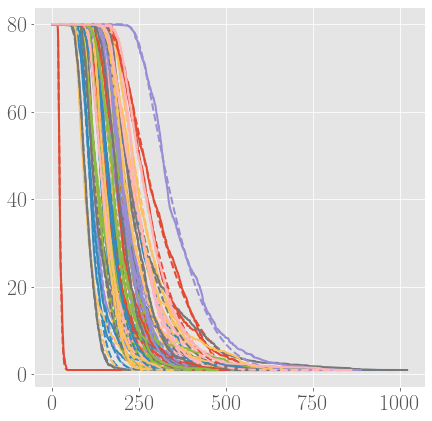

In [67]:
j = 0
error_H0_1skew = {}

for subject in params_H0_1skew.keys():
    if j % 100 == 0:
        plt.figure()
    
    fit = params_H0_1skew[subject]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    error_H0_1skew[subject] = error
    
    plt.plot(x, y, "-", color = 'C'+str(j), label = str(subject) + "; error: " + str(round(error, 2)))
    plt.plot(xFit, yFit, "--", color = 'C'+str(j))
    
    #plt.legend()
        
    j += 1

In [91]:
def plotFits_2by2(subjects, hsrs, params_df, labels, controls, control_params, 
                  sizeFactor = [5, 5, 5], sizeEncoding = 'error', plotControls = True): 
    
    fig, ax = plt.subplots(2, 2, figsize = (14, 14))
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.2)
    
    j = 0
    colors_subjects = {}
    for subject in subjects:
        hsr = hsrs[subject]
        if data.labels[subject] == "CTR":
            colors_subjects[subject] = 'k'
        else:
            colors_subjects[subject] = "cornflowerblue"
        hsr.plot(ax = ax[0, 0], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        j += 1

    ax[1, 0].set_xlabel('$t$')
    ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0,0].set_xlabel('$t$')
    
    for subject in params_df.index.values:
        x = params_df[1][subject]
        y = params_df[0][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[0] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[2][subject] * 10) * sizeFactor[0] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[1, 0].plot(x, y, 'o', color = c, ms = s)
    ax[1, 0].set_xlabel(labels[1])
    ax[1, 0].set_ylabel(labels[0])

    for subject in params_df.index.values:
        x = params_df[2][subject]
        y = params_df[1][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[1] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[0][subject] * 10) * sizeFactor[1] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[0, 1].plot(x, y, 'o', color = c, ms = s)
    ax[0, 1].set_xlabel(labels[2])
    ax[0, 1].set_ylabel(labels[1])

    for subject in params_df.index.values:
        x = params_df[2][subject]
        y = params_df[0][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[1][subject] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[1, 1].plot(x, y, 'o', color = c, ms = s)

    ax[1, 1].set_xlabel(labels[2])
    ax[1, 1].set_ylabel(labels[0])

    ax[1, 0].set_xlim(-0.05, 1.05)
    ax[1, 0].set_ylim(-0.05, 1.05)
    ax[0, 1].set_xlim(-0.05, 1.05)
    ax[0, 1].set_ylim(-0.05, 1.05)    
    ax[1, 1].set_xlim(-0.05, 1.05)
    ax[1, 1].set_ylim(-0.05, 1.05) 
    
    for control in controls:
        hsrs[control].plot(ax = ax[0, 0], color = 'k')
        
        x = control_params[1][control]
        y = control_params[0][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[2][control] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        ax[1, 0].plot(x, y, 'o', color = 'k', ms = s)
        
        x = control_params[2][control]
        y = control_params[1][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[0][control] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        ax[0, 1].plot(x, y, 'o', color = 'k', ms = s)
        
        x = control_params[2][control]
        y = control_params[0][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[0][control] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        ax[1, 1].plot(x, y, 'o', color = 'k', ms = s)
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Presentation_combId"+str(comb_id)+"_scatterPlots", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

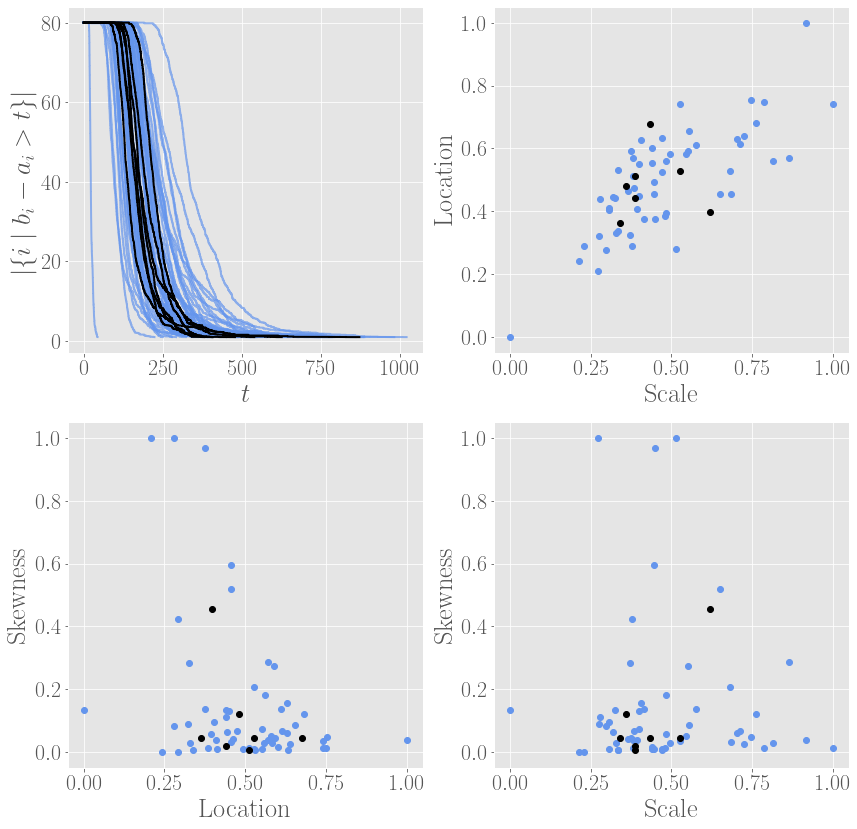

In [93]:
subjects = params_H0_1skew_df_scaled.index.values

params_df = params_H0_1skew_df_scaled #parameters for scatter plotting

labels = ["Skewness", "Location", "Scale"]

control_params = control_params_H0_df_scaled
plotFits_2by2(subjects, hsrs[comb_id]["H0_single"], params_df, labels, controls, control_params, 
                                                             sizeFactor = [4, 4, 4], sizeEncoding = False)

In [89]:
save = True

## H0 Frechet

In [2872]:
params_H0_frechet = dict()

j = 0
for subject in tqdm(data.train_subjects_noctr):
    params, x, y, xFit, yFit, error, std = fit_frechet_H0(subject, bounds_frechet_H0[comb_id])   
    error = error / y[0]
    params_H0_frechet[subject] = (params, x, y, xFit, yFit, error, std)
        
    j += 1

100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [00:09<00:00,  5.94it/s]


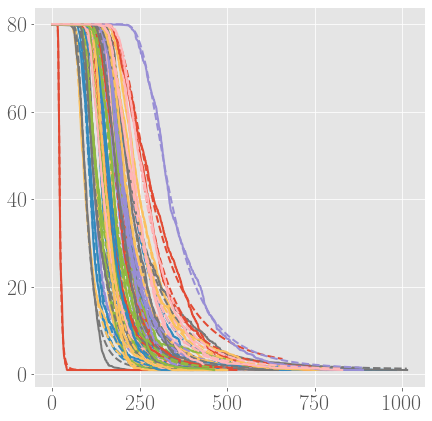

In [2878]:
j = 0
error_H0_frechet = {}

for subject in params_H0_frechet.keys():
    if j % 100 == 0:
        plt.figure()
    
    fit = params_H0_frechet[subject]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    error_H0_frechet[subject] = error
    
    plt.plot(x, y, "-", color = 'C'+str(j), label = str(subject) + "; error: " + str(round(error, 2)))
    plt.plot(xFit, yFit, "--", color = 'C'+str(j))
    
    #plt.legend()
        
    j += 1

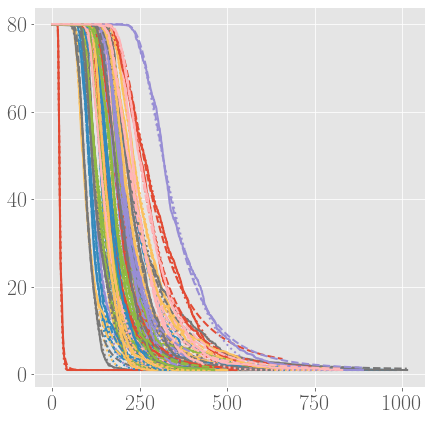

In [2874]:
j = 0
error_H0_frechet = {}

for subject in params_H0_frechet.keys():
    if j % 100 == 0:
        plt.figure()
    
    fit = params_H0_frechet[subject]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    fit2 = params_H0_1skew[subject]
    params2 = fit2[0]
    x2 = fit2[1]
    y2 = fit2[2]
    xFit2 = fit2[3]
    yFit2 = fit2[4]
    error2 = fit2[5]
    std2 = fit2[6]
    
    plt.plot(x, y, "-", color = 'C'+str(j), label = str(subject) + "; error: " + str(round(error, 2)))
    plt.plot(xFit, yFit, "--", color = 'C'+str(j))
    plt.plot(xFit2, yFit2, ":", color = 'C'+str(j))
    
   # plt.legend()
        
    j += 1

In [2864]:
save = False

0.007435013254620162
0.0015322881887763046
0.006654752135593985
0.001175324145068393


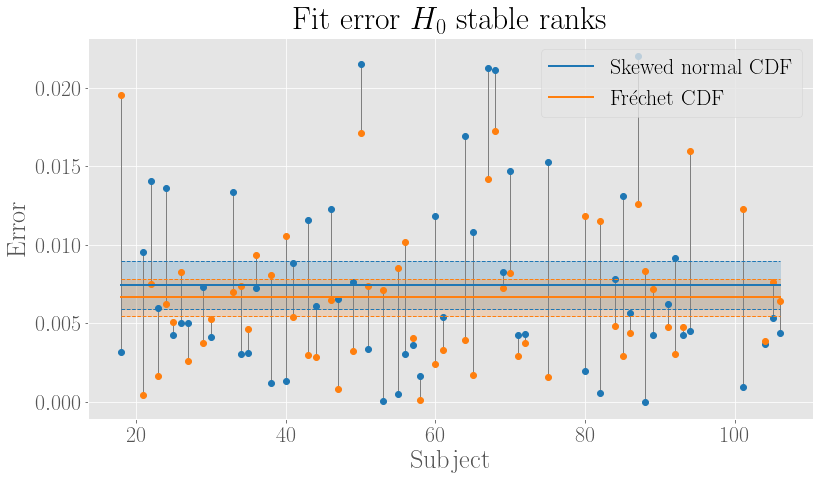

In [2880]:
plt.figure(figsize = (13, 7))
i = 0
for subject in data.train_subjects_noctr:
    plt.plot([subject, subject], [abs(error_H0_1skew[subject]), abs(error_H0_frechet[subject])], 'tab:grey', linewidth = 1)
    plt.plot(subject, abs(error_H0_1skew[subject]), 'o', color = 'tab:blue')
    plt.plot(subject, abs(error_H0_frechet[subject]), 'o', color = 'tab:orange')
    
error_list_H0_1skew = []
error_list_H0_frechet = []

for subject in data.train_subjects_noctr:
    error_list_H0_1skew.append(error_H0_1skew[subject])
    error_list_H0_frechet.append(error_H0_frechet[subject])
    
temp_mean_1skew = np.mean(np.abs(error_list_H0_1skew))
temp_mean_frechet = np.mean(np.abs(error_list_H0_frechet))
temp_std_1skew = np.std(np.abs(error_list_H0_1skew)) * 2
temp_std_frechet = np.std(np.abs(error_list_H0_frechet)) * 2
temp_x = data.train_subjects_noctr[0]
temp_y = data.train_subjects_noctr[-1]
plt.plot([temp_x, temp_y], [temp_mean_1skew, temp_mean_1skew], color = 'tab:blue', label = 'Skewed normal CDF')
plt.plot([temp_x, temp_y], [temp_mean_frechet, temp_mean_frechet], color = 'tab:orange', label = 'Fréchet CDF')
plt.plot([temp_x, temp_y], [temp_mean_1skew-temp_std_1skew/math.sqrt(len(data.train_subjects_noctr)), 
                            temp_mean_1skew-temp_std_1skew/math.sqrt(len(data.train_subjects_noctr))], '--', color = 'tab:blue', linewidth = 1)
plt.plot([temp_x, temp_y], [temp_mean_frechet-temp_std_frechet/math.sqrt(len(data.train_subjects_noctr)), 
                            temp_mean_frechet-temp_std_frechet/math.sqrt(len(data.train_subjects_noctr))], '--', color = 'tab:orange', linewidth = 1)
plt.plot([temp_x, temp_y], [temp_mean_1skew+temp_std_1skew/math.sqrt(len(data.train_subjects_noctr)), 
                            temp_mean_1skew+temp_std_1skew/math.sqrt(len(data.train_subjects_noctr))], '--', color = 'tab:blue', linewidth = 1)
plt.plot([temp_x, temp_y], [temp_mean_frechet+temp_std_frechet/math.sqrt(len(data.train_subjects_noctr)), 
                            temp_mean_frechet+temp_std_frechet/math.sqrt(len(data.train_subjects_noctr))], '--', color = 'tab:orange', linewidth = 1)
plt.fill_between([temp_x, temp_y], 
                 [temp_mean_1skew-temp_std_1skew/math.sqrt(len(data.train_subjects_noctr)), 
                  temp_mean_1skew-temp_std_1skew/math.sqrt(len(data.train_subjects_noctr))], 
                 [temp_mean_1skew+temp_std_1skew/math.sqrt(len(data.train_subjects_noctr)), 
                  temp_mean_1skew+temp_std_1skew/math.sqrt(len(data.train_subjects_noctr))], color = 'tab:blue', alpha = 0.2)
plt.fill_between([temp_x, temp_y], 
                 [temp_mean_frechet-temp_std_frechet/math.sqrt(len(data.train_subjects_noctr)), 
                  temp_mean_frechet-temp_std_frechet/math.sqrt(len(data.train_subjects_noctr))], 
                 [temp_mean_frechet+temp_std_frechet/math.sqrt(len(data.train_subjects_noctr)), 
                  temp_mean_frechet+temp_std_frechet/math.sqrt(len(data.train_subjects_noctr))], color = 'tab:orange', alpha = 0.2)

print(temp_mean_1skew)
print(temp_std_1skew/math.sqrt(len(data.train_subjects_noctr)))
print(temp_mean_frechet)
print(temp_std_frechet/math.sqrt(len(data.train_subjects_noctr)))


plt.legend()
#plt.ylim(-0.05, 2.2)
plt.xlabel('Subject')
plt.ylabel('Error')
plt.title('Fit error $H_0$ stable ranks', y = 1.01)
if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_skewVSfrechet.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()


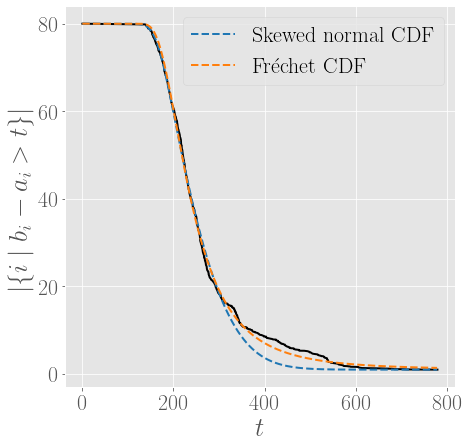

In [2883]:
subject = 75

fig, ax = plt.subplots(1, 1, figsize = (7, 7))
#fig.suptitle('$H_0$', fontsize = 30, y = 1)

fit = params_H0_frechet[subject]
params = fit[0]
x = fit[1]
y = fit[2]
xFit = fit[3]
yFit = fit[4]
error = fit[5]
std = fit[6]

fit2 = params_H0_1skew[subject]
params2 = fit2[0]
x2 = fit2[1]
y2 = fit2[2]
xFit2 = fit2[3]
yFit2 = fit2[4]
error2 = fit2[5]
std2 = fit2[6]

ax.plot(x, y, "-", color = 'k')
ax.plot(xFit2, yFit2, "--", color = 'tab:blue', label = 'Skewed normal CDF')
ax.plot(xFit, yFit, "--", color = 'tab:orange', label = 'Fréchet CDF')

#ax.set_title("Fit error: " + str(round(maxError, 4)))
ax.set_xlabel('$t$')
ax.set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
ax.legend()

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb42_fittingH0_bestWorst_frechet.jpg") #, bbox_inches="tight")
if show:
    plt.show()
plt.close()

## Hierarchical clustering H0 1skew

In [176]:
clusters_subjectIDs = dict()
colors_subjects = dict()
remove_outliers = False

In [177]:
controls = data.train_i_ctr
control_params_H0 = dict()

j = 0
for subject in controls:
    params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds_1skew_H0[comb_id]) 
    error = error / y[0]
    control_params_H0[subject] = (params, x, y, xFit, yFit, error, std)
        
    j += 1

In [178]:
control_params_H0_dict = {}
for subject in controls:
    control_params_H0_dict[subject] = control_params_H0[subject][0]
control_params_H0_df = pd.DataFrame.from_dict(control_params_H0_dict).T
control_params_H0_df['error'] = [control_params_H0[control][5] for control in controls]

In [179]:
params_H0_1skew_dict = {}
for subject in data.train_subjects_noctr:
    params_H0_1skew_dict[subject] = params_H0_1skew[subject][0]
params_H0_1skew_df = pd.DataFrame.from_dict(params_H0_1skew_dict).T
params_H0_1skew_df['error'] = [error for _, error in error_H0_1skew.items()]

params_H0_1skew_df_noOutliers = params_H0_1skew_df.drop(index = [58])
if remove_outliers:
    params_H0_1skew_df = params_H0_1skew_df_noOutliers.copy()

In [180]:
def scale_df(df, df_ctr):
    full_df = pd.concat([df, df_ctr], axis = 0)
    scaler = MinMaxScaler()
    scaler.fit(full_df)
    scaled = scaler.fit_transform(full_df)
    scaled_df = pd.DataFrame(scaled, columns = full_df.columns, index = full_df.index)
    scaled_noCtr_df = scaled_df.drop(controls, axis = 0)
    scaled_ctr_df = scaled_df.loc[controls]
    return scaled_noCtr_df, scaled_ctr_df

temp = params_H0_1skew_df.copy()
temp['error'] = params_H0_1skew_df['error'].abs()
temp_scaled, control_params_H0_df_scaled = scale_df(temp, control_params_H0_df)
for i in params_H0_1skew_df.index:
    if params_H0_1skew_df.loc[i]['error'] < 0:
        temp_scaled.loc[i]['error'] = - temp_scaled.loc[i]['error']
temp_scaled['error'] = temp_scaled['error'] / 2

params_H0_1skew_df_scaled = temp_scaled.copy()
params_H0_1skew_df_scaled.head()

temp = params_H0_1skew_df_noOutliers.copy()
temp['error'] = params_H0_1skew_df_noOutliers['error'].abs()
temp_scaled, control_params_H0_df_noOutliers_scaled = scale_df(temp, control_params_H0_df)
for i in params_H0_1skew_df_noOutliers.index:
    if params_H0_1skew_df_noOutliers.loc[i]['error'] < 0:
        temp_scaled.loc[i]['error'] = - temp_scaled.loc[i]['error']
temp_scaled['error'] = temp_scaled['error'] / 2

params_H0_1skew_df_noOutliers_scaled = temp_scaled.copy()
params_H0_1skew_df_noOutliers_scaled.head()

,0,1,2,error
18,0.014246,0.673669,1.000000,0.229537
21,0.000220,0.103593,0.018627,-0.305841
22,0.088781,0.143403,0.078414,-0.381265
23,0.065412,0.298010,0.135739,-0.252692
24,1.000000,0.000000,0.075720,-0.364668


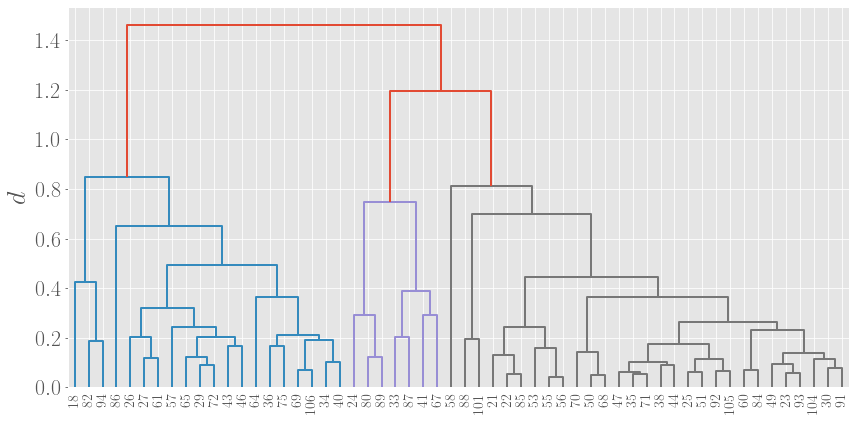

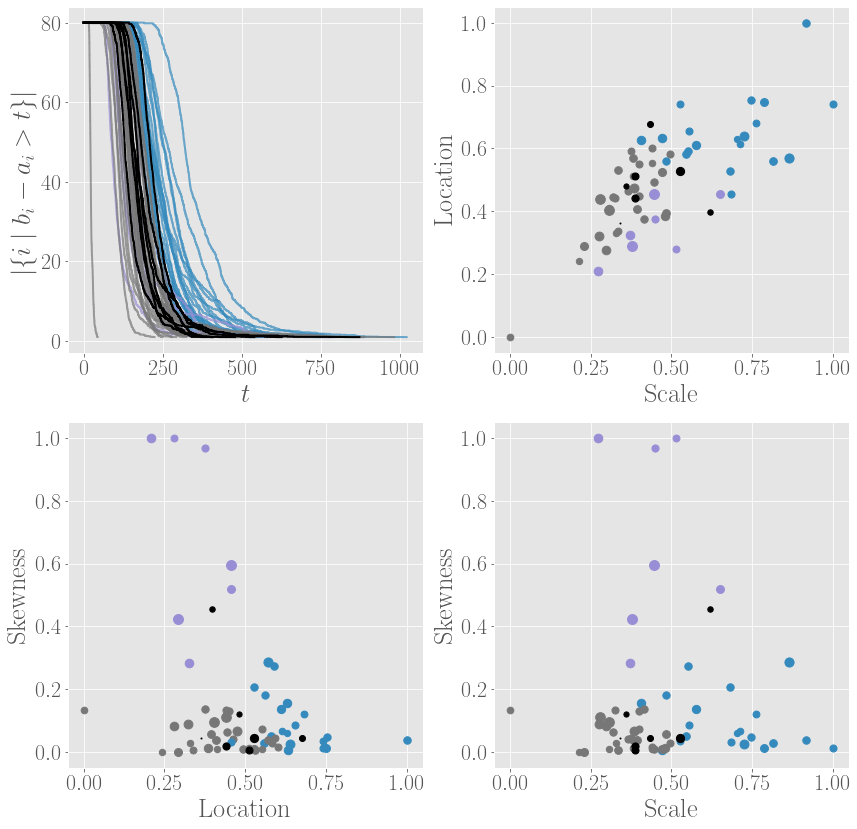

In [181]:
subjects = params_H0_1skew_df_scaled.index.values

feature_matrix = params_H0_1skew_df_scaled #features for clustering
params_df = params_H0_1skew_df_scaled #parameters for scatter plotting

cluster_mode = "complete"
fn = "H0_1skew_4features_"+cluster_mode
labels = ["Skewness", "Location", "Scale"]

color_threshold = 1.1
t = 4

control_params = control_params_H0_df_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_2by2(subjects, hsrs_H0, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeFactor = [4, 4, 4])

In [182]:
save = False

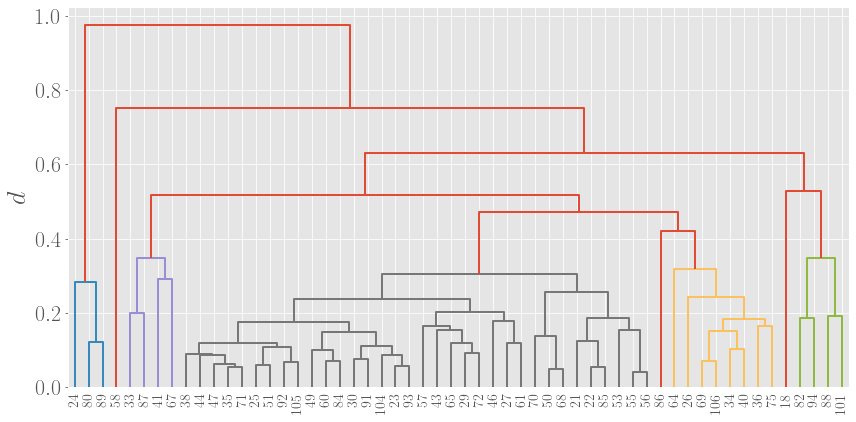

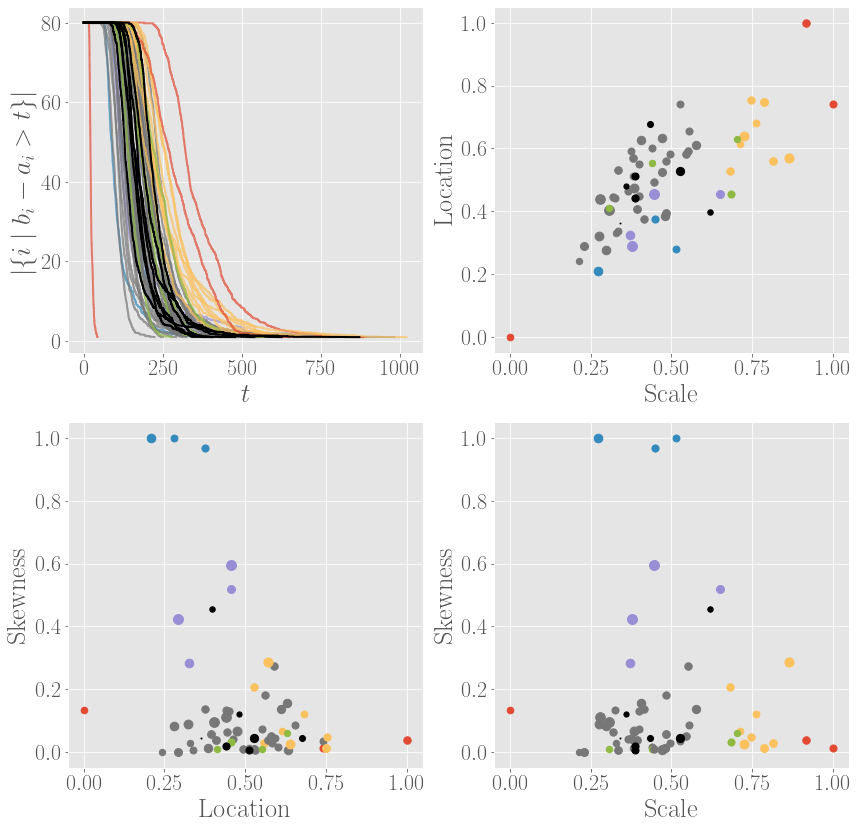

In [183]:
subjects = params_H0_1skew_df_scaled.index.values

feature_matrix = params_H0_1skew_df_scaled #features for clustering
params_df = params_H0_1skew_df_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = "H0_1skew_4features_"+cluster_mode
labels = ["Skewness", "Location", "Scale"]

color_threshold = 0.38
t = 9

control_params = control_params_H0_df_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_2by2(subjects, hsrs_H0, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeFactor = [4, 4, 4])

In [184]:
interesting_fns = []
interesting_fns.append(fn)

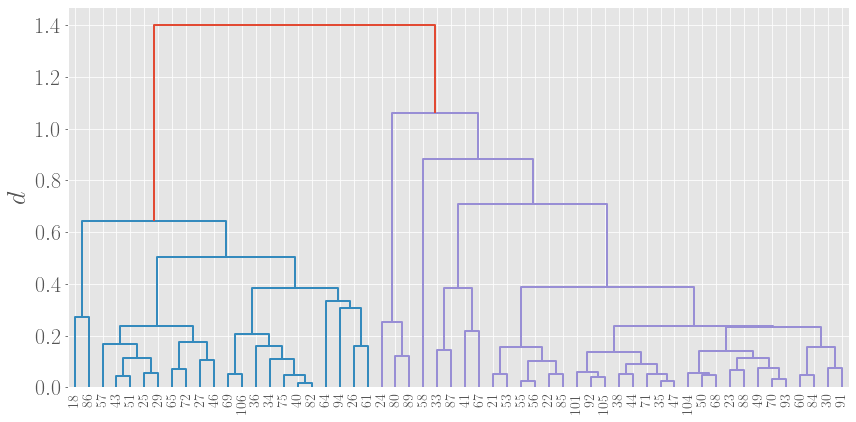

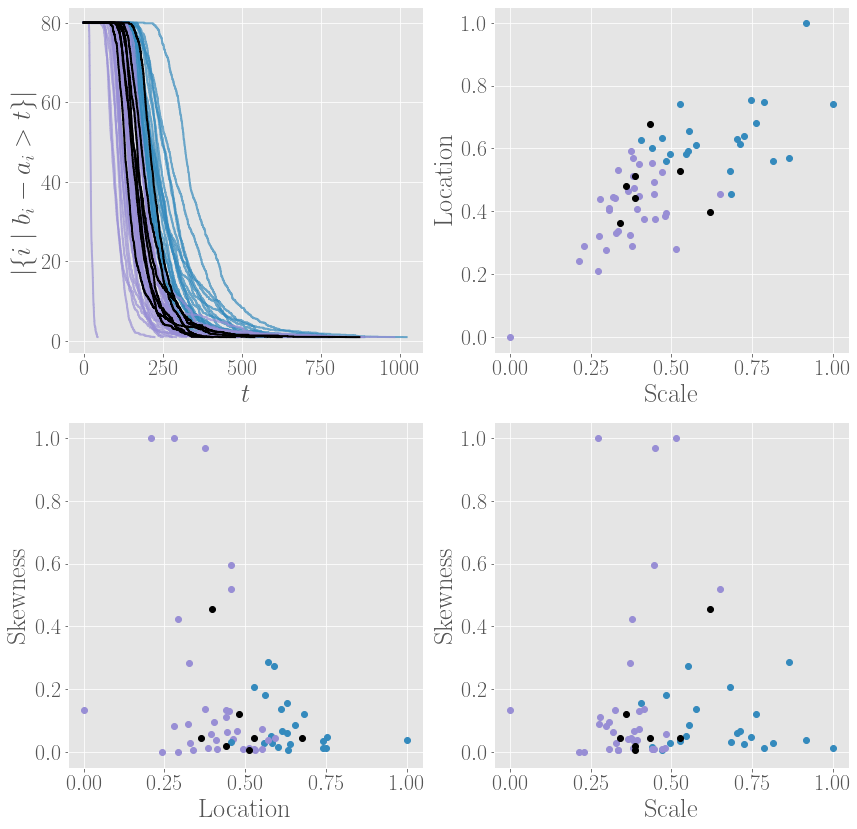

In [185]:
subjects = params_H0_1skew_df_scaled.index.values

feature_matrix = params_H0_1skew_df_scaled[[0, 1, 2]] #features for clustering
params_df = params_H0_1skew_df_scaled #parameters for scatter plotting

cluster_mode = "complete"
fn = "H0_1skew_3features_"+cluster_mode
labels = ["Skewness", "Location", "Scale"]

color_threshold = 1.2
t = 4

control_params = control_params_H0_df_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_2by2(subjects, hsrs_H0, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeEncoding = None)

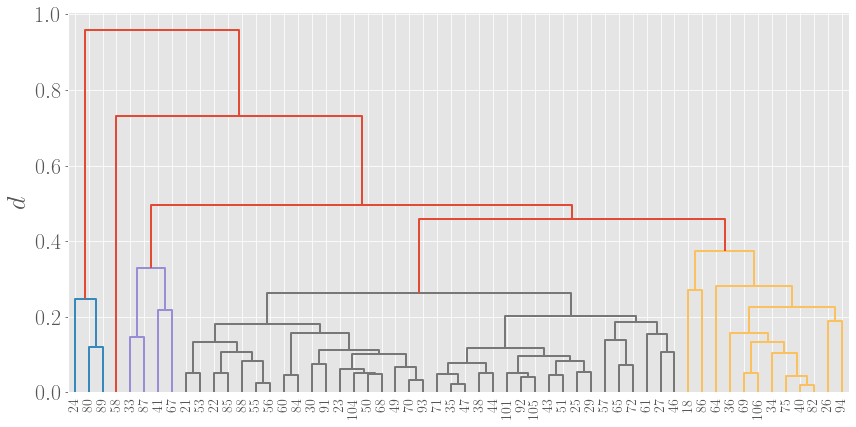

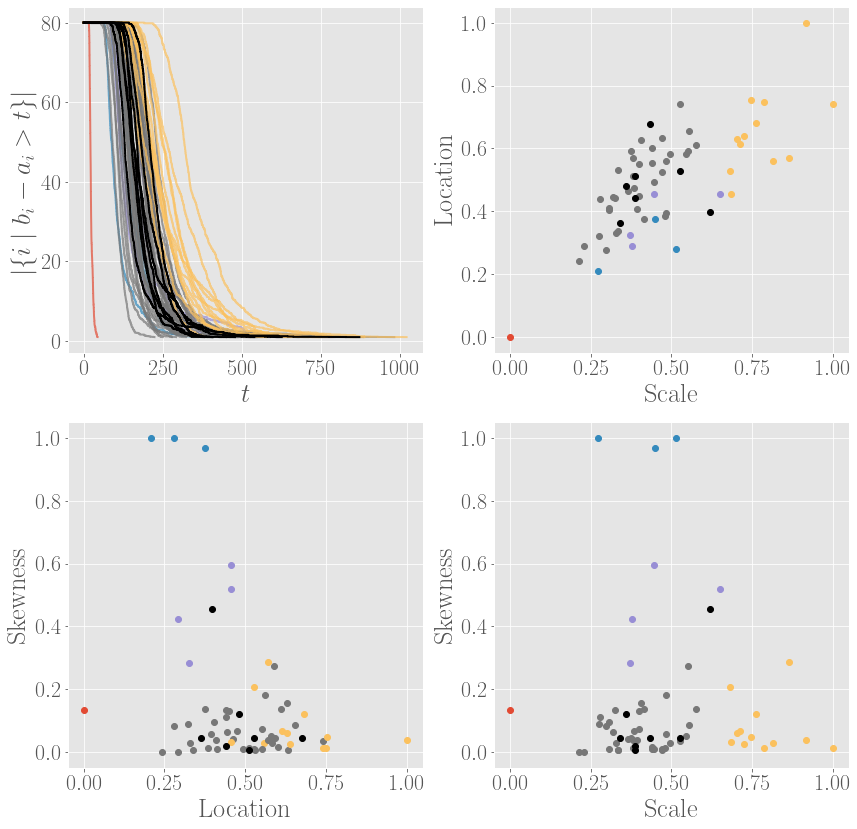

In [190]:
subjects = params_H0_1skew_df_scaled.index.values

feature_matrix = params_H0_1skew_df_scaled[[0, 1, 2]] #features for clustering
params_df = params_H0_1skew_df_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = "H0_1skew_3features_"+cluster_mode
labels = ["Skewness", "Location", "Scale"]

color_threshold = 0.38
t = 7

control_params = control_params_H0_df_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_2by2(subjects, hsrs_H0, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeEncoding = None)

In [187]:
save = True
test = True

In [118]:
interesting_fns.append(fn)

## H1 Exponential

In [2504]:
params_H1_exponential = dict()

j = 0
for subject in tqdm(data.train_subjects_noctr):
    params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds = bounds_exponential_H1[comb_id])   
    error = error / y[0]
    params_H1_exponential[subject] = (params, x, y, xFit, yFit, error, std)
        
    j += 1

100%|█████████████████████████████████████████████████████████████████████████████████| 56/56 [00:00<00:00, 118.39it/s]


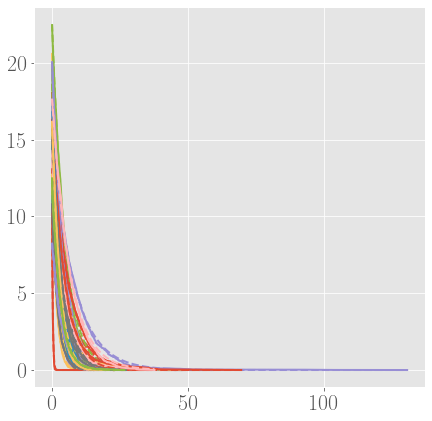

In [2505]:
j = 0
error_H1_exponential = {}

for subject in params_H1_exponential.keys():
    if j % 100 == 0:
        plt.figure()
    
    fit = params_H1_exponential[subject]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    error_H1_exponential[subject] = error
    
    plt.plot(x, y, "-", color = 'C'+str(j), label = str(subject) + "; error: " + str(round(error, 2)))
    plt.plot(xFit, yFit, "--", color = 'C'+str(j))
    
    #plt.legend()
        
    j += 1

In [2506]:
controls = data.train_i_ctr
control_params_H1 = dict()

j = 0
for subject in controls:
    params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds_exponential_H1[comb_id])  
    error = error / y[0]
    control_params_H1[subject] = (params, x, y, xFit, yFit, error, std)
        
    j += 1

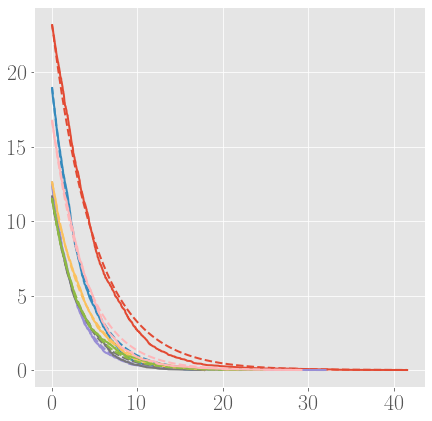

In [2507]:
j = 0

for subject in control_params_H1.keys():
    if j % 100 == 0:
        plt.figure()
    
    fit = control_params_H1[subject]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    
    plt.plot(x, y, "-", color = 'C'+str(j), label = str(subject) + "; error: " + str(round(error, 2)))
    plt.plot(xFit, yFit, "--", color = 'C'+str(j))
    
    #plt.legend()
        
    j += 1

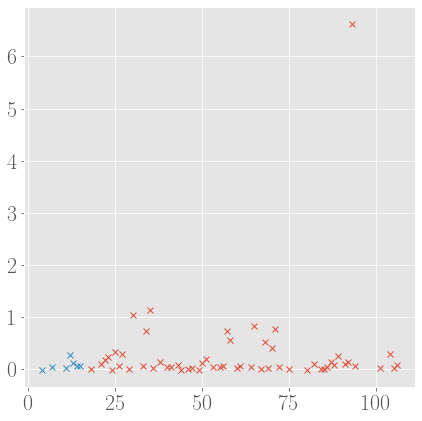

In [2461]:
plt.plot(params_H1_exponential_df.index, params_H1_exponential_df['error'], 'x')
plt.plot(control_params_H1_df.index, control_params_H1_df['error'], 'x')

In [2462]:
control_params_H1_dict = {}
for subject in controls:
    control_params_H1_dict[subject] = control_params_H1[subject][0]
control_params_H1_df = pd.DataFrame.from_dict(control_params_H1_dict).T
control_params_H1_df['error'] = [control_params_H1[control][5] for control in controls]

In [2463]:
params_H1_exponential_dict = {}
for subject in data.train_subjects_noctr:
    params_H1_exponential_dict[subject] = params_H1_exponential[subject][0]
params_H1_exponential_df = pd.DataFrame.from_dict(params_H1_exponential_dict).T
params_H1_exponential_df['error'] = [error for _, error in error_H1_exponential.items()]
params_H1_exponential_df.head()

params_H1_exponential_df_noOutliers = params_H1_exponential_df.drop(index = [58])

In [2464]:
temp = params_H1_exponential_df.copy()
temp['error'] = params_H1_exponential_df['error'].abs()
temp_scaled, control_params_H1_df_scaled = scale_df(temp, control_params_H1_df)
for i in params_H1_exponential_df.index:
    if params_H1_exponential_df.loc[i]['error'] < 0:
        temp_scaled.loc[i]['error'] = - temp_scaled.loc[i]['error']
temp_scaled['error'] = temp_scaled['error'] / 2

params_H1_exponential_df_scaled = temp_scaled.copy()

temp = params_H1_exponential_df_noOutliers.copy()
temp['error'] = params_H1_exponential_df_noOutliers['error'].abs()
temp2 = control_params_H1_df.copy()
temp2['error'] = control_params_H1_df['error'].abs()
temp_scaled, temp2_scaled = scale_df(temp, temp2)
for i in params_H1_exponential_df_noOutliers.index:
    if params_H1_exponential_df_noOutliers.loc[i]['error'] < 0:
        temp_scaled.loc[i]['error'] = - temp_scaled.loc[i]['error']
for i in control_params_H1_df.index:
    if control_params_H1_df.loc[i]['error'] < 0:
        temp2_scaled.loc[i]['error'] = - temp2_scaled.loc[i]['error']   
temp_scaled['error'] = temp_scaled['error'] / 2
temp2_scaled['error'] = temp2_scaled['error'] / 2

control_params_H1_df_noOutliers_scaled = temp2_scaled.copy()
params_H1_exponential_df_noOutliers_scaled = temp_scaled.copy()

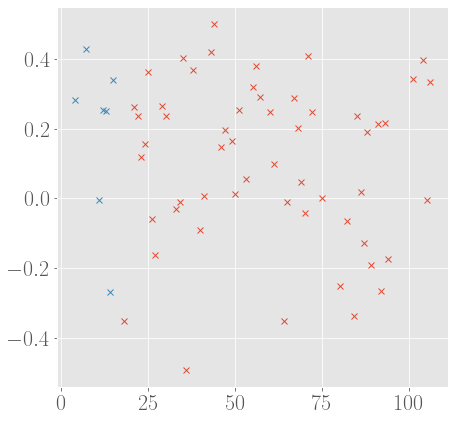

In [2465]:
plt.plot(params_H1_exponential_df_noOutliers_scaled.index, params_H1_exponential_df_noOutliers_scaled['error'], 'x')
plt.plot(control_params_H1_df_noOutliers_scaled.index, control_params_H1_df_noOutliers_scaled['error'], 'x')

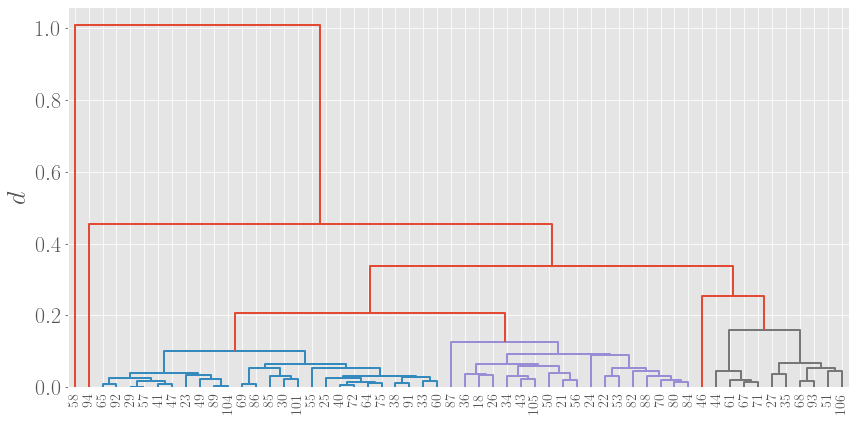

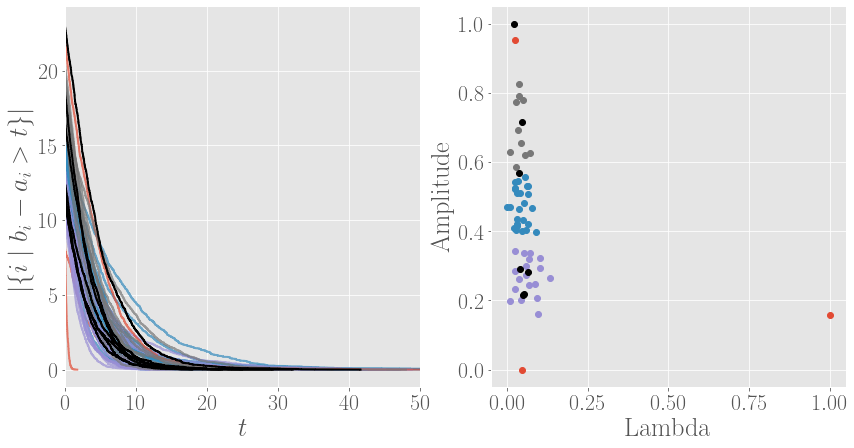

In [2508]:
subjects = params_H1_exponential_df_scaled.index.values

feature_matrix = params_H1_exponential_df_scaled[[0,1]] #features for clustering
params_df = params_H1_exponential_df_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = "H1_exponential_2features_"+cluster_mode
labels = ["Lambda", "Amplitude"]

color_threshold = 0.2
t = 4

control_params = control_params_H1_df_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_1by1(subjects, hsrs_H1, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeEncoding = None)

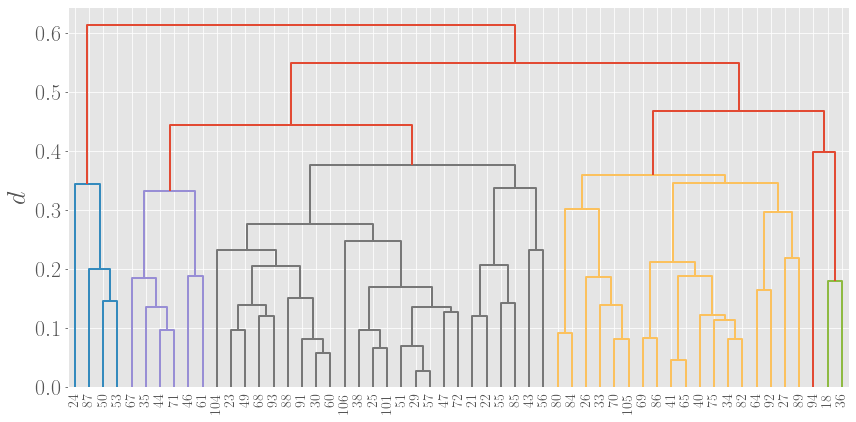

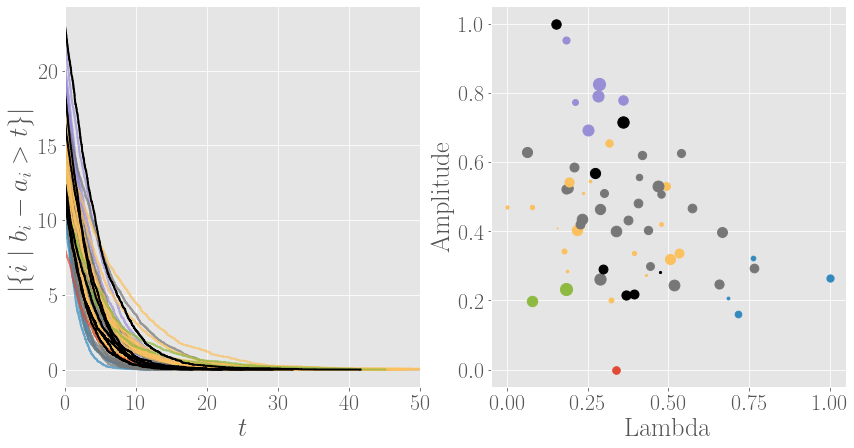

In [2933]:
subjects = params_H1_exponential_df_noOutliers_scaled.index.values

feature_matrix = params_H1_exponential_df_noOutliers_scaled #features for clustering
params_df = params_H1_exponential_df_noOutliers_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = "H1_exponential_3features_"+cluster_mode+"_noOutliers"
labels = ["Lambda", "Amplitude"]

color_threshold = 0.38
t = 4

control_params = control_params_H1_df_noOutliers_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_1by1(subjects, hsrs_H1, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params)

In [2934]:
interesting_fns.append(fn)

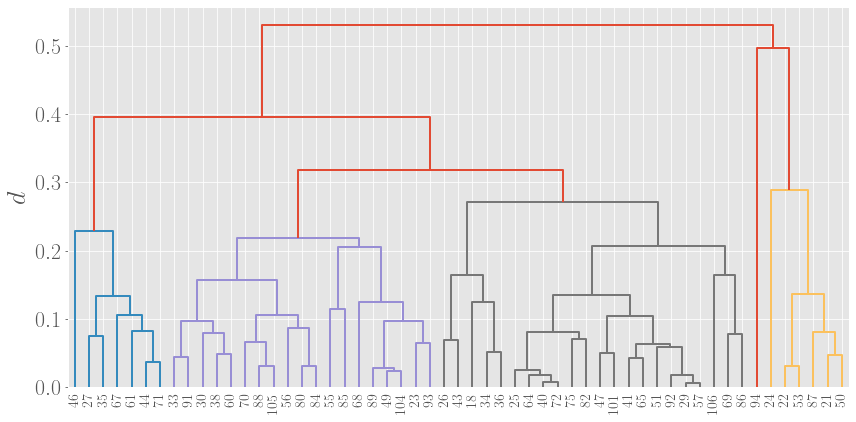

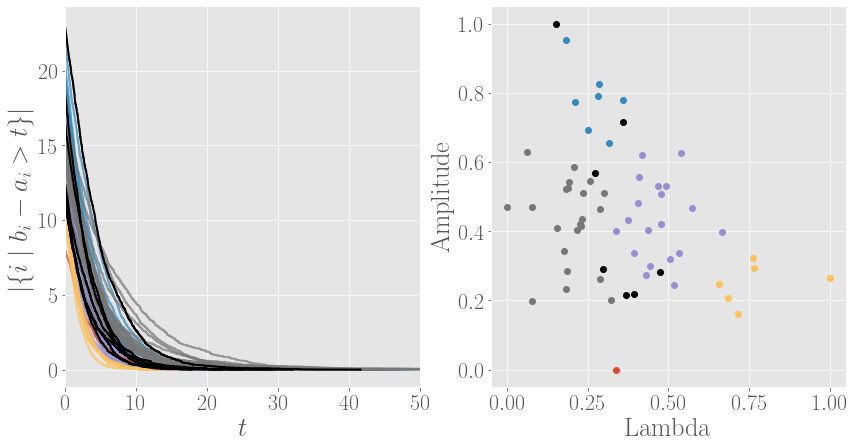

In [2935]:
subjects = params_H1_exponential_df_noOutliers_scaled.index.values

feature_matrix = params_H1_exponential_df_noOutliers_scaled[[0,1]] #features for clustering
params_df = params_H1_exponential_df_noOutliers_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = "H1_exponential_2features_"+cluster_mode+"_noOutliers"
labels = ["Lambda", "Amplitude"]

color_threshold = 0.3
t = 4

control_params = control_params_H1_df_noOutliers_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_1by1(subjects, hsrs_H1, feature_matrix, params_df, labels, 
                                                                                    fn, cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeEncoding = None)

In [2936]:
interesting_fns.append(fn)

## Combine H1 and H0

In [2515]:
def hierarchical_clustering_H0H1(subjects, feature_matrix, fn, cluster_mode, color_threshold, t): 
    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    
    clusters = hierarchy.linkage(feature_matrix, method = cluster_mode)
    R = hierarchy.dendrogram(clusters, ax=ax[0], orientation="top", leaf_font_size=0, leaf_rotation=90, color_threshold = color_threshold, labels = subjects)
    cluster_labels = hierarchy.fcluster(clusters, t = t, criterion="maxclust")
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_dendogram.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()
    
    fig, ax = plt.subplots(2, 2, figsize = (14, 14))
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.2)
    
    j = 0
    colors_subjects = {}
    for subject in R['ivl']:
        hsr_H0 = hsrs_H0[subject]
        hsr_H1 = hsrs_H1[subject]
        colors_subjects[subject] = R['leaves_color_list'][j]
        hsr_H0.plot(ax = ax[1], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        hsr_H1.plot(ax = ax[2], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        j += 1

    ax[0].set_ylabel('$t$')
    ax[1].set_ylabel('dim$(H_0)$')
    ax[2].set_ylabel('dim$(H_1)$')
    ax[1].set_xlabel('$t$')
    ax[2].set_xlabel('$t$')   
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+".jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

    clusters_subjectIDs = dict()
    for label in list(set(cluster_labels)):
        temp = []
        for j in [i for i, val in enumerate(cluster_labels == label) if val]:
            temp.append(data.train_subjects_noctr[j])
        clusters_subjectIDs[label] = temp

    return clusters_subjectIDs, colors_subjects

In [2516]:
def hierarchical_clustering_plotAll(subjects, feature_matrix, params_df, params_df2, labels, label2, controls, control_params, control_params2, fn, cluster_mode, 
                                    color_threshold, t, sizeFactor = [3, 3, 3], sizeEncoding = 'error'): 
    fig, ax = plt.subplots(1, 1, figsize=(14, 7))
    
    clusters = hierarchy.linkage(feature_matrix, method = cluster_mode)
    R = hierarchy.dendrogram(clusters, ax=ax, orientation="top", leaf_font_size=14, leaf_rotation=90, color_threshold = color_threshold, labels = subjects)
    cluster_labels = hierarchy.fcluster(clusters, t = t, criterion="maxclust")
    ax.set_ylabel('$t$')
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_dendogram.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()
    
    fig, ax = plt.subplots(2, 2, figsize = (14, 14))
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.2)
    
    j = 0
    colors_subjects = {}
    for subject in R['ivl']:
        hsr = hsrs_H0[subject]
        colors_subjects[subject] = R['leaves_color_list'][j]
        hsr.plot(ax = ax[0, 0], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        j += 1

    
    ax[0, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[0, 0].set_xlabel('$t$')
    ax[0, 0].set_title('$H_0$')

    for subject in params_df.index:
        x = params_df[2][subject]
        y = params_df[0][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df['error'][subject] * 10)) * sizeFactor[2] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(params_df[1][subject] * 10) * sizeFactor[2] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[0, 1].plot(x, y, 'o', color = c, ms = s)

    ax[0, 1].set_xlabel(labels[2])
    ax[0, 1].set_ylabel(labels[0])

    ax[0, 1].set_xlim(-0.05, 1.05)
    ax[0, 1].set_ylim(-0.05, 1.05)    
    
    j = 0
    colors_subjects = {}
    for subject in R['ivl']:
        hsr = hsrs_H1[subject]
        colors_subjects[subject] = R['leaves_color_list'][j]
        hsr.plot(ax = ax[1, 0], color = colors_subjects[subject], alpha = 0.7, label = str(subject))
        j += 1

    ax[1, 0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[1, 0].set_xlabel('$t$')
    ax[1, 0].set_xlim(0, 50)
    ax[1, 0].set_title('$H_1$')
    
    for subject in params_df.index:
        x = params_df2[0][subject]
        y = params_df2[1][subject]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(params_df2['error'][subject] * 10)) * sizeFactor[0] + 1
        else:
            s = 6
        c = colors_subjects[subject]
        ax[1, 1].plot(x, y, 'o', color = c, ms = s)
    ax[1, 1].set_xlabel(labels2[0])
    ax[1, 1].set_ylabel(labels2[1])

    ax[1, 1].set_xlim(-0.05, 1.05)
    ax[1, 1].set_ylim(-0.05, 1.05)

    
    for control in controls:
        hsrs_H0[control].plot(ax = ax[0, 0], color = 'k')
        hsrs_H1[control].plot(ax = ax[1, 0], color = 'k')
        
        x = control_params[2][control]
        y = control_params[0][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[0] + 1
        elif sizeEncoding == '3thParam':
            s = math.sqrt(control_params[1][control] * 10) * sizeFactor[0] + 1
        else:
            s = 6
        ax[0, 1].plot(x, y, 'o', color = 'k', ms = s)
        
        x = control_params2[0][control]
        y = control_params2[1][control]
        if sizeEncoding == 'error':
            s = math.sqrt(abs(control_params['error'][control] * 10)) * sizeFactor[0] + 1
        else:
            s = 6
        ax[1, 1].plot(x, y, 'o', color = 'k', ms = s)
    
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_scatterAndHSRs.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

    clusters_subjectIDs = dict()
    for label in list(set(cluster_labels)):
        temp = []
        for j in [i for i, val in enumerate(cluster_labels == label) if val]:
            temp.append(data.train_subjects_noctr[j])
        clusters_subjectIDs[label] = temp

    return clusters_subjectIDs, colors_subjects

In [2517]:
def scale_df(df):
    scaler = MinMaxScaler()
    scaler.fit(df)
    scaled = scaler.fit_transform(df)
    return pd.DataFrame(scaled, columns = df.columns, index = df.index)

params = pd.concat([params_H0_1skew_df[[0, 1, 2]], params_H1_exponential_df[[0, 1]]], axis = 1)
params_scaled = pd.concat([params_H0_1skew_df_scaled[[0, 1, 2]], params_H1_exponential_df_scaled[[0, 1]]], axis = 1)
params_noOutliers = params.drop(index = [58])
params_scaled_noOutliers = scale_df(params_noOutliers)
params_scaled = params_scaled_noOutliers.copy()
params_scaled.head()

,0,1,2,0,1
18,0.008784,0.684280,1.000000,0.077245,0.207993
21,0.000000,0.104881,0.018679,0.657916,0.258790
22,0.084299,0.143995,0.085111,0.765922,0.308017
23,0.066343,0.304131,0.135385,0.408287,0.584037
24,1.000000,0.000000,0.086421,1.000000,0.276723


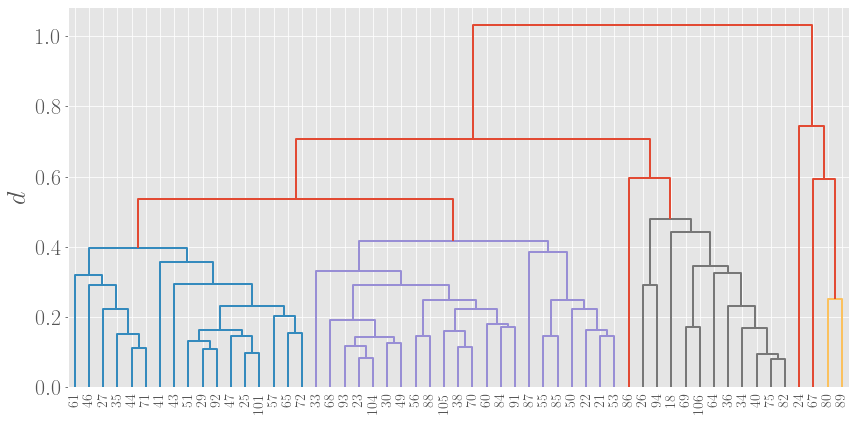

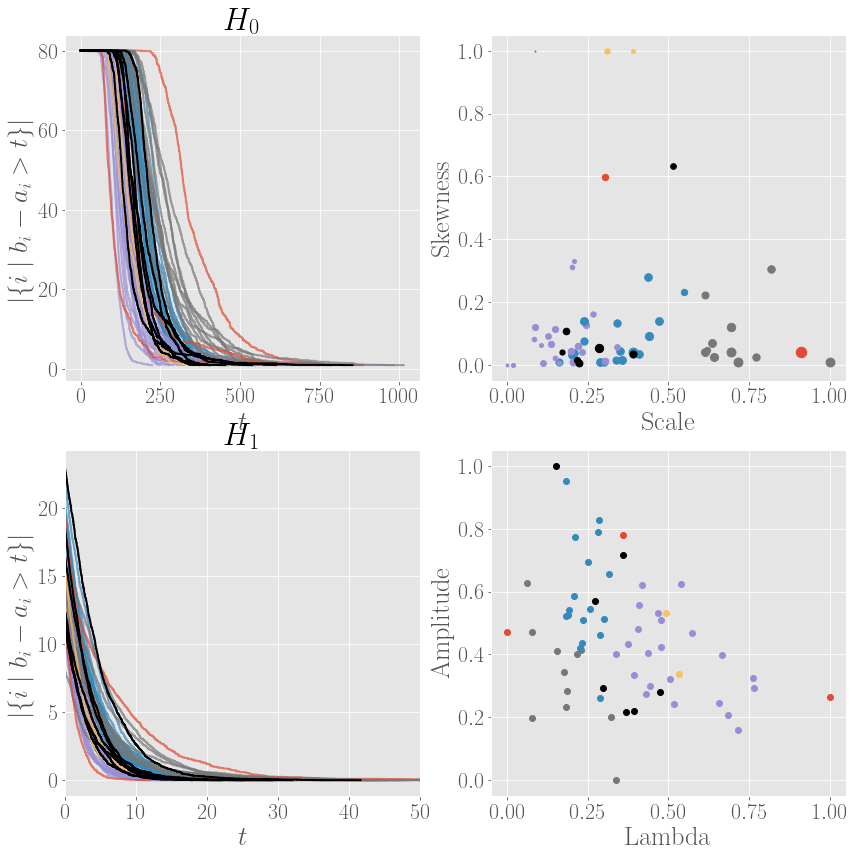

In [2937]:
params_df = params_H0_1skew_df_noOutliers_scaled 
params_df2 = params_H1_exponential_df_noOutliers_scaled
labels = ["Skewness", "Location", "Scale"]
labels2 = ["Lambda", "Amplitude"] 

subjects = params_scaled.index.values
feature_matrix = params_scaled
cluster_mode = "average"
fn = "H0H1_5features_"+cluster_mode
color_threshold = 0.5
t = 4

control_params = control_params_H0_df_noOutliers_scaled
control_params2 = control_params_H1_df_noOutliers_scaled

clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll(subjects, feature_matrix, params_df, params_df2, labels, labels2, 
                                                                               controls, control_params, control_params2, fn, cluster_mode, color_threshold, 
                                                                               t, sizeEncoding='3thParam')

In [2938]:
interesting_fns.append(fn)

## Compare fitted and non fitted clusterings

C:\Users\naomi\AppData\Local\Miniconda3\envs\thesis\lib\site-packages\ipykernel_launcher.py:5: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  """


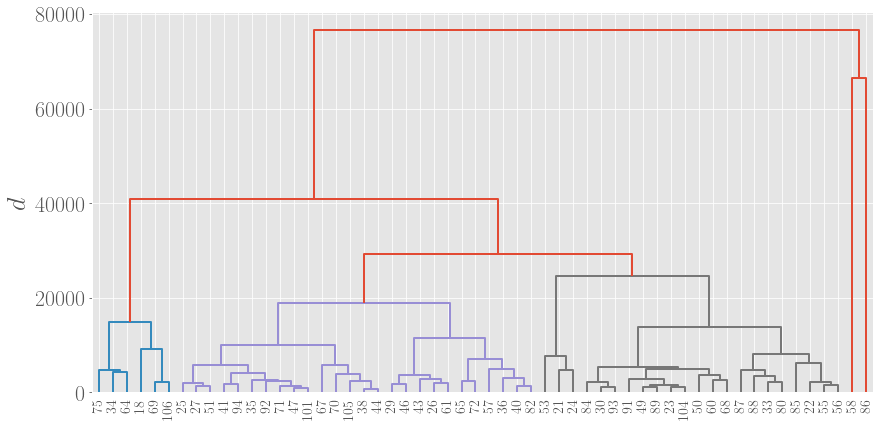

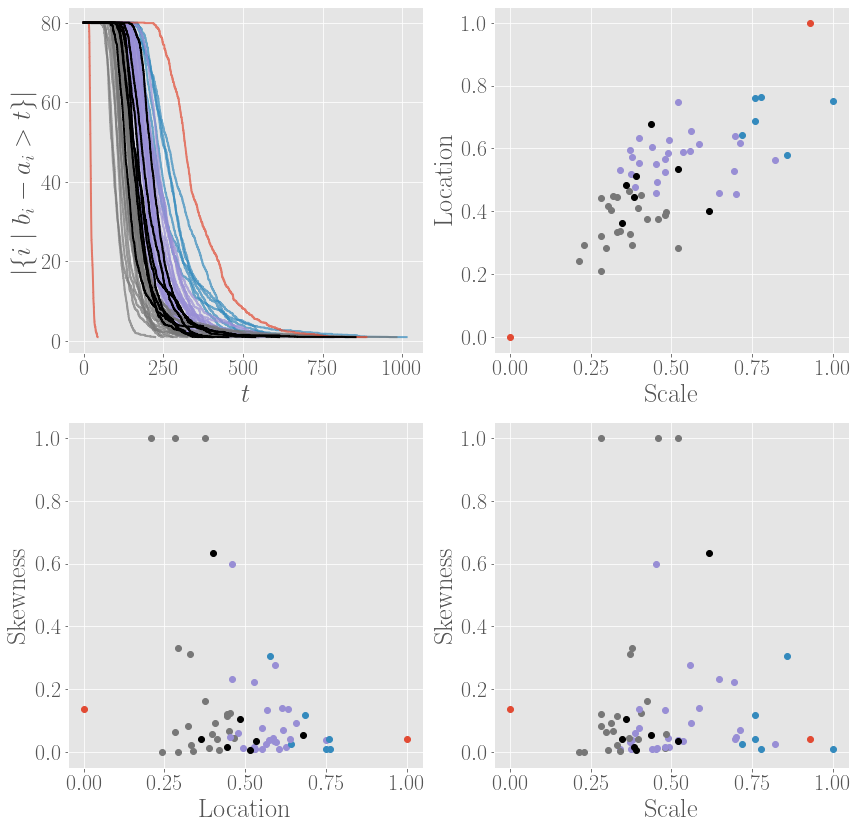

In [2525]:
subjects = params_H0_1skew_df_scaled.index.values

feature_matrix = get_features(hsrs = hsrs_H0, mode = "distances") #features for clustering
params_df = params_H0_1skew_df_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = mode+"_"+cluster_mode+"_H0"
labels = ["Skewness", "Location", "Scale"]

color_threshold = 25000
t = 4


control_params = control_params_H0_df_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_2by2(subjects, hsrs_H0, feature_matrix, params_df, labels, fn, 
                                                                                    cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeEncoding = None)

C:\Users\naomi\AppData\Local\Miniconda3\envs\thesis\lib\site-packages\ipykernel_launcher.py:143: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


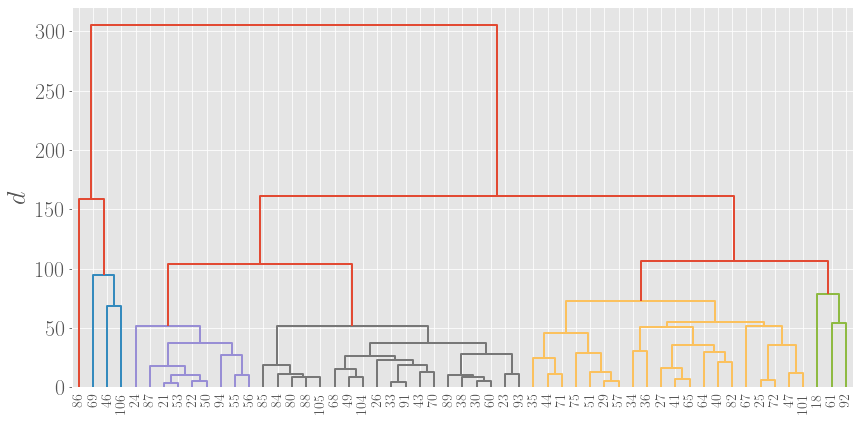

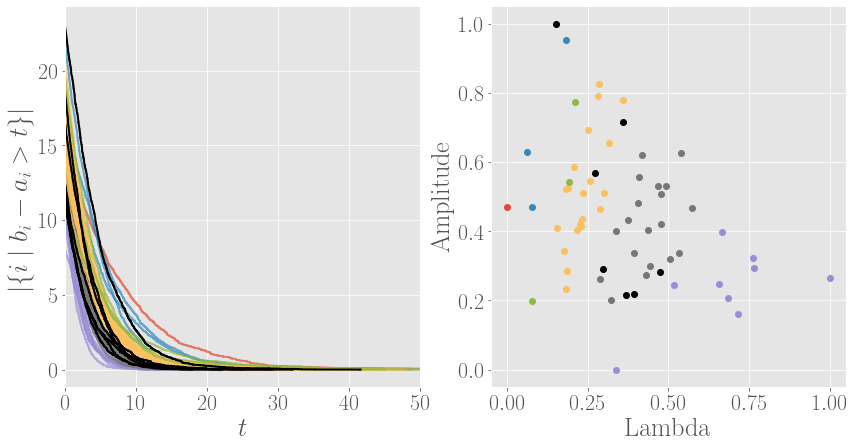

In [2526]:
subjects = params_H1_exponential_df_noOutliers_scaled.index.values
#subjects = np.array(set(subjects).difference(set([58])))

#temp = hsrs_H1.copy()
#temp.pop(58)
feature_matrix = get_features(hsrs = hsrs_H1, mode = "distances") #features for clustering
feature_matrix = feature_matrix.drop(58, axis = 0).drop(58, axis = 1)

params_df = params_H1_exponential_df_noOutliers_scaled #parameters for scatter plotting

cluster_mode = "average"
fn = mode+"_"+cluster_mode+"_H1"
labels = ["Lambda", "Amplitude"]

color_threshold = 100
t = 4

control_params = control_params_H1_df_noOutliers_scaled
clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering_plotAll_1by1(subjects, hsrs_H1, feature_matrix, params_df, labels, fn, 
                                                                                    cluster_mode, color_threshold, t, controls, control_params, 
                                                                                    sizeEncoding = None)

## Validate distributions on other combs

### H0

In [2200]:
params_H0_allCombs = dict()
params_H1_allCombs = dict()

for comb_id in [0, 7, 14, 21, 28, 35, 42]: #prePHparam.index:
    comb = prePHparam.loc[comb_id]
    hsrs_H0 = hsrs[comb_id]["H0_single"]
    hsrs_H1 = hsrs[comb_id]["H1"]
    
    params_H0_allCombs[comb_id] = dict()
    params_H1_allCombs[comb_id] = dict()

    j = 0
    for subject in tqdm(data.train_subjects_noctr):
        params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds = bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs_H0)   
        error = error/y[0]
        params_H0_allCombs[comb_id][subject] = (params, x, y, xFit, yFit, error, std)
        
        params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds = bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs_H1)   
        error = error/y[0]
        params_H1_allCombs[comb_id][subject] = (params, x, y, xFit, yFit, error, std)
        j += 1

100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [00:02<00:00, 25.69it/s]


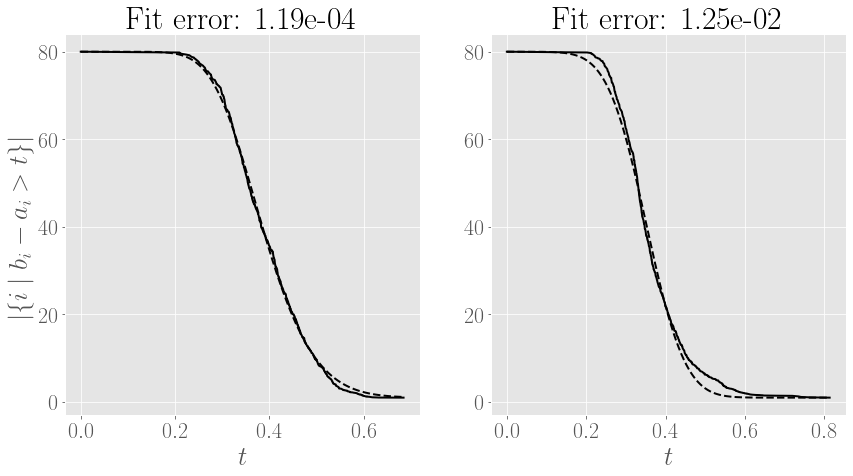

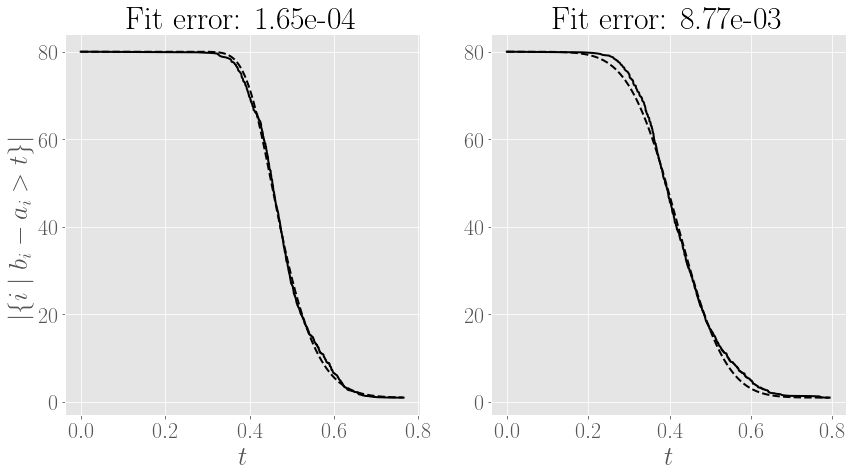

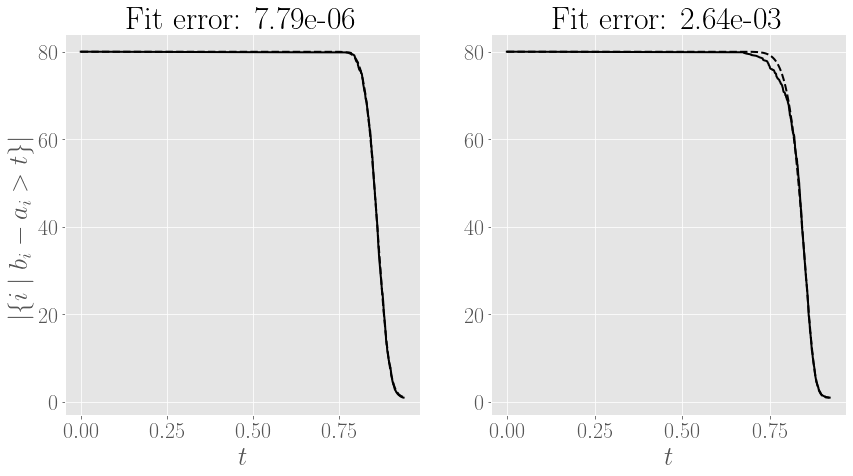

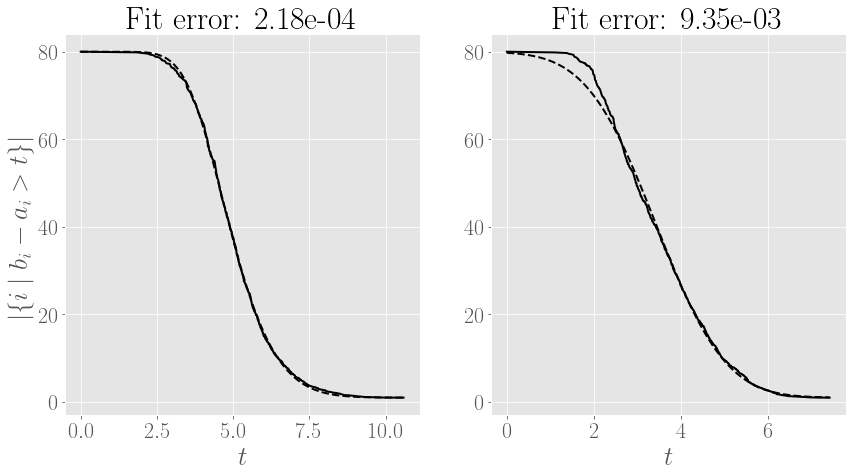

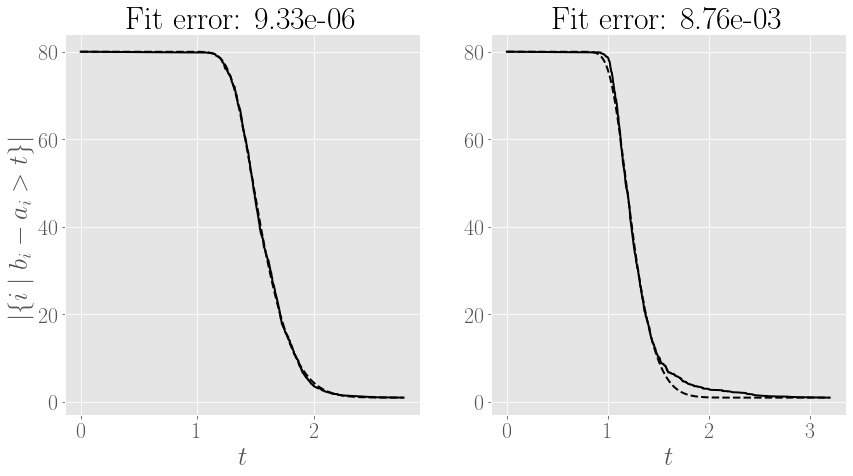

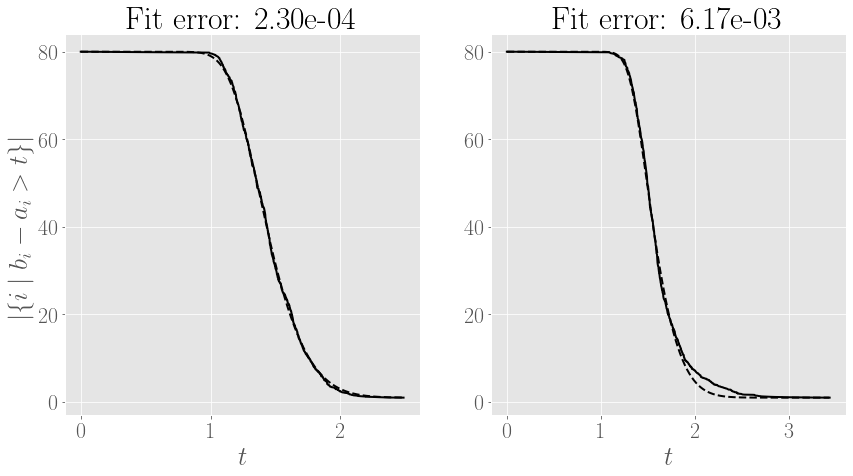

88
87


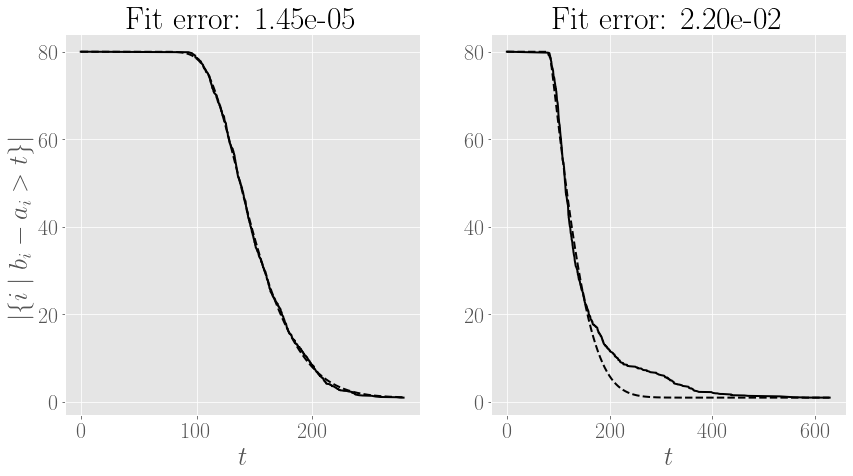

In [2211]:
minError_dict = dict()
maxError_dict = dict()
minError_id_dict = dict()
maxError_id_dict = dict()
allErrors_dict_H0 = dict()

errorMeasure = 'error'

for comb_id in [0, 7, 14, 21, 28, 35, 42]: #prePHparam.index:
    minError = 10000
    maxError = 0
    maxError_id = None
    minError_id = None
    for subject in subjects:
        if subject == 58:
            continue
        if errorMeasure == 'error':
            if abs(params_H0_allCombs[comb_id][subject][5]) > maxError:
                maxError = abs(params_H0_allCombs[comb_id][subject][5])
                maxError_id = subject
            if abs(params_H0_allCombs[comb_id][subject][5]) < minError:
                minError = abs(params_H0_allCombs[comb_id][subject][5])
                minError_id = subject
        else:
            if sum(abs(params_H0_allCombs[comb_id][subject][6])) > maxError:
                maxError = sum(abs(params_H0_allCombs[comb_id][subject][6]))
                maxError_id = subject
            if sum(abs(params_H0_allCombs[comb_id][subject][6])) < minError:
                minError = sum(abs(params_H0_allCombs[comb_id][subject][6]))
                minError_id = subject
            
    fig, ax = plt.subplots(1, 2, figsize = (14, 7))
    #plt.subplots_adjust(wspace=0.2)
    #fig.suptitle('$H_0$', fontsize = 30, y = 1)
    
    fit = params_H0_allCombs[comb_id][minError_id]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    ax[0].plot(x, y, "-", color = 'k', label = 'subject '+str(minError_id))
    ax[0].plot(xFit, yFit, "--", color = 'k', label = 'fit')
    ax[0].set_title("Fit error: " + str("{:.2e}".format(minError)))
    
    fit = params_H0_allCombs[comb_id][maxError_id]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    ax[1].plot(x, y, "-", color = 'k', label = 'sr subject '+str(maxError_id))
    ax[1].plot(xFit, yFit, "--", color = 'k')
    ax[1].set_title("Fit error: " + str("{:.2e}".format(maxError)))
    #ax[1].set_yticklabels([])
    
    minError_dict[comb_id] = minError
    maxError_dict[comb_id] = maxError
    minError_id_dict[comb_id] = minError_id
    maxError_id_dict[comb_id] = maxError_id
    
    ax[0].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[1].set_xlabel('$t$')
    #ax[0].legend()
    #ax[1].legend()
    
    if comb_id == 42:
        print(minError_id)
        print(maxError_id)
    
    if errorMeasure == 'error':
        allErrors_dict_H0[comb_id] = [params_H0_allCombs[comb_id][subject][5] for subject in subjects if subject != 58]
    else:
        allErrors_dict_H0[comb_id] = [sum(abs(params_H0_allCombs[comb_id][subject][6])) for subject in subjects if subject != 58]
        
    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_fittingH0_bestWorst.jpg") #, bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

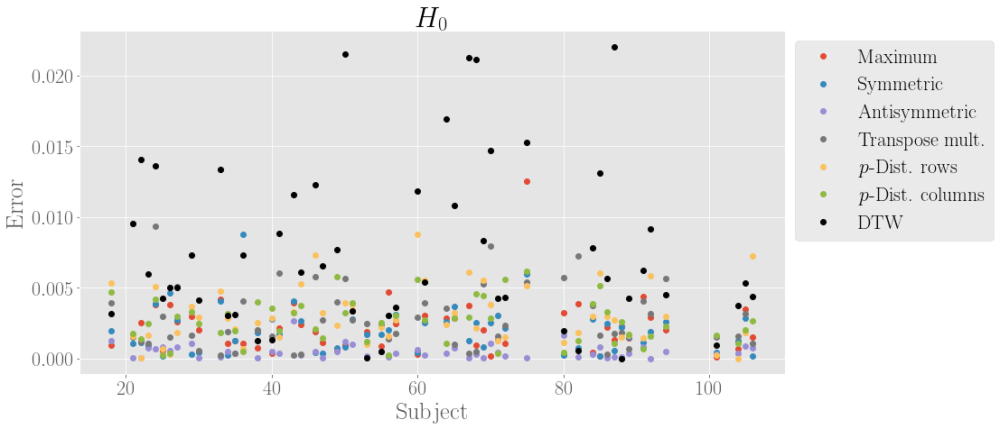

In [2212]:
plt.figure(figsize = (14, 7))
for comb_id in [0, 7, 14, 21, 28, 35, 42]: #prePHparam.index:
    if comb_id == 42:
        plt.plot(np.array([subject for subject in subjects if subject != 58]) + 0*np.random.rand(), 
                          np.abs(allErrors_dict_H0[comb_id]), 'o', color = 'k') #, label = comb_id)s
    else: 
        plt.plot(np.array([subject for subject in subjects if subject != 58]) + 0*np.random.rand(), 
                 np.abs(allErrors_dict_H0[comb_id]), 'o') #, label = comb_id)
plt.legend(['Maximum', 'Symmetric', 'Antisymmetric', 'Transpose mult.', '$p$-Dist. rows', '$p$-Dist. columns', 'DTW'], bbox_to_anchor=(1,1))
plt.xlabel('Subject')
plt.ylabel('Error')
plt.title('$H_0$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_fittingH0_errorOverview.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [2203]:
comb_id = 42
comb = prePHparam.loc[comb_id]
hsrs_H0 = hsrs[comb_id]["H0_single"]
    
params_H0_allCombs['frechet'] = dict()

j = 0
for subject in tqdm(data.train_subjects_noctr):
    params, x, y, xFit, yFit, error, std = fit_frechet_H0(subject, bounds = bounds_frechet_H0[comb_id])  
    error = error / y[0]
    params_H0_allCombs['frechet'][subject] = (params, x, y, xFit, yFit, error, std)

    j += 1

100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [00:13<00:00,  4.06it/s]


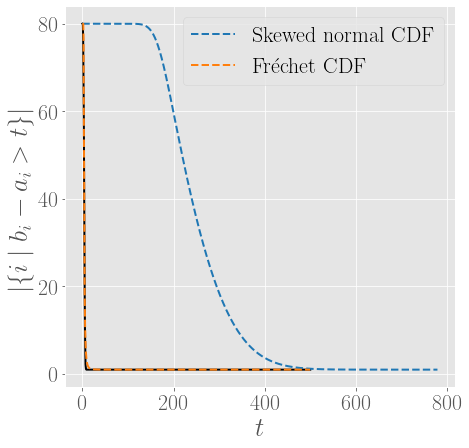

In [2881]:
errorMeasure = 'error'

maxError_id = 75
maxError = abs(params_H0_allCombs['frechet'][75][5])

fig, ax = plt.subplots(1, 1, figsize = (7, 7))
#fig.suptitle('$H_0$', fontsize = 30, y = 1)

fit = params_H0_allCombs['frechet'][maxError_id]
params = fit[0]
x = fit[1]
y = fit[2]
xFit = fit[3]
yFit = fit[4]
error = fit[5]
std = fit[6]

fit2 = params_H0_allCombs[42][maxError_id]
params2 = fit2[0]
x2 = fit2[1]
y2 = fit2[2]
xFit2 = fit2[3]
yFit2 = fit2[4]
error2 = fit2[5]
std2 = fit2[6]

ax.plot(x, y, "-", color = 'k')
ax.plot(xFit2, yFit2, "--", color = 'tab:blue', label = 'Skewed normal CDF')
ax.plot(xFit, yFit, "--", color = 'tab:orange', label = 'Fréchet CDF')

#ax.set_title("Fit error: " + str(round(maxError, 4)))
ax.set_xlabel('$t$')
ax.set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
ax.legend()

if testing:
    addOn = "test_"
else:
    addOn = ""
#if save:
    #plt.savefig(fig_path+addOn+"Mspace_comb42_fittingH0_bestWorst_frechet.jpg") #, bbox_inches="tight")
if show:
    plt.show()
plt.close()

51
18


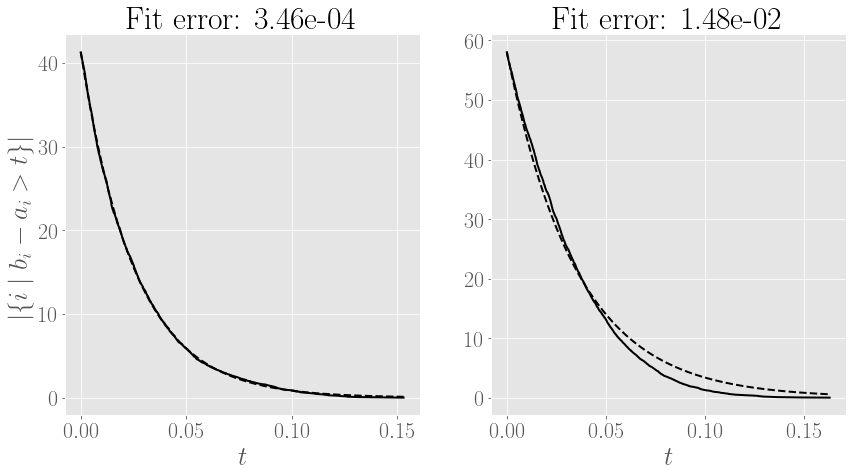

71
50


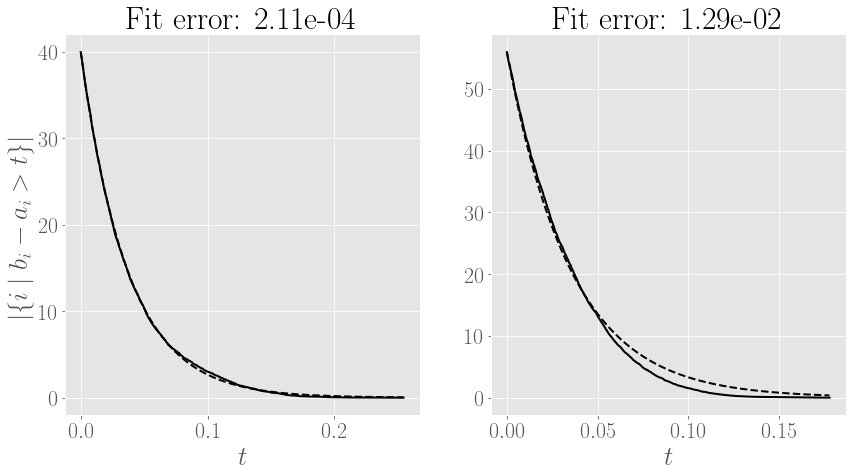

85
60


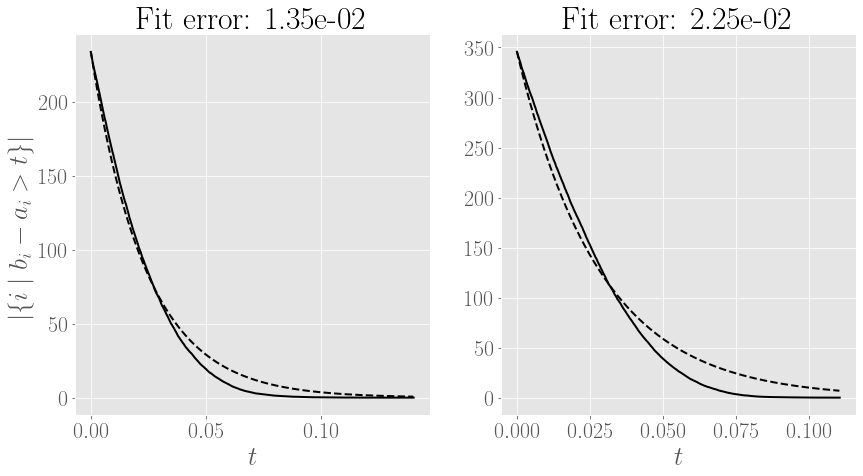

47
44


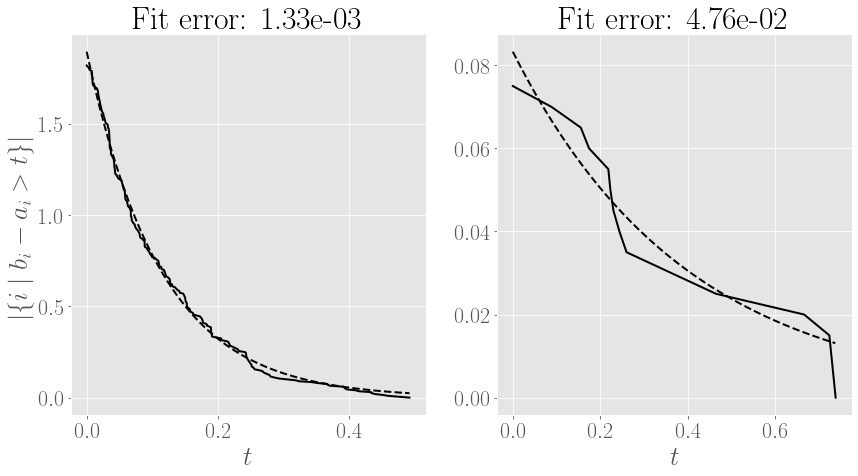

25
68


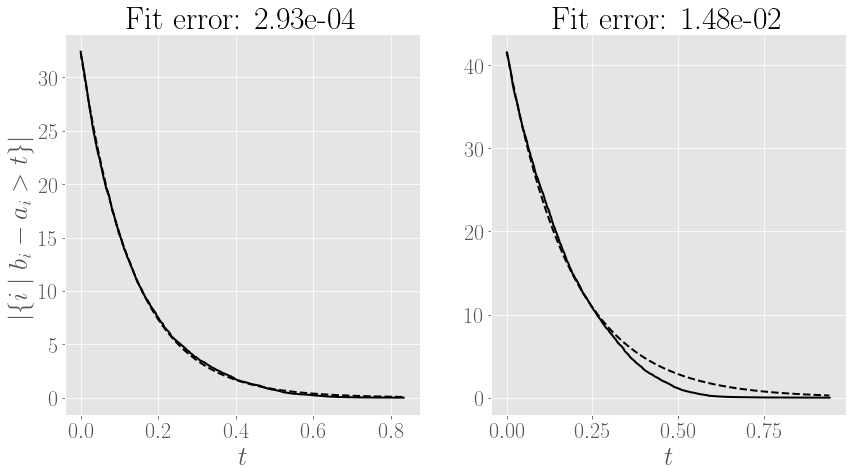

57
21


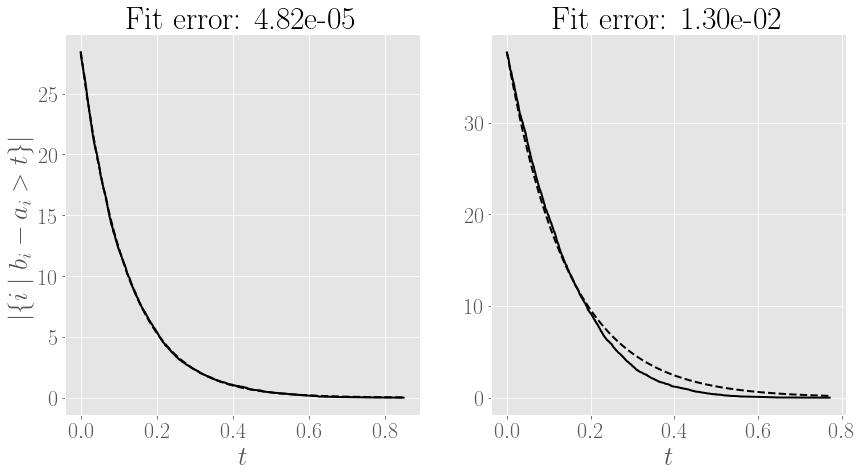

75
44


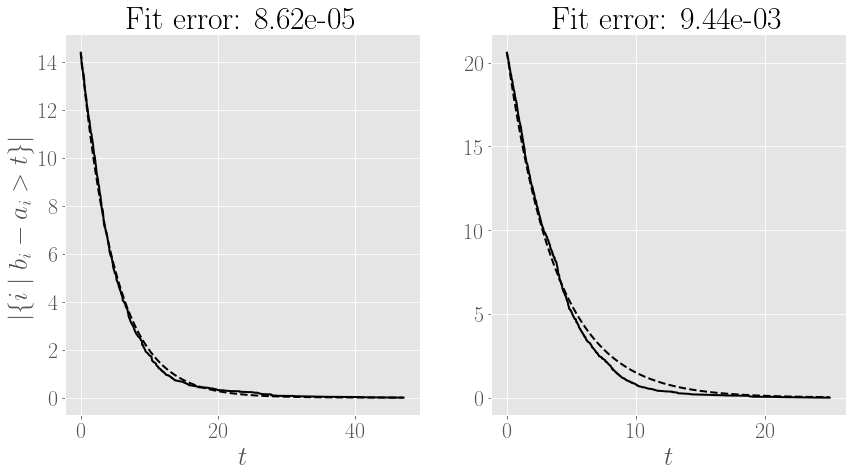

In [2220]:
minError_dict = dict()
maxError_dict = dict()
minError_id_dict = dict()
maxError_id_dict = dict()
allErrors_dict_H1 = dict()

for comb_id in [0, 7, 14, 21, 28, 35, 42]: #prePHparam.index:
    minError = 10000
    maxError = 0
    maxError_id = None
    minError_id = None
    for subject in subjects:
        if subject == 58:
            continue
        if abs(params_H1_allCombs[comb_id][subject][5]) > maxError:
            maxError = abs(params_H1_allCombs[comb_id][subject][5])
            maxError_id = subject
        if abs(params_H1_allCombs[comb_id][subject][5]) < minError:
            minError = abs(params_H1_allCombs[comb_id][subject][5])
            minError_id = subject
    
    fig, ax = plt.subplots(1, 2, figsize = (14, 7))
    #fig.suptitle('$H_1$', fontsize = 30, y = 1)
    
    fit = params_H1_allCombs[comb_id][minError_id]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    ax[0].plot(x, y, "-", color = 'k', label = 'subject '+str(minError_id))
    ax[0].plot(xFit, yFit, "--", color = 'k')
    ax[0].set_title("Fit error: " + str("{:.2e}".format(minError)))
    
    fit = params_H1_allCombs[comb_id][maxError_id]
    params = fit[0]
    x = fit[1]
    y = fit[2]
    xFit = fit[3]
    yFit = fit[4]
    error = fit[5]
    std = fit[6]
    
    ax[1].plot(x, y, "-", color = 'k', label = 'subject '+str(maxError_id))
    ax[1].plot(xFit, yFit, "--", color = 'k')
    ax[1].set_title("Fit error: " + str("{:.2e}".format(maxError)))
    
    ax[0].set_xlabel('$t$')
    ax[0].set_ylabel('$|\{i \mid b_i - a_i > t \}|$')
    ax[1].set_xlabel('$t$')
    
    print(minError_id)
    print(maxError_id)
    
    minError_dict[comb_id] = minError
    maxError_dict[comb_id] = maxError
    minError_id_dict[comb_id] = minError_id
    maxError_id_dict[comb_id] = maxError_id
    
    allErrors_dict_H1[comb_id] = [params_H1_allCombs[comb_id][subject][5] for subject in subjects if subject != 58]

    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_fittingH1_bestWorst.jpg")#, bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

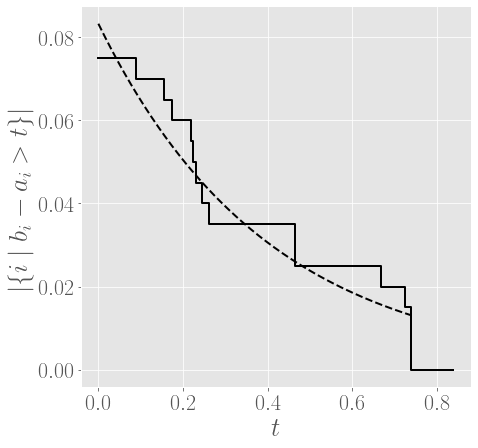

In [2235]:
comb_id = 21
subject = 44
hsrs[comb_id]['H1'][subject].plot(color = 'k')
params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds = bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs[comb_id]['H1']) 
plt.plot(xFit, yFit, 'k--')
plt.xlabel('$t$')
plt.ylabel('$|\{i \mid b_i - a_i > t \}|$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_outlier.jpg")#, bbox_inches="tight")
if show:
    plt.show()
plt.close()

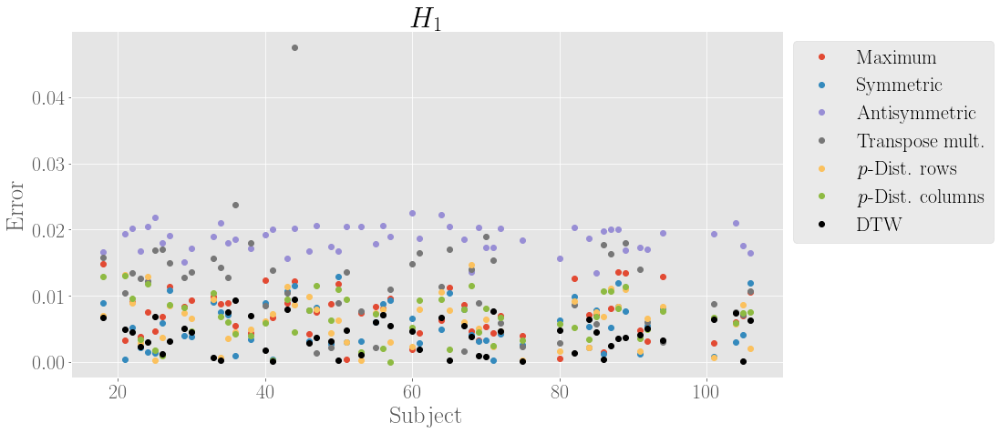

In [2210]:
plt.figure(figsize = (14, 7))
for comb_id in [0, 7, 14, 21, 28, 35, 42]: #prePHparam.index:
    if comb_id == 42:
        plt.plot(np.array([subject for subject in subjects if subject != 58]) + 0*np.random.rand(), np.abs(allErrors_dict_H1[comb_id]), 'o', color = 'k') #, label = comb_id)s
    else: 
        plt.plot(np.array([subject for subject in subjects if subject != 58]) + 0*np.random.rand(), np.abs(allErrors_dict_H1[comb_id]), 'o') #, label = comb_id)
plt.legend(['Maximum', 'Symmetric', 'Antisymmetric', 'Transpose mult.', '$p$-Dist. rows', '$p$-Dist. columns', 'DTW'], bbox_to_anchor=(1,1))
plt.xlabel('Subject')
plt.ylabel('Error')
plt.title('$H_1$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_fittingH1_errorOverview.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [2216]:
for comb_id in [0, 7, 14, 21, 28, 35, 42]:
    print(np.mean(np.abs(allErrors_dict_H0[comb_id]))*1000)
    print(np.std(allErrors_dict_H0[comb_id])/math.sqrt(len(subjects)-1)*1000)
    print(np.mean(np.abs(allErrors_dict_H1[comb_id]))*1000)
    print(np.std(allErrors_dict_H1[comb_id])/math.sqrt(len(subjects)-1)*1000)
    print("------------"+str(comb_id)+"----------------")

2.1797504983918925
0.2802880007611015
7.346001134015902
0.526832701851786
------------0----------------
1.974786452841464
0.23798108449723884
5.605548200107806
0.6445704007300906
------------7----------------
0.4995852268492151
0.09097560678768594
18.644033348835247
0.27143140281728617
------------14----------------
2.824339712515089
0.33349444992870736
11.68989033188291
1.4036465733691967
------------21----------------
3.0158810878693205
0.27734409385708225
6.280268674476835
0.5580027384989118
------------28----------------
2.625604174532281
0.21325146927748523
6.6735199163269465
0.663977210192937
------------35----------------
7.600368470094552
0.8392148507794992
4.052043872707823
0.6001178726932891
------------42----------------


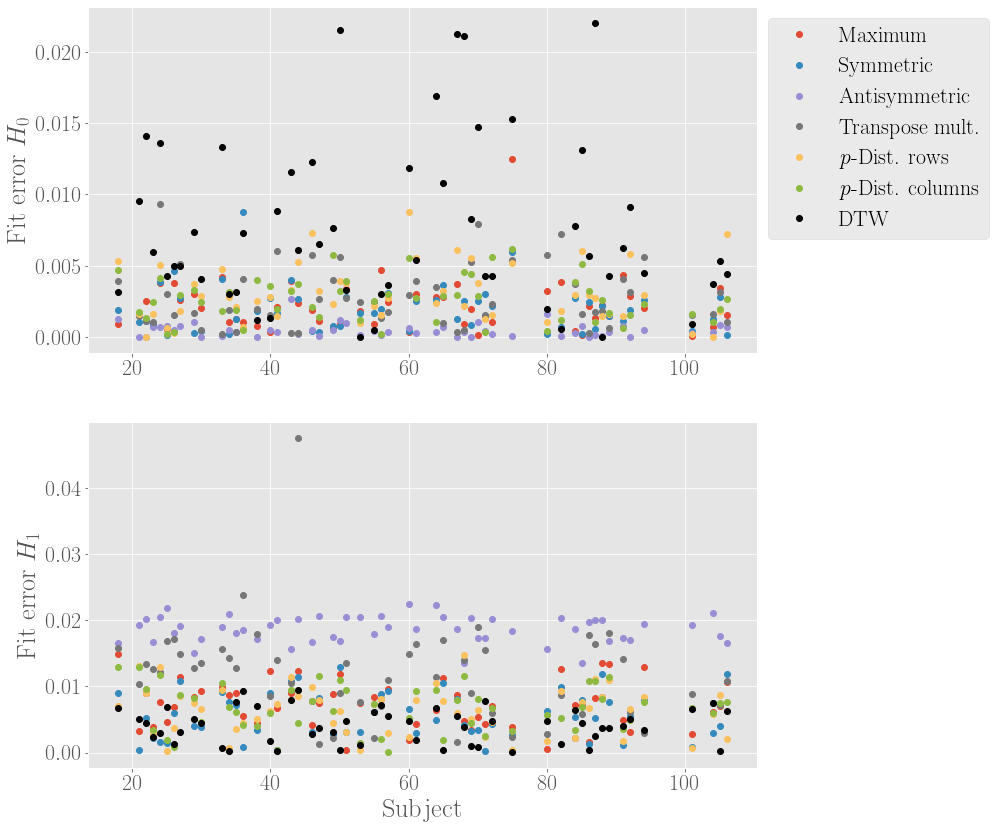

In [2214]:
fig, ax = plt.subplots(2, 1, figsize = (12, 14))
for comb_id in [0, 7, 14, 21, 28, 35, 42]: #prePHparam.index:
    if comb_id == 42:
        ax[0].plot(np.array([subject for subject in subjects if subject != 58]), np.abs(allErrors_dict_H0[comb_id]), 'o', color = 'k') #, label = comb_id)s
        ax[1].plot(np.array([subject for subject in subjects if subject != 58]), np.abs(allErrors_dict_H1[comb_id]), 'o', color = 'k') #, label = comb_id)s
    else: 
        ax[0].plot(np.array([subject for subject in subjects if subject != 58]), np.abs(allErrors_dict_H0[comb_id]), 'o') #, label = comb_id)
        ax[1].plot(np.array([subject for subject in subjects if subject != 58]), np.abs(allErrors_dict_H1[comb_id]), 'o') #, label = comb_id)
ax[0].legend(['Maximum', 'Symmetric', 'Antisymmetric', 'Transpose mult.', '$p$-Dist. rows', '$p$-Dist. columns', 'DTW'], bbox_to_anchor=(1,1))
ax[1].set_xlabel('Subject')
ax[0].set_ylabel('Fit error $H_0$')
ax[1].set_ylabel('Fit error $H_1$')
#plt.title('$H_0$')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_fitting_errorOverview.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

## Validate robustness with noise

In [2653]:
prePHparam.head()

,methods,symmetrizations,neg_vals_methods,cor_to_dist_funcs
0,delayedPearson\C200_delay1,maximum,abs,linear
1,delayedPearson\C200_delay2,maximum,abs,linear
2,delayedPearson\C200_delay3,maximum,abs,linear
3,delayedPearson\C200_delay4,maximum,abs,linear
4,delayedPearson\C200_delay5,maximum,abs,linear


In [2654]:
comb_id = 42
comb = prePHparam.loc[comb_id]
hsrs_H0 = hsrs[comb_id]["H0_single"]
hsrs_H1 = hsrs[comb_id]["H1"]

In [2825]:
class DistanceMatrix:
    def __init__(self, 
                 subject,
                 cohort="PD",
                 method=data.default_method,
                 symmetrization=data.default_symmetrization,
                 neg_vals_method=data.default_neg_vals_method, 
                 cor_to_dist_func=data.default_cor_to_dist_func, 
                 transform=data.default_transform,
                 mid=data.default_mid,
                 connectivity_density=data.default_connectivity_density,
                 noiseAmpl=0):
        
        self.subject = subject
        self.method = method
        
        self.main_method = method.split("\\")[0]
        try:
            self.submethod = method.split("\\")[1]
            path_start = os.getcwd()+"\\data\\DistanceMatrices_"+cohort+"\\"+self.method+"\\"+self.submethod+"_Subject"
        except IndexError:
            self.submethod = None
            path_start = os.getcwd()+"\\data\\DistanceMatrices_"+cohort+"\\"+self.method+"\\"+self.method+"_Subject"
        
        if "timeVarying" in method:
            path_end = str(subject)+"_Window"+str(window)+".csv"
        elif "C200" in method:
            path_end = "_"+str(subject)
        else:
            path_end = str(subject)+".csv"
            
        self.filename = path_start + path_end
        
        self.neg_vals_method = neg_vals_method
        self.cor_to_dist_func = cor_to_dist_func
        self.transform = transform
        self.connectivity_density = connectivity_density
        if cohort == "PD":
            self.label = data.labels[subject]
        elif cohort == "AD":
            self.label = AD_info.loc[subject].DiagnosisPET
        
        if "dtw" in self.main_method: 
            #stored matrices are distance matrices taking values in [0, inf)
            self.dist_mat = pd.read_csv(self.filename, header=None).to_numpy()
            self.dist_mat = self.dist_mat + (np.random.rand(200, 200) * 2 * noiseAmpl - noiseAmpl)
            self.dist_mat = data.threshold_matrix(matrix = self.dist_mat, connectivity_density = self.connectivity_density, clip_lowVals = False)
            self.dist_mat = data.map_to_unitInterval(matrix = self.dist_mat, transform=transform, mid=mid) # transform can be None
        
        else: #delayed Pearson
            #stored matrices are correlation matrices taking values in [-1, 1]
            self.cor_mat = pd.read_csv(self.filename, header=None).to_numpy()
            self.cor_mat = self.cor_mat + np.random.rand(200, 200) * noiseAmpl
            self.cor_mat = data.threshold_matrix(matrix = self.cor_mat, connectivity_density = self.connectivity_density, clip_lowVals = True)
            if "pdist" in symmetrization:
                self.dist_mat = data.symmetrize_matrix(matrix = self.cor_mat, symmetrization = symmetrization) 
                self.dist_mat = data.map_to_unitInterval(matrix = self.dist_mat, transform=transform, mid=mid) # transform can be None
            else:
                self.cor_mat = bound_matrix(matrix = self.cor_mat, neg_vals_method = neg_vals_method)
                self.cor_mat = data.symmetrize_matrix(matrix = self.cor_mat, symmetrization = symmetrization) 
            
                if symmetrization == "transpose_multiplication":   
                    self.dist_mat = data.map_to_unitInterval(matrix = self.cor_mat, transform=transform, mid=mid) # transform can be None 
                else:
                    self.dist_mat = data.correlation_to_distance(cor_mat = self.cor_mat, cor_to_dist_func=cor_to_dist_func) 
        
        self.nr_of_areas = self.dist_mat.shape[0]
        
def bound_matrix(matrix, neg_vals_method=data.default_neg_vals_method):
    if np.nanmin(matrix) >= 0:
        #print("matrix already non-negative")
        return matrix
   
    elif neg_vals_method == "clip_zero":
        bounded_matrix = np.clip(matrix, a_min=0, a_max=None)
    elif neg_vals_method == "clip_zero_inv":
        bounded_matrix = np.abs(np.clip(matrix, a_min=None, a_max=0))
    elif neg_vals_method == "abs":
        bounded_matrix = np.abs(matrix)
    else:
        if np.amin(matrix) < 0:
            print("Invalid neg_vals_method, returning original dataframe which contains negative values")
            print("Choose valid neg_vals_method, options :")
            print(" - 'clip_zero' for setting negative values to 0; ")
            print(" - 'clip_zero_inv' for setting positive values to 0 and taking the absolute value; or ")
            print(" - 'abs' for taking the absolute value.")
            return matrix
            
    return bounded_matrix

In [2656]:
allValues = np.zeros(1)
comb_id = 42
for subject in data.train_subjects_noctr:
    dist_mat = DistanceMatrix(subject,
                              cohort="PD",
                              method=prePHparam.loc[comb_id,'methods'],
                              symmetrization=None,
                              neg_vals_method=None, 
                              cor_to_dist_func=None, 
                              connectivity_density=1).dist_mat
    for i in range(200):
        dist_mat[i, i] = np.nan
    list_of_values = dist_mat.flatten()
    list_of_values = list_of_values[np.logical_not(np.isnan(list_of_values))]
    allValues = np.concatenate([allValues, list_of_values])
medianVal = np.median(allValues)
noiseAmpl_dtw = 0.01 * medianVal

In [2534]:
allValues = np.zeros(1)
comb_id = 21
for subject in data.train_subjects_noctr:
    dist_mat = DistanceMatrix(subject,
                              cohort="PD",
                              method=prePHparam.loc[comb_id,'methods'],
                              symmetrization="nothing",
                              neg_vals_method=None, 
                              cor_to_dist_func=None, 
                              connectivity_density=1).dist_mat
    for i in range(200):
        dist_mat[i, i] = np.nan
    list_of_values = dist_mat.flatten()
    list_of_values = list_of_values[np.logical_not(np.isnan(list_of_values))]
    allValues = np.concatenate([allValues, list_of_values])
medianVal = np.median(allValues)
noiseAmpl_pearson = 0.01 * medianVal

Invalid neg_vals_method, returning original dataframe which contains negative values
Choose valid neg_vals_method, options :
 - 'clip_zero' for setting negative values to 0; 
 - 'clip_zero_inv' for setting positive values to 0 and taking the absolute value; or 
 - 'abs' for taking the absolute value.
invalid symmetrization method, returning original, asymmetric matrix
Invalid neg_vals_method, returning original dataframe which contains negative values
Choose valid neg_vals_method, options :
 - 'clip_zero' for setting negative values to 0; 
 - 'clip_zero_inv' for setting positive values to 0 and taking the absolute value; or 
 - 'abs' for taking the absolute value.
invalid symmetrization method, returning original, asymmetric matrix
Invalid neg_vals_method, returning original dataframe which contains negative values
Choose valid neg_vals_method, options :
 - 'clip_zero' for setting negative values to 0; 
 - 'clip_zero_inv' for setting positive values to 0 and taking the absolute value; 

In [2826]:
print(noiseAmpl_dtw)
print(noiseAmpl_pearson)

2.4440684517737234
0.0019625000000000003


In [2827]:
comb_id = 42

In [2828]:
dist_mats_noisy = dict()
repeats = 10
matsShape = dist_mat.shape
for i in range(repeats):
    dist_mats_noisy[i] = dict()
    for subject in data.train_subjects_noctr:
        dist_mats_noisy[i][subject] = DistanceMatrix(subject,
                                                             cohort="PD",
                                                             method=prePHparam.loc[comb_id,'methods'],
                                                             symmetrization=prePHparam.loc[comb_id,'symmetrizations'],
                                                             neg_vals_method=prePHparam.loc[comb_id,'neg_vals_methods'], 
                                                             cor_to_dist_func=prePHparam.loc[comb_id,'cor_to_dist_funcs'], 
                                                             connectivity_density=1,
                                                             noiseAmpl = noiseAmpl_pearson).dist_mat

In [2829]:
control_dist_mats_noisy = dict()
for i in range(repeats):
    control_dist_mats_noisy[i] = dict()
    for subject in data.train_i_ctr:
        control_dist_mats_noisy[i][subject] = DistanceMatrix(subject,
                                                             cohort="PD",
                                                             method=prePHparam.loc[comb_id,'methods'],
                                                             symmetrization=prePHparam.loc[comb_id,'symmetrizations'],
                                                             neg_vals_method=prePHparam.loc[comb_id,'neg_vals_methods'], 
                                                             cor_to_dist_func=prePHparam.loc[comb_id,'cor_to_dist_funcs'], 
                                                             connectivity_density=1,
                                                             noiseAmpl = noiseAmpl_pearson).dist_mat

In [2830]:
hsrs_noisy = dict()
for i in tqdm(range(repeats)):
    hsrs_noisy[i] = dict()
    for homology in ['H0_single', 'H1']:
        hsrs_noisy[i][homology] = data.f_global(dist_mats_noisy[i], homology = homology)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [15:50<00:00, 95.06s/it]


In [2831]:
control_hsrs_noisy = dict()
for i in tqdm(range(repeats)):
    control_hsrs_noisy[i] = dict()
    for homology in ['H0_single', 'H1']:
        control_hsrs_noisy[i][homology] = data.f_global(control_dist_mats_noisy[i], homology = homology)

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:03<00:00, 12.35s/it]


## Robustness of fits

In [2833]:
save = False

In [2834]:
def scale_df(df, df_ctr):
    full_df = pd.concat([df, df_ctr], axis = 0)
    scaler = MinMaxScaler()
    scaler.fit(full_df)
    scaled = scaler.fit_transform(full_df)
    scaled_df = pd.DataFrame(scaled, columns = full_df.columns, index = full_df.index)
    scaled_noCtr_df = scaled_df.drop(controls, axis = 0)
    scaled_ctr_df = scaled_df.loc[controls]
    return scaled_noCtr_df, scaled_ctr_df

[ 74.8613627  103.72579055  73.25129181]
[ 82.83553797 103.40101395  73.46768028]
[ 95.89034709 103.13595977  73.7571697 ]
[ 86.79527239 103.17972624  74.21481185]
[ 82.78425028 103.3089217   73.68223599]
[ 94.85700693 103.26152018  72.78530752]
[ 93.09526434 103.01564836  74.58069476]
[ 99.9225724  103.00794629  72.94838134]
[ 99.99999994 102.70024227  74.41987078]
[ 80.37966573 103.29667715  72.9559096 ]


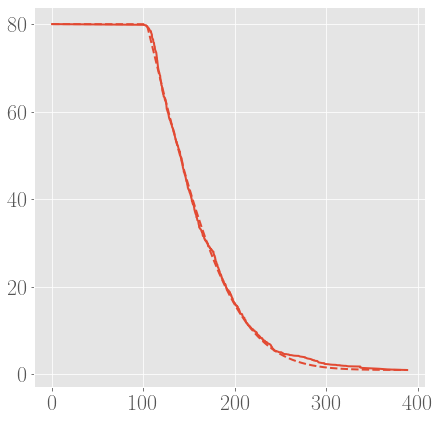

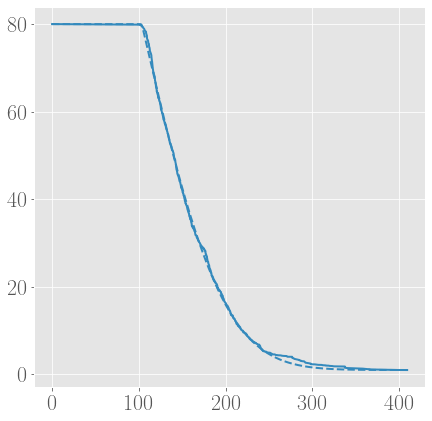

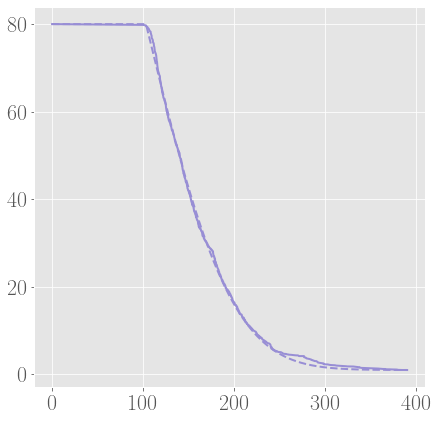

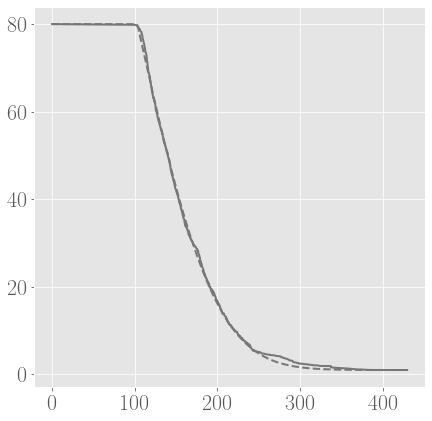

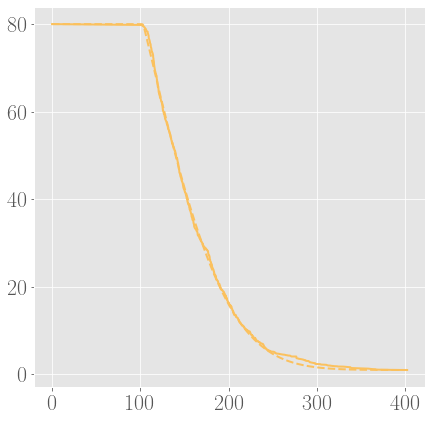

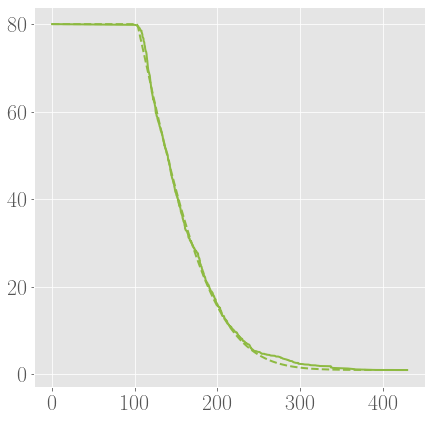

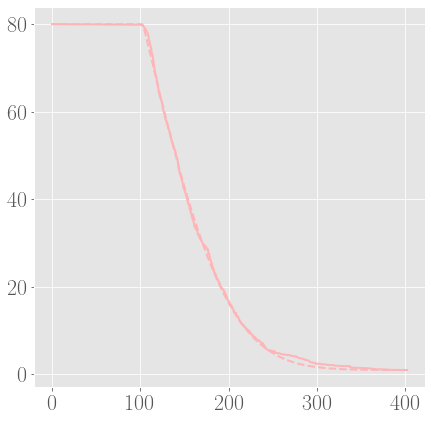

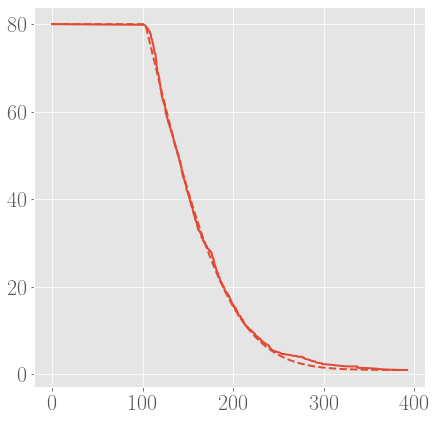

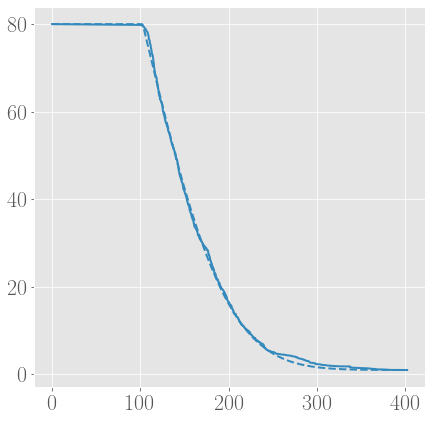

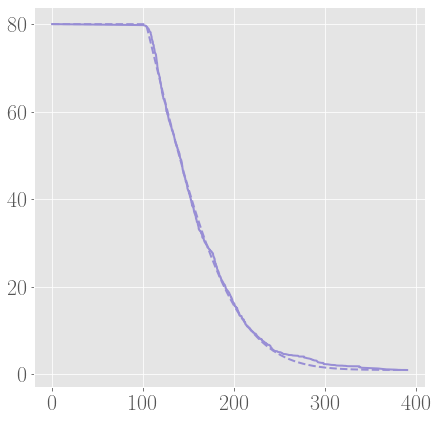

In [2972]:
j = 0
for i in range(repeats):
    for subject in [89]: #data.train_subjects_noctr:
        params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds = bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs_noisy[i]['H0_single'])   
        print(params)
        if j % 1 == 0:
            plt.figure()
            #plt.xlim(0, 20)
            
        plt.plot(x, y, "-", color = 'C'+str(j), label = str(subject) + "; error: " + str(round(error, 2)))
        plt.plot(xFit, yFit, "--", color = 'C'+str(j))
        
        j += 1

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

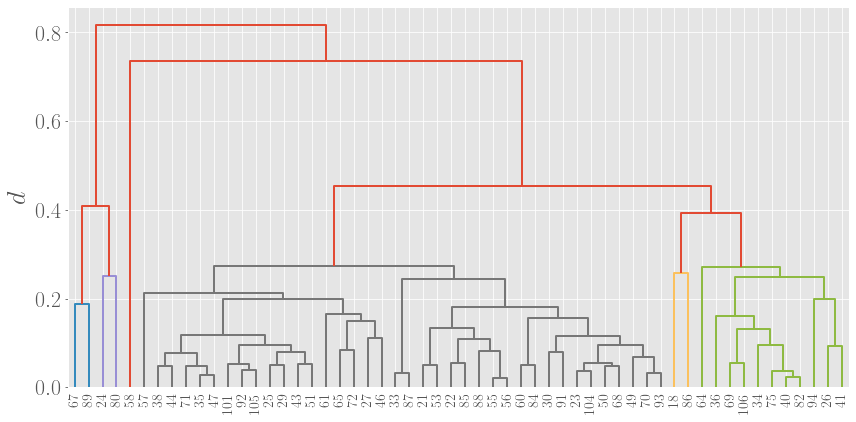

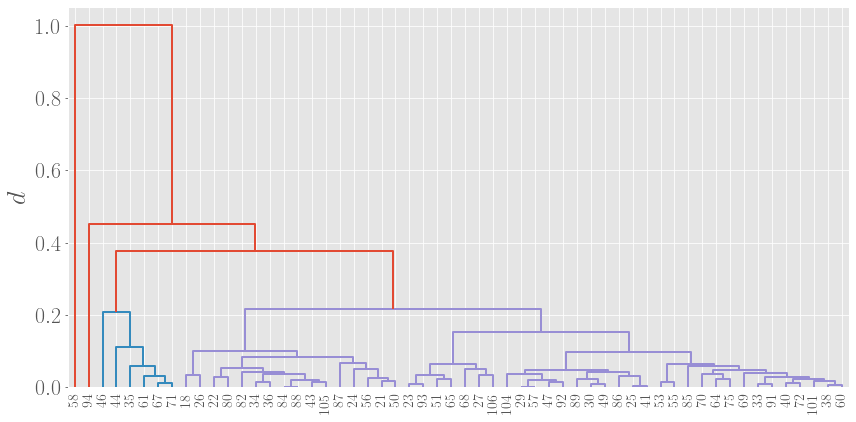

 10%|████████▎                                                                          | 1/10 [00:06<01:01,  6.81s/it]

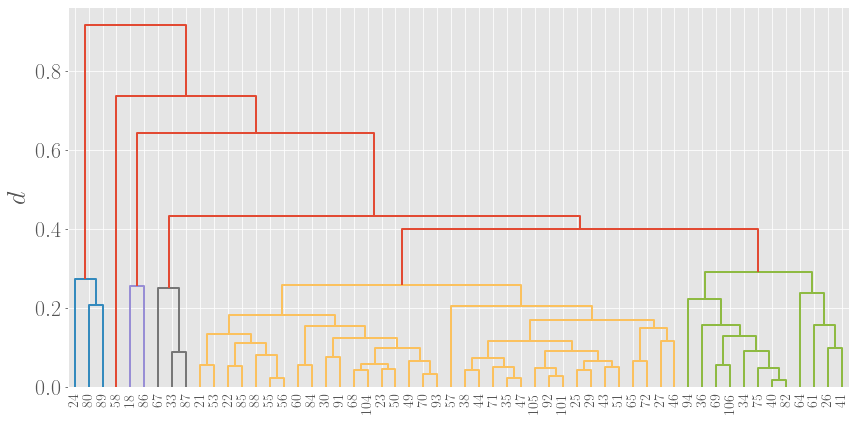

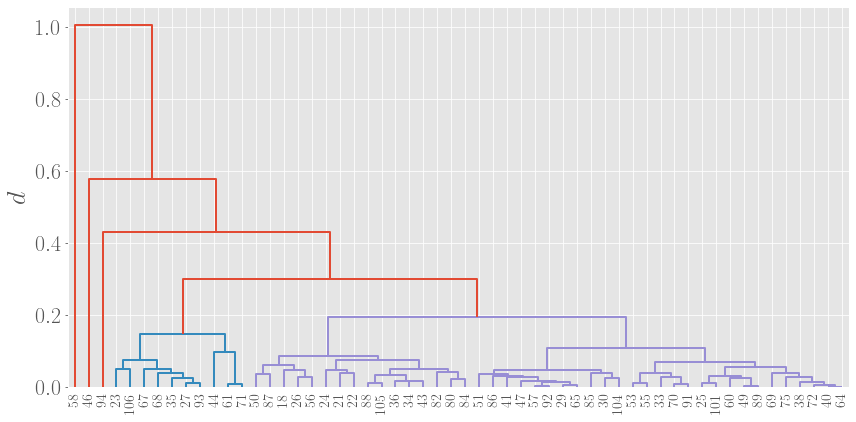

 20%|████████████████▌                                                                  | 2/10 [00:13<00:53,  6.70s/it]

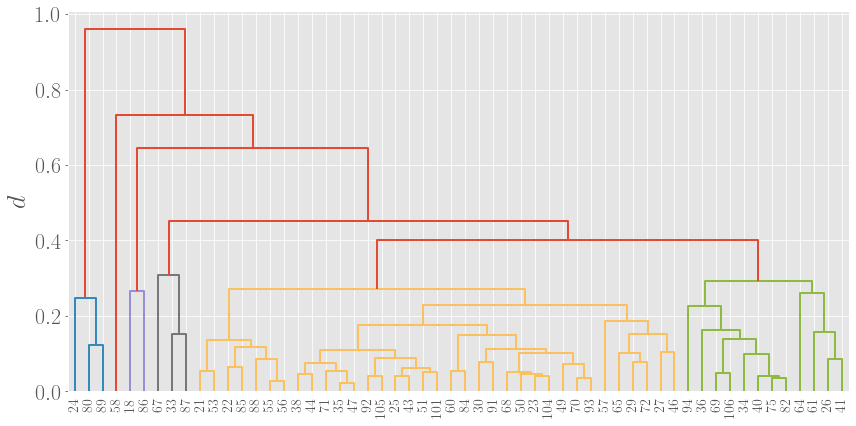

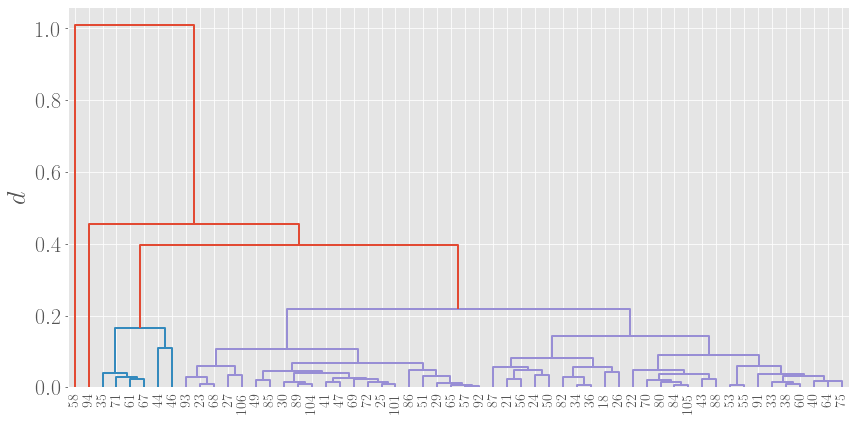

 30%|████████████████████████▉                                                          | 3/10 [00:19<00:45,  6.51s/it]

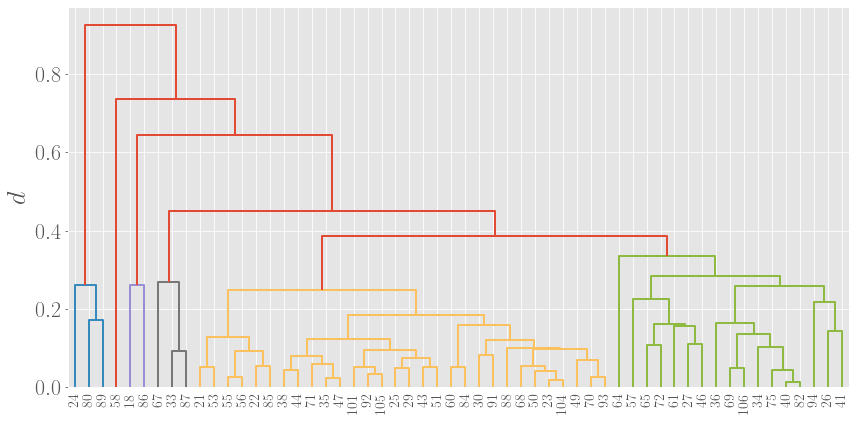

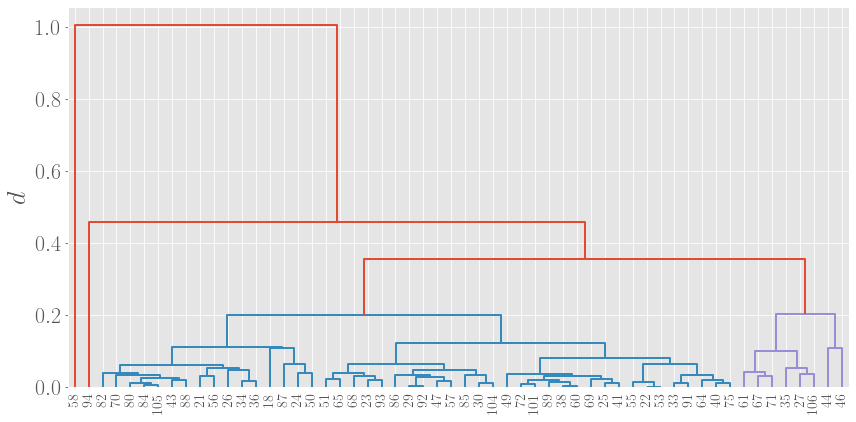

 40%|█████████████████████████████████▏                                                 | 4/10 [00:26<00:38,  6.48s/it]

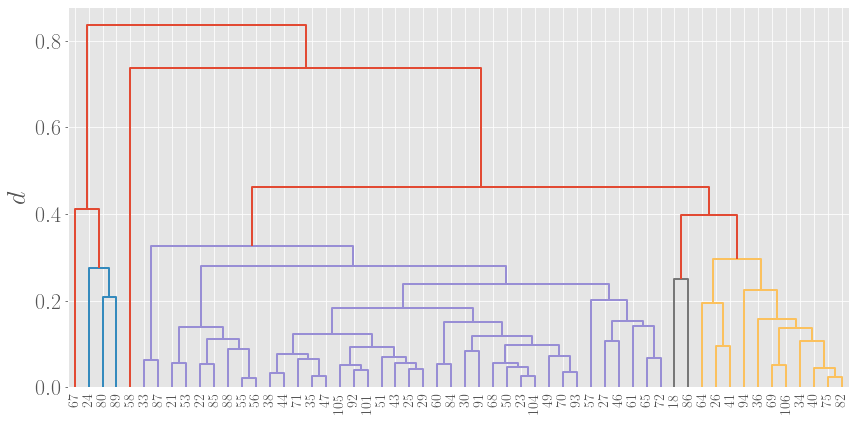

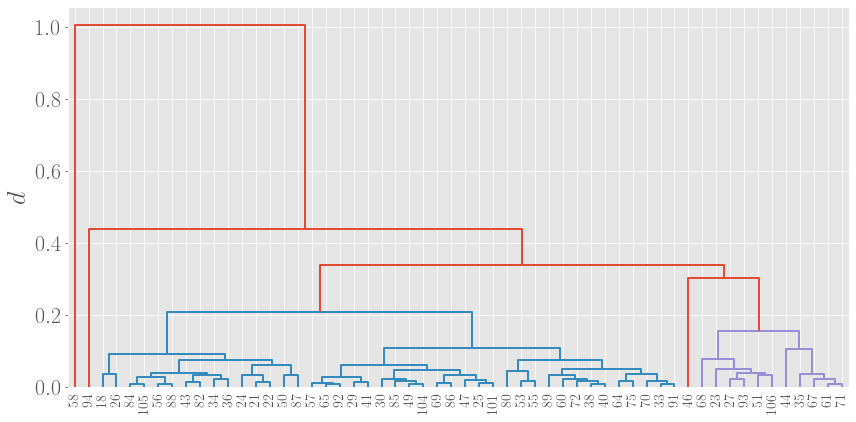

 50%|█████████████████████████████████████████▌                                         | 5/10 [00:32<00:32,  6.54s/it]

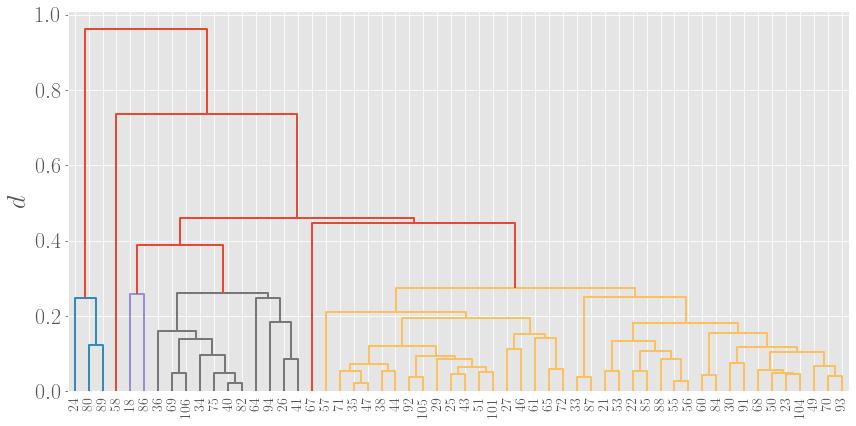

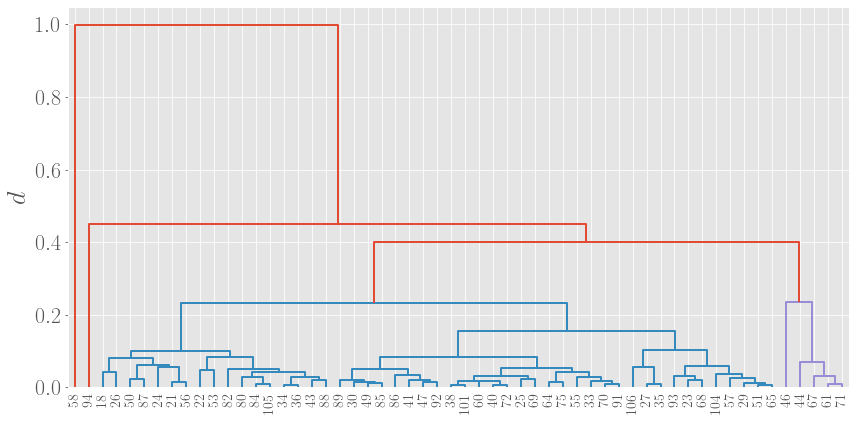

 60%|█████████████████████████████████████████████████▊                                 | 6/10 [00:39<00:26,  6.57s/it]

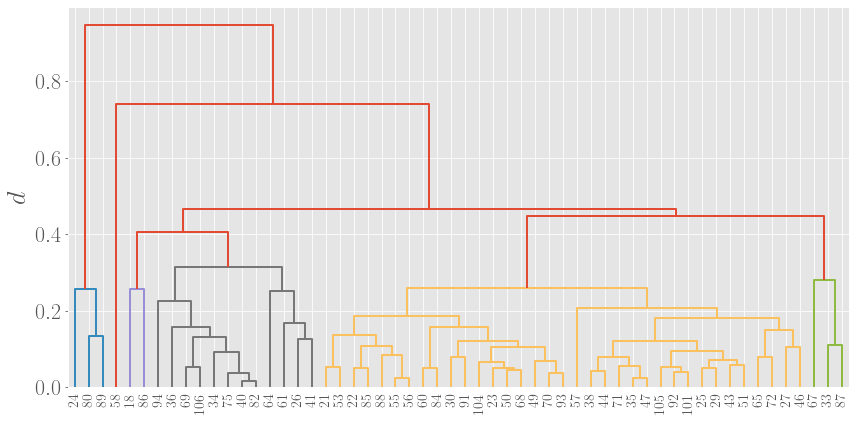

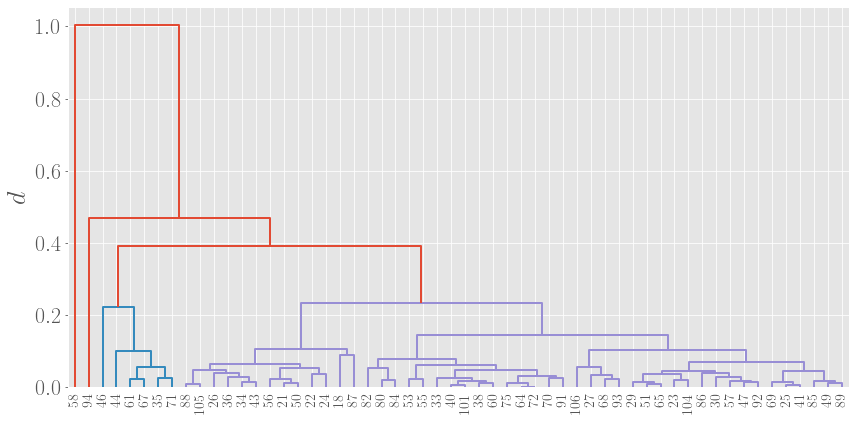

 70%|██████████████████████████████████████████████████████████                         | 7/10 [00:45<00:19,  6.48s/it]

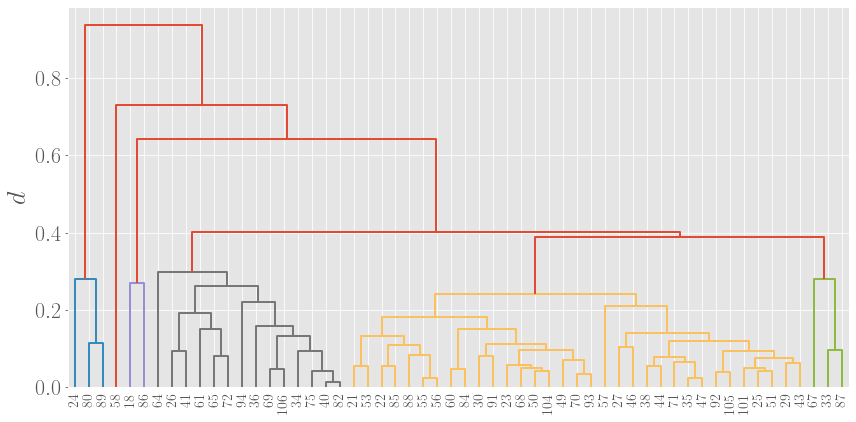

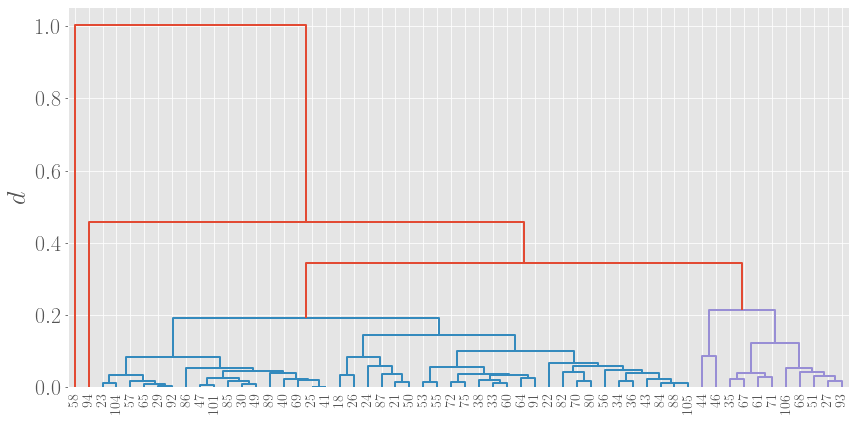

 80%|██████████████████████████████████████████████████████████████████▍                | 8/10 [00:52<00:12,  6.48s/it]

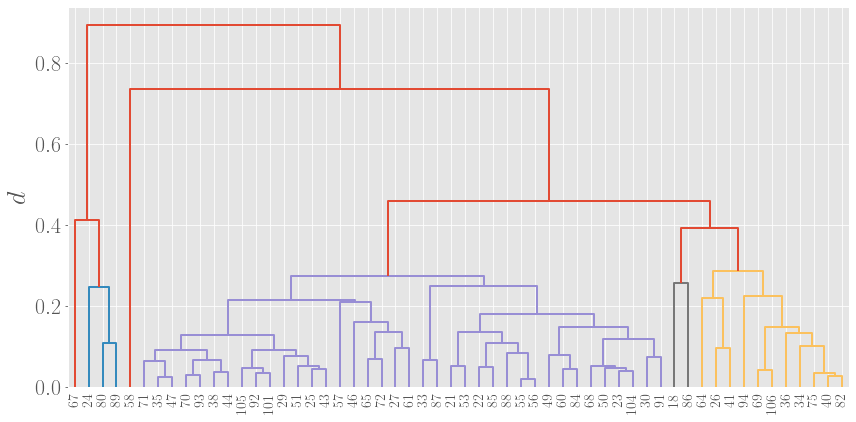

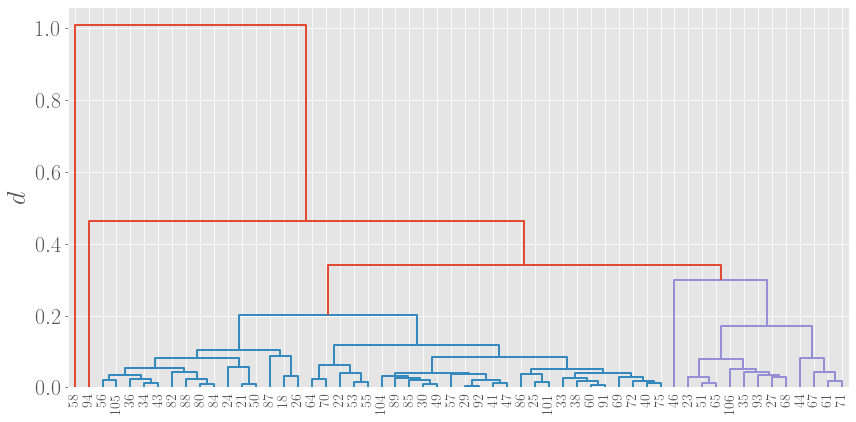

 90%|██████████████████████████████████████████████████████████████████████████▋        | 9/10 [00:59<00:06,  6.62s/it]

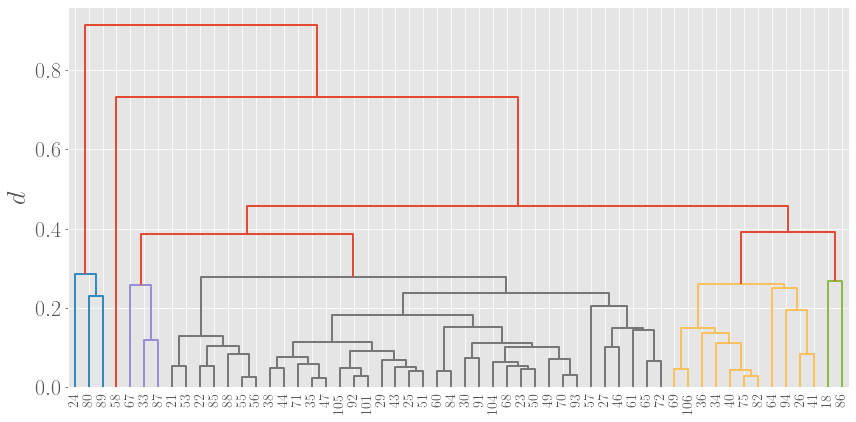

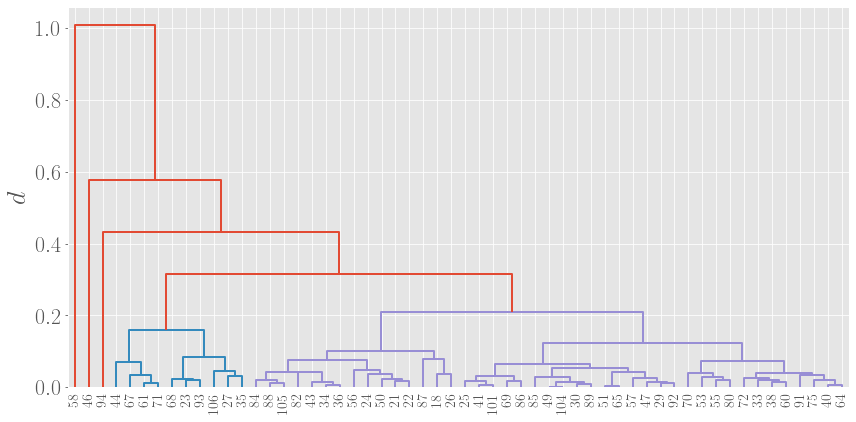

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [01:05<00:00,  6.55s/it]


In [2836]:
params_H0_noise = dict()
params_H1_noise = dict()
scaled_params_H0_noise = dict()
scaled_params_H1_noise = dict()
control_params_H0_noise = dict()
control_params_H1_noise = dict()
control_scaled_params_H0_noise = dict()
control_scaled_params_H1_noise = dict()

for i in tqdm(range(repeats)):
    params_H0_noise[i] = dict()
    params_H1_noise[i] = dict()
    scaled_params_H0_noise[i] = dict()
    scaled_params_H1_noise[i] = dict()
    control_params_H0_noise[i] = dict()
    control_params_H1_noise[i] = dict()
    control_scaled_params_H0_noise[i] = dict()
    control_scaled_params_H1_noise[i] = dict()
    
    for subject in data.train_subjects_noctr:
        params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds = bounds_1skew_H0[comb_id], temp_hsrs_H0 = hsrs_noisy[i]['H0_single'])   
        error = error/y[0]
        params_H0_noise[i][subject] = params

        params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds = bounds_exponential_H1[comb_id], temp_hsrs_H1 = hsrs_noisy[i]['H1'])   
        error = error/y[0]
        params_H1_noise[i][subject] = params
        
    for subject in data.train_i_ctr:
        params, x, y, xFit, yFit, error, std = fit_1skew_H0(subject, bounds = bounds_1skew_H0[comb_id], temp_hsrs_H0 = control_hsrs_noisy[i]['H0_single'])   
        error = error/y[0]
        control_params_H0_noise[i][subject] = params

        params, x, y, xFit, yFit, error, std = fit_exponential_H1(subject, bounds = bounds_exponential_H1[comb_id], temp_hsrs_H1 = control_hsrs_noisy[i]['H1'])   
        error = error/y[0]
        control_params_H1_noise[i][subject] = params
    
    control_params_H0_noise_df = pd.DataFrame.from_dict(control_params_H0_noise[i]).T
    params_H0_noise_df = pd.DataFrame.from_dict(params_H0_noise[i]).T
    control_params_H1_noise_df = pd.DataFrame.from_dict(control_params_H1_noise[i]).T
    params_H1_noise_df = pd.DataFrame.from_dict(params_H1_noise[i]).T
    
    params_H0_noise_df_scaled, control_params_H0_noise_df_scaled = scale_df(params_H0_noise_df, control_params_H0_noise_df)
    params_H1_noise_df_scaled, control_params_H1_noise_df_scaled = scale_df(params_H1_noise_df, control_params_H1_noise_df)
    
    for subject in data.train_subjects_noctr:
        scaled_params_H0_noise[i][subject] = params_H0_noise_df_scaled.loc[subject].values
        scaled_params_H1_noise[i][subject] = params_H1_noise_df_scaled.loc[subject].values
    for subject in data.train_i_ctr:
        control_scaled_params_H0_noise[i][subject] = control_params_H0_noise_df_scaled.loc[subject].values
        control_scaled_params_H1_noise[i][subject] = control_params_H1_noise_df_scaled.loc[subject].values
        
    # cluster H0
    feature_matrix = params_H0_noise_df_scaled.copy()
    #params_df = params_H0_noise_df_scaled.copy()
    #control_params = control_params_H0_noise_df_scaled.copy()
    subjects = feature_matrix.index.values
    
    cluster_mode = "average"
    fn = "H0_noisy"+str(i)
    #labels = ["Skewness", "Location", "Scale"]

    color_threshold = 0.38
    t = 7

    clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering(subjects, feature_matrix, fn, cluster_mode, color_threshold, t)
    
    # cluster H1
    feature_matrix = params_H1_noise_df_scaled.copy()
    #params_df = params_H0_noise_df_scaled.copy()
    #control_params = control_params_H0_noise_df_scaled.copy()
    subjects = feature_matrix.index.values
    
    cluster_mode = "average"
    fn = "H1_noisy"+str(i)
    #labels = ["Skewness", "Location", "Scale"]

    color_threshold = 0.3
    t = 7

    clusters_subjectIDs[fn], colors_subjects[fn] = hierarchical_clustering(subjects, feature_matrix, fn, cluster_mode, color_threshold, t)

C4
C0
C4
C2
C0
C2
C2
C0
C2
C2
C0
C2
C3
C3
C2
C2
C2
C0
C2
C2
C0
C2
C3
C3
C5
C0
C5


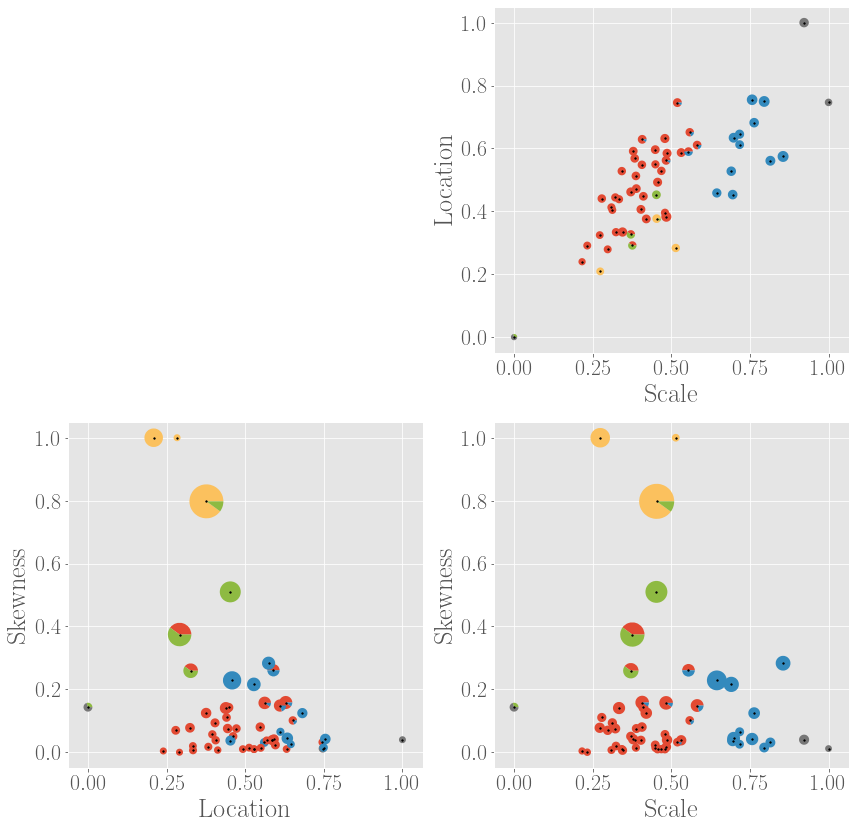

In [2977]:
def plot_pie(x, ax, centers, r):
    ax.pie(x[['r0', 'r1', 'r2', 'r3', 'r4']], center=(x[centers[0]],x[centers[1]]), radius=r, colors=['C0', 'C1', 'C4', 'C5', 'C3'], 
           wedgeprops={'clip_on':True}, frame=True)
    
#identifiers_H0 = [101, 104, 69, 46] #21
identifiers_H0 = [101, 106, 80, 67] #42

fn = "H0_noisy"
params_df = params_H0_noise_df_scaled.copy()    
    
labels_noisy_total = dict()
radius_xy = dict()
radius_xz = dict()
radius_yz = dict()

for subject in subjects:
    labels_noisy_total[subject] = dict()
    radius_xy[subject] = np.mean([np.std([scaled_params_H0_noise[i][subject][j] for i in range(repeats)]) for j in [0, 1]]) + 0.01
    radius_xz[subject] = np.mean([np.std([scaled_params_H0_noise[i][subject][j] for i in range(repeats)]) for j in [0, 2]]) + 0.01
    radius_yz[subject] = np.mean([np.std([scaled_params_H0_noise[i][subject][j] for i in range(repeats)]) for j in [1, 2]]) + 0.01
#radius = pd.Series(radius)

for i in range(repeats):
    colors = colors_subjects[fn+str(i)]
    label0 = colors[identifiers_H0[0]]
    label1 = colors[identifiers_H0[1]]
    label2 = colors[identifiers_H0[2]]
    label3 = colors[identifiers_H0[3]]

    for subject in subjects:
        if colors[subject] == label0:
            labels_noisy_total[subject][i] = 0
        elif colors[subject] == label1:
            labels_noisy_total[subject][i] = 1
        elif colors[subject] == label2:
            labels_noisy_total[subject][i] = 2
        elif colors[subject] == label3:
            labels_noisy_total[subject][i] = 3
        else:
            print(colors[subject])
            labels_noisy_total[subject][i] = 4
        
ratios = dict()
for subject in subjects:
    list_of_labels = [labels_noisy_total[subject][i] for i in range(repeats)]
    ratios[subject] = [list_of_labels.count(i) for i in range(5)]

ratios_df = pd.DataFrame.from_dict(ratios).T

pieplot_df = pd.concat([params_df, ratios_df], axis = 1)
pieplot_df.columns = ['x', 'y', 'z', 'r0', 'r1', 'r2', 'r3', 'r4']
pieplot_extra = pieplot_df.copy()
pieplot_extra.loc[1000] = {'x': 10, 'y': 10, 'z': 10, 'r0': 1, 'r1': 0, 'r2': 0, 'r3': 0, 'r4': 0}

fig, ax = plt.subplots(2, 2, figsize = (14, 14))
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

ax[1, 0].scatter(pieplot_df['y'], pieplot_df['x'], s=0)

x_init = ax[0, 0].get_xlim()
for subject in subjects:
    #ax[0, 0].errorbar(x = pieplot_df.loc[subject]['y'], y = pieplot_df.loc[subject]['x'], yerr = np.std([scaled_params_H0_noise[i][subject][1] for i in range(repeats)]), 
    #                 xerr = np.std([scaled_params_H0_noise[i][subject][0] for i in range(repeats)]), ecolor = 'k')
    pieplot_extra.loc[[subject, 1000]].apply(lambda x : plot_pie(x, ax[1, 0], centers = ['y', 'x'], r = radius_xy[subject]), axis=1)
ax[1, 0].set_xlabel(labels[1])
ax[1, 0].set_ylabel(labels[0])
ax[1, 0].axis('equal')

ax[0, 1].scatter(pieplot_df['z'], pieplot_df['y'], s=0)
x_init = ax[0, 1].get_xlim()
for subject in subjects:
    #ax[0, 1].errorbar(x = pieplot_df.loc[subject]['z'], y = pieplot_df.loc[subject]['y'], yerr = np.std([scaled_params_H0_noise[i][subject][2] for i in range(repeats)]), 
    #                 xerr = np.std([scaled_params_H0_noise[i][subject][1] for i in range(repeats)]), ecolor = 'k')
    pieplot_extra.loc[[subject, 1000]].apply(lambda x : plot_pie(x, ax[0, 1], centers = ['z', 'y'], r = radius_yz[subject]), axis=1)
ax[0, 1].set_xlabel(labels[2])
ax[0, 1].set_ylabel(labels[1])
ax[0, 1].axis('equal')

ax[1, 1].scatter(pieplot_df['z'], pieplot_df['x'], s=0)
x_init = ax[1, 1].get_xlim()
for subject in subjects:
    #ax[1, 1].errorbar(x = pieplot_df.loc[subject]['z'], y = pieplot_df.loc[subject]['x'], yerr = np.std([scaled_params_H0_noise[i][subject][2] for i in range(repeats)]), 
    #                 xerr = np.std([scaled_params_H0_noise[i][subject][0] for i in range(repeats)]), ecolor = 'k')
    pieplot_extra.loc[[subject, 1000]].apply(lambda x : plot_pie(x, ax[1, 1], centers = ['z', 'x'], r = radius_xz[subject]), axis=1)
ax[1, 1].set_xlabel(labels[2])
ax[1, 1].set_ylabel(labels[0])
ax[1, 1].axis('equal')

ax[0, 1].set_xlim(-0.05, 1.05)
ax[0, 1].set_ylim(-0.05, 1.05) 
ax[1, 0].set_xlim(-0.05, 1.05)
ax[1, 0].set_ylim(-0.05, 1.05) 
ax[1, 1].set_xlim(-0.05, 1.05)
ax[1, 1].set_ylim(-0.05, 1.05) 

fig.delaxes(ax[0, 0])

ax[1,0].scatter(pieplot_df['y'], pieplot_df['x'], s=3, color = 'k')
ax[0,1].scatter(pieplot_df['z'], pieplot_df['y'], s=3, color = 'k')
ax[1,1].scatter(pieplot_df['z'], pieplot_df['x'], s=3, color = 'k')       

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_robustness.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [2840]:
save = False

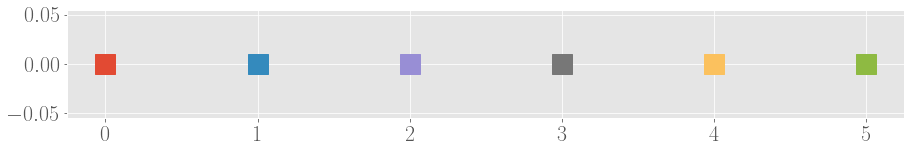

In [2975]:
plt.figure(figsize=(15, 2))
for i in range(6):
    plt.plot(i, 0, 's', color = 'C'+str(i), ms = 20)

In [2939]:
interesting_fns

['H0_1skew_4features_average',
 'H0_1skew_3features_average',
 'H1_exponential_3features_average_noOutliers',
 'H1_exponential_2features_average_noOutliers',
 'H0H1_5features_average']

In [2947]:
subjects = np.sort(list(colors_subjects[interesting_fns[0]].keys()))
subjects_noOutliers = np.sort(list(colors_subjects[interesting_fns[3]].keys()))
color_lists = dict()
j = 0
for fn in ['H0_1skew_3features_average', 'H0_1skew_4features_average', 
           'H1_exponential_2features_average_noOutliers', 'H1_exponential_3features_average_noOutliers', 
           'H0H1_5features_average' ]:
    if j > 1:
        colors_subjects[fn][58] = 'C0'
    color_lists[fn] = [colors_subjects[fn][subject] for subject in subjects]
    j += 1

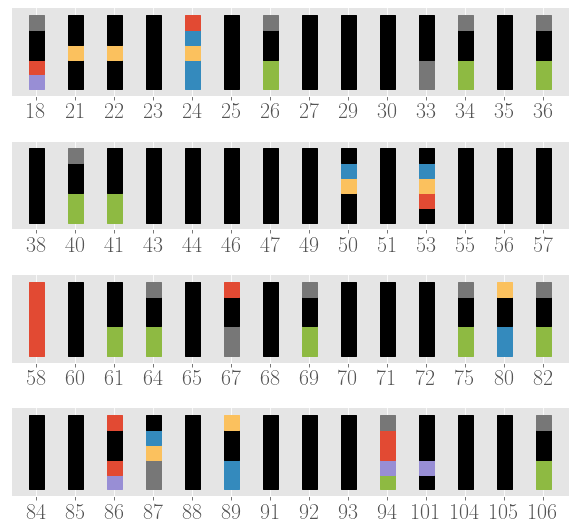

In [3019]:
fig, ax = plt.subplots(4, 1, figsize=(10, 9))
plt.subplots_adjust(hspace=0.5)

j = 1
for fn, color_list in color_lists.items():  
    k = 0
    m = 0
    for subject in subjects:
        c = colors_subjects[fn][subject]
        if (j == 1 or j == 2) and c == 'C4':
            c = 'k'
        if j == 3 and (c == 'C1' or c == 'C2' or c == 'C3' or c == 'C5'):
            c = 'k'
        if j == 4 and (c == 'C2' or c == 'C3' or c == 'C4' or c == 'C5'):
            c = 'k'
        if j == 5 and (c == 'C1' or c == 'C2'):
            c = 'k'
        ax[m].plot(k, j, 's', color = c , ms = 15)
        k += 1
        if k % 14 == 0:
            m += 1
            k = 0
    j += 1
    
for m in range(4):
    ax[m].set_ylim(0, 6)
    ax[m].set_yticks([])
    ax[m].set_xticks([k for k in range(14)])
    ax[m].set_xticklabels(subjects_noOutliers[m*14:(m+1)*14])

plt.show()

In [3111]:
allBlack = [23, 25, 27, 29, 30, 35, 38, 43, 44, 46, 47, 49, 51, 55, 56, 57, 60, 65, 68, 70, 71, 72, 84, 85, 88, 91, 92, 93, 104, 105, 101]
bottomGreen = [41, 61, 26, 34, 36, 40, 64, 69, 75, 82, 106]
secondLayer = [33, 67, 21, 22, 50, 53, 87]
bottomBlue = [24, 80, 89]
leftOvers = [86, 18, 94]
leftOvers2 = set(subjects_noOutliers).difference(allBlack).difference(secondLayer).difference(bottomGreen).difference(bottomBlue).difference(leftOvers)

newOrder = allBlack + bottomGreen + secondLayer+ bottomBlue + leftOvers + list(leftOvers2)

In [3112]:
save

True

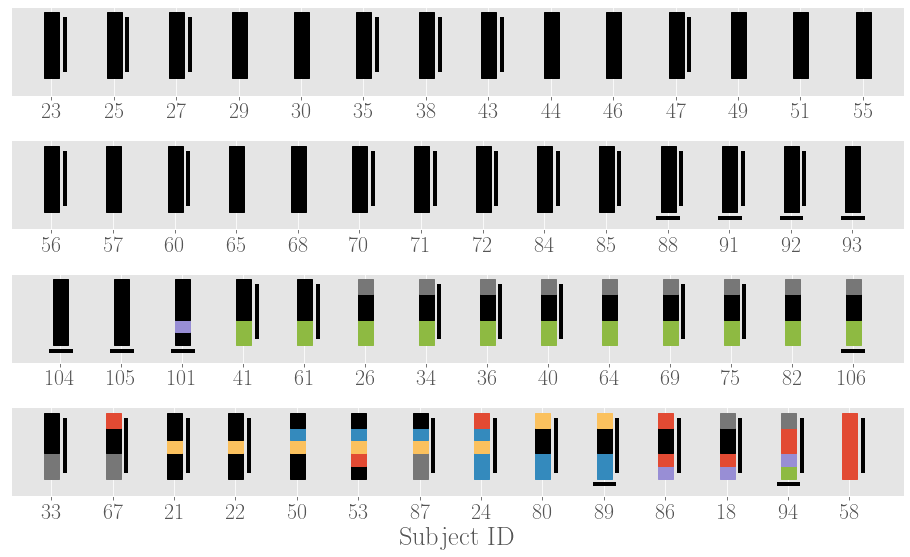

In [3113]:
fig, ax = plt.subplots(4, 1, figsize=(16, 9))
plt.subplots_adjust(hspace=0.5)

j = 1
for fn, color_list in color_lists.items():  
    k = 0
    m = 0
    for subject in newOrder:
        if data.labels[subject] == 'PD_CN_med' :
            vBar = True
            hBar = False
        elif data.labels[subject] == 'PD_MCI_med': 
            vBar = True
            hBar = True
        elif data.labels[subject] == 'PD_CN_nonMed': 
            vBar = False
            hBar = False
        elif data.labels[subject] == 'PD_MCI_nonMed': 
            vBar = False
            hBar = True
        
        if vBar:
            ax[m].plot([k+0.22, k+0.22], [1, 5], color = 'k', linewidth = 4)
            
        if hBar:
            ax[m].plot([k-0.15, k+0.17], [-0.1, -0.1], color = 'k', linewidth = 4)
            
        c = colors_subjects[fn][subject]
        if (j == 1 or j == 2) and c == 'C4':
            c = 'k'
        if j == 3 and (c == 'C1' or c == 'C2' or c == 'C3' or c == 'C5'):
            c = 'k'
        if j == 4 and (c == 'C2' or c == 'C3' or c == 'C4' or c == 'C5'):
            c = 'k'
        if j == 5 and (c == 'C1' or c == 'C2'):
            c = 'k'
        ax[m].plot(k, j, 's', color = c , ms = 15)
        k += 1
        if k % 14 == 0:
            m += 1
            k = 0
    j += 1
    
for m in range(4):
    ax[m].set_ylim(-1, 6)
    ax[m].set_yticks([])
    ax[m].set_xticks([k for k in range(14)])
    ax[m].set_xticklabels(newOrder[m*14:(m+1)*14])

ax[3].set_xlabel('Subject ID')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_subgroups.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

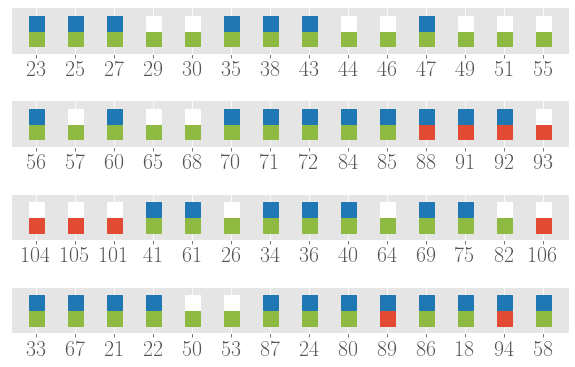

In [3079]:
fig, ax = plt.subplots(4, 1, figsize=(10, 6))
plt.subplots_adjust(hspace=1)

k = 0
m = 0
for subject in newOrder:
    if data.labels[subject] == 'PD_CN_med' :
        c1 = 'C5'
        c2 = 'tab:blue'
    elif data.labels[subject] == 'PD_MCI_med': 
        c1 = 'C0'
        c2 = 'tab:blue'
    elif data.labels[subject] == 'PD_CN_nonMed': 
        c1 = 'C5'
        c2 = 'white'
    elif data.labels[subject] == 'PD_MCI_nonMed': 
        c1 = 'C0'
        c2 = 'white'
    ax[m].plot(k, 1, 's', color = c1 , ms = 15)
    ax[m].plot(k, 2, 's', color = c2 , ms = 15)
    k += 1
    if k % 14 == 0:
        m += 1
        k = 0
j += 1
    
for m in range(4):
    ax[m].set_ylim(0, 3)
    ax[m].set_yticks([])
    ax[m].set_xticks([k for k in range(14)])
    ax[m].set_xticklabels(newOrder[m*14:(m+1)*14])

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_patientLabels.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

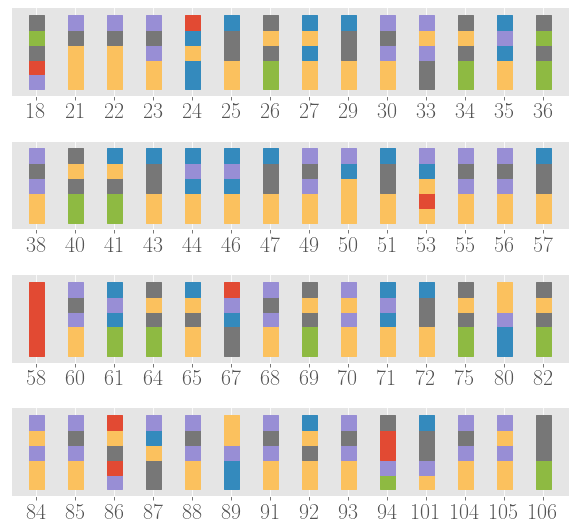

In [3080]:
fig, ax = plt.subplots(4, 1, figsize=(10, 9))
plt.subplots_adjust(hspace=0.5)

j = 1
for fn, color_list in color_lists.items():  
    k = 0
    m = 0
    for subject in subjects:
        c = colors_subjects[fn][subject]
        ax[m].plot(k, j, 's', color = c , ms = 15)
        k += 1
        if k % 14 == 0:
            m += 1
            k = 0
    j += 1
    
for m in range(4):
    ax[m].set_ylim(0, 6)
    ax[m].set_yticks([])
    ax[m].set_xticks([k for k in range(14)])
    ax[m].set_xticklabels(subjects_noOutliers[m*14:(m+1)*14])

plt.show()

In [3107]:
group1 = [50, 21, 22, 23, 30, 38, 49, 55, 56, 60, 68, 85, 88, 91, 93, 104, 70, 84, 105]
group2 = [25, 29, 43, 47, 51, 57, 72, 65, 92, 27]
group3 = [35, 44, 46, 71]
group4 = [41, 26, 34, 40, 64, 69, 75, 82, 36, 106]
group5 = [61, 67, 33, 87, 24, 80, 89, 101, 53]
leftOvers = [86, 58]
leftOvers2 = set(subjects).difference(group1).difference(group2).difference(group3).difference(group4).difference(group5).difference(leftOvers)

newOrder = group1 + group2 + group3+ group4 + group5 + list(leftOvers2) + leftOvers

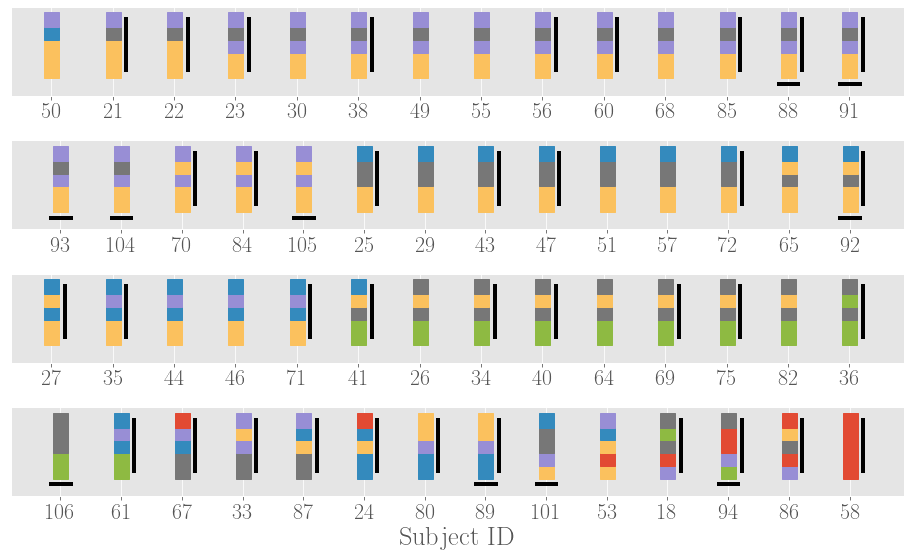

In [3108]:
fig, ax = plt.subplots(4, 1, figsize=(16, 9))
plt.subplots_adjust(hspace=0.5)

j = 1
for fn, color_list in color_lists.items():  
    k = 0
    m = 0
    for subject in newOrder:
        if data.labels[subject] == 'PD_CN_med' :
            vBar = True
            hBar = False
        elif data.labels[subject] == 'PD_MCI_med': 
            vBar = True
            hBar = True
        elif data.labels[subject] == 'PD_CN_nonMed': 
            vBar = False
            hBar = False
        elif data.labels[subject] == 'PD_MCI_nonMed': 
            vBar = False
            hBar = True
        
        if vBar:
            ax[m].plot([k+0.22, k+0.22], [1, 5], color = 'k', linewidth = 4)
            
        if hBar:
            ax[m].plot([k-0.15, k+0.17], [-0.1, -0.1], color = 'k', linewidth = 4)
            
        c = colors_subjects[fn][subject]
        ax[m].plot(k, j, 's', color = c , ms = 15)
        k += 1
        if k % 14 == 0:
            m += 1
            k = 0
    j += 1
    
for m in range(4):
    ax[m].set_ylim(-1, 6)
    ax[m].set_yticks([])
    ax[m].set_xticks([k for k in range(14)])
    ax[m].set_xticklabels(newOrder[m*14:(m+1)*14])

ax[3].set_xlabel('Subject ID')

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_subgroups_noBlack.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

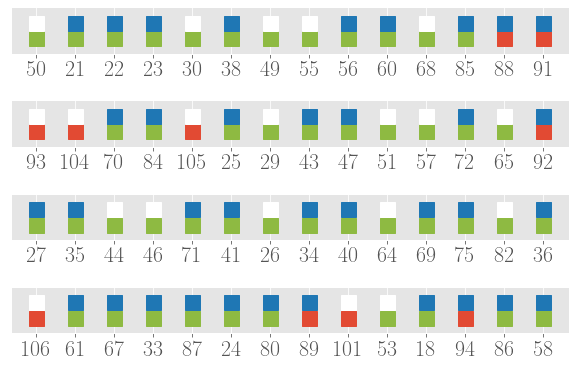

In [3109]:
fig, ax = plt.subplots(4, 1, figsize=(10, 6))
plt.subplots_adjust(hspace=1)

k = 0
m = 0
for subject in newOrder:
    if data.labels[subject] == 'PD_CN_med' :
        c1 = 'C5'
        c2 = 'tab:blue'
    elif data.labels[subject] == 'PD_MCI_med': 
        c1 = 'C0'
        c2 = 'tab:blue'
    elif data.labels[subject] == 'PD_CN_nonMed': 
        c1 = 'C5'
        c2 = 'white'
    elif data.labels[subject] == 'PD_MCI_nonMed': 
        c1 = 'C0'
        c2 = 'white'
    ax[m].plot(k, 1, 's', color = c1 , ms = 15)
    ax[m].plot(k, 2, 's', color = c2 , ms = 15)
    k += 1
    if k % 14 == 0:
        m += 1
        k = 0
j += 1
    
for m in range(4):
    ax[m].set_ylim(0, 3)
    ax[m].set_yticks([])
    ax[m].set_xticks([k for k in range(14)])
    ax[m].set_xticklabels(newOrder[m*14:(m+1)*14])

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_patientLabels_noBlack.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

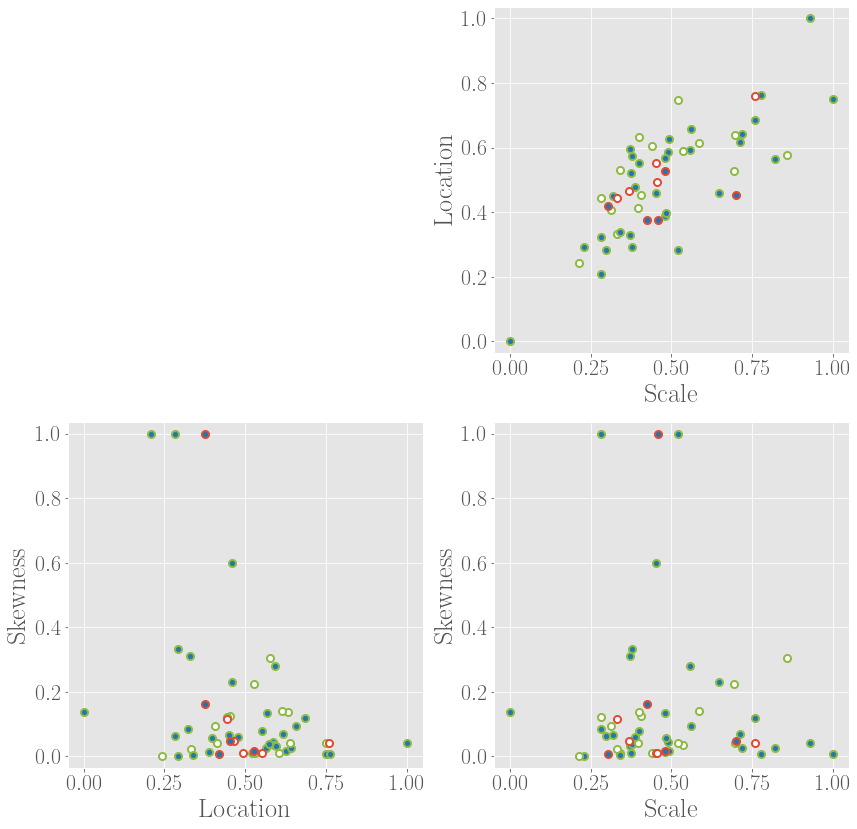

In [3110]:
fig, ax = plt.subplots(2, 2, figsize = (14, 14))
plt.subplots_adjust(wspace=0.2)
plt.subplots_adjust(hspace=0.2)

for subject in subjects_noOutliers:
    if data.labels[subject] == 'PD_CN_med' :
        c1 = 'C5'
        c2 = 'tab:blue'
    elif data.labels[subject] == 'PD_MCI_med': 
        c1 = 'C0'
        c2 = 'tab:blue'
    elif data.labels[subject] == 'PD_CN_nonMed': 
        c1 = 'C5'
        c2 = 'white'
    elif data.labels[subject] == 'PD_MCI_nonMed': 
        c1 = 'C0'
        c2 = 'white'
        
    x = params_H0_1skew_df_scaled.loc[subject][0]
    y = params_H0_1skew_df_scaled.loc[subject][1]
    z = params_H0_1skew_df_scaled.loc[subject][2]
    
    ax[1, 0].plot(y, x, 'o', color = c1, ms=8)
    ax[0, 1].plot(z, y, 'o', color = c1, ms=8)
    ax[1, 1].plot(z, x, 'o', color = c1, ms=8)
    
    ax[1, 0].plot(y, x, 'o', color = c2, ms=4)
    ax[0, 1].plot(z, y, 'o', color = c2, ms=4)
    ax[1, 1].plot(z, x, 'o', color = c2, ms=4)
    
ax[1, 0].set_xlabel(labels[1])
ax[1, 0].set_ylabel(labels[0])
ax[1, 0].axis('equal')

ax[0, 1].set_xlabel(labels[2])
ax[0, 1].set_ylabel(labels[1])
ax[0, 1].axis('equal')

ax[1, 1].set_xlabel(labels[2])
ax[1, 1].set_ylabel(labels[0])
ax[1, 1].axis('equal')

ax[0, 1].set_xlim(-0.05, 1.05)
ax[0, 1].set_ylim(-0.05, 1.05) 
ax[1, 0].set_xlim(-0.05, 1.05)
ax[1, 0].set_ylim(-0.05, 1.05) 
ax[1, 1].set_xlim(-0.05, 1.05)
ax[1, 1].set_ylim(-0.05, 1.05) 

fig.delaxes(ax[0, 0])      

if testing:
    addOn = "test_"
else:
    addOn = ""
if save:
    plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_medCNlabels.jpg", bbox_inches="tight")
if show:
    plt.show()
plt.close()

In [2811]:
interesting_fns

['H0_1skew_4features_average',
 'H0_1skew_3features_average',
 'H1_exponential_3features_average_noOutliers',
 'H1_exponential_2features_average_noOutliers',
 'H0H1_5features_average']

## Pie chart with each wedge location corresponding to a certain run

In [ ]:
def plot_pie(x, ax, centers, r):
    ax.pie([1 for i in range(repeats)], center=(x[centers[0]],x[centers[1]]), radius=r, 
           colors=x[['r'+str(i) for i in range(repeats)]], wedgeprops={'clip_on':True}, frame=True)
    
def plot_piecharts_2by2(params_df, labels, fn):
    
    labels_noisy_total = dict()

    for subject in subjects:
        labels_noisy_total[subject] = dict()

    for i in range(repeats):
        colors = colors_subjects[fn+str(i)]
        label1 = colors[53]
        label2 = colors[18]
        if label1 == label2:
            print('error')
        label3 = ['C1', 'C2', 'C3']
        label3.remove(label1)
        label3.remove(label2)
        label3 = label3[0]

        for subject in subjects:
            if colors[subject] == label1:
                labels_noisy_total[subject][i] = 'C0'
            elif colors[subject] == label2:
                labels_noisy_total[subject][i] = 'C1'
            elif colors[subject] == label3:
                labels_noisy_total[subject][i] = 'C2'
            else:
                print(colors[subject])

    list_of_labels = dict()
    for subject in subjects:
        list_of_labels[subject] = [labels_noisy_total[subject][i] for i in range(repeats)]

    list_of_labels_df = pd.DataFrame.from_dict(list_of_labels).T
    pieplot_df = pd.concat([params_df[[0, 1, 2]], list_of_labels_df], axis = 1)
    pieplot_df.columns = ['x', 'y', 'z'] + ['r'+str(i) for i in range(repeats)]
    
    fig, ax = plt.subplots(2, 2, figsize = (14, 14))
    plt.subplots_adjust(wspace=0.2)
    plt.subplots_adjust(hspace=0.2)

    ax[0, 0].scatter(pieplot_df['x'], pieplot_df['y'], s=0)
    x_init = ax[0, 0].get_xlim()
    pieplot_df.apply(lambda x : plot_pie(x, ax[0, 0], centers = ['x', 'y'], r = (1/np.mean(x_init))*0.01), axis=1)
    ax[0, 0].set_xlabel(labels[0])
    ax[0, 0].set_ylabel(labels[1])
    ax[0, 0].axis('equal')

    ax[0, 1].scatter(pieplot_df['z'], pieplot_df['y'], s=0)
    x_init = ax[0, 1].get_xlim()
    pieplot_df.apply(lambda x : plot_pie(x, ax[0, 1], centers = ['z', 'y'], r = (1/np.mean(x_init))*0.01), axis=1)
    ax[0, 1].set_xlabel(labels[2])
    ax[0, 1].set_ylabel(labels[1])
    ax[0, 1].axis('equal')

    ax[1, 1].scatter(pieplot_df['z'], pieplot_df['x'], s=0)
    x_init = ax[1, 1].get_xlim()
    pieplot_df.apply(lambda x : plot_pie(x, ax[1, 1], centers = ['z', 'x'], r = (1/np.mean(x_init))*0.01), axis=1)
    ax[1, 1].set_xlabel(labels[2])
    ax[1, 1].set_ylabel(labels[0])
    ax[1, 1].axis('equal')

    fig.delaxes(ax[1, 0])

    if testing:
        addOn = "test_"
    else:
        addOn = ""
    if save:
        plt.savefig(fig_path+addOn+"Mspace_comb"+str(comb_id)+"_clustering_"+fn+"_scatterPlot_noisy.jpg", bbox_inches="tight")
    if show:
        plt.show()
    plt.close()

In [ ]:
params_df = params_H0_1skew_df_scaled 
fn = 'distances_complete_H0_noisy'
labels = ['Skewness', 'Location', 'Scale']
plot_piecharts_2by2(params_df, labels, fn)